In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import PolynomialFeatures, MinMaxScaler, StandardScaler
from sklearn.svm import SVR
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestRegressor
import joblib
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima
from prophet import Prophet
from datetime import timedelta
from matplotlib.backends.backend_pdf import PdfPages
import statsmodels.api as sm

In [2]:
pip install xlrd

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


In [4]:
france=pd.read_excel('France.xlsx')
germany=pd.read_excel('Allemagne.xlsx')
switzerland=pd.read_excel('Suisse.xlsx')
portugal=pd.read_excel('Portugal.xlsx')

In [5]:
france.set_index(france.columns[0], inplace=True)
france.index = france.index.astype(str)
france.index = pd.to_datetime(france.index)
france = france.drop(france.columns[[1, 4]], axis=1)
france = france.loc['2000-01-01':]

germany.set_index(germany.columns[0], inplace=True)
germany.index = germany.index.astype(str)
germany.index = pd.to_datetime(germany.index)
germany = germany.drop(germany.columns[[2]], axis=1)
germany = germany.loc['2000-01-01':]

switzerland.set_index(switzerland.columns[0], inplace=True)
switzerland.index = switzerland.index.astype(str)
switzerland.index = pd.to_datetime(switzerland.index)
switzerland = switzerland.drop(switzerland.columns[[1]], axis=1)
switzerland = switzerland.loc['2000-01-01':]

portugal.set_index(portugal.columns[0], inplace=True)
portugal.index = portugal.index.astype(str)
portugal.index = pd.to_datetime(portugal.index)

### 1-Intra country analysis

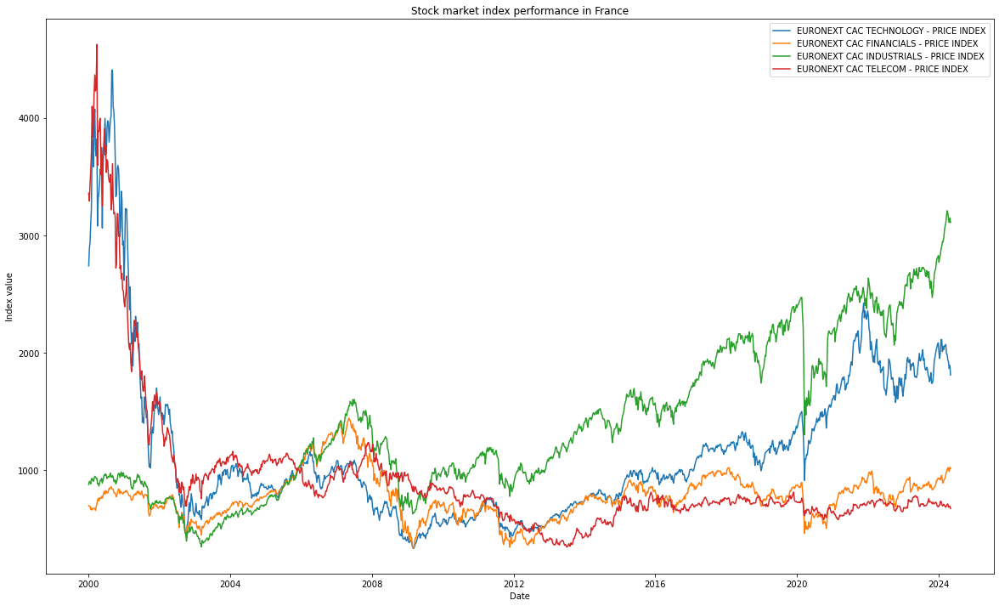

In [6]:
plt.figure(figsize=(20,12))  

for column in france.columns:
    plt.plot(france.index, france[column], label=column)

plt.title("Stock market index performance in France")
plt.xlabel("Date")
plt.ylabel("Index value")
plt.legend()
plt.savefig('Graph France index.pdf', bbox_inches='tight')
plt.show()

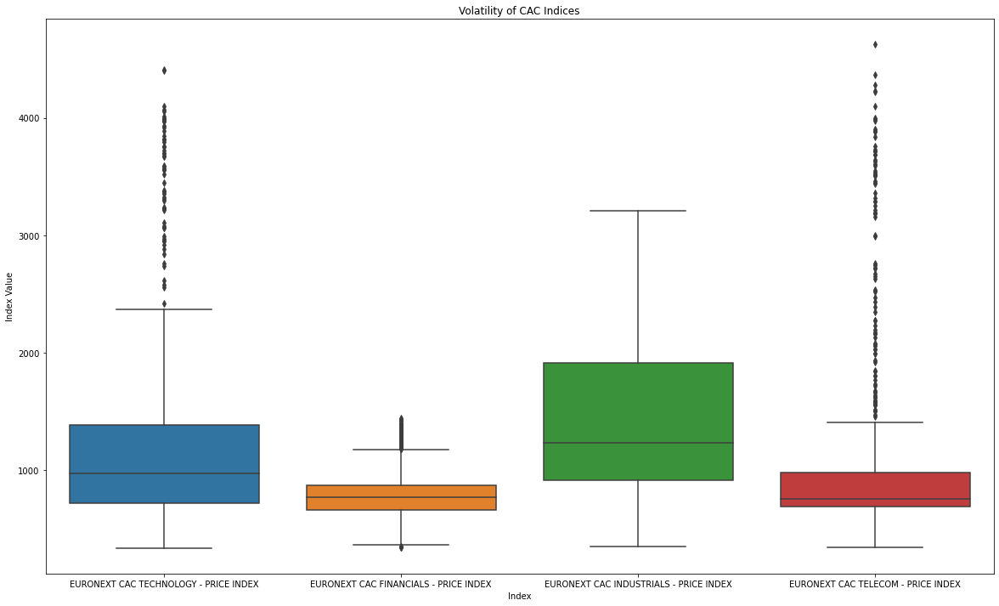

In [7]:
plt.figure(figsize=(20,12))
sns.boxplot(data=france[['EURONEXT CAC TECHNOLOGY - PRICE INDEX', 'EURONEXT CAC FINANCIALS - PRICE INDEX', 'EURONEXT CAC INDUSTRIALS - PRICE INDEX', 'EURONEXT CAC TELECOM - PRICE INDEX']], orient='v')
plt.title('Volatility of CAC Indices')
plt.ylabel('Index Value')
plt.xlabel('Index')
plt.savefig('Boite France index.pdf', bbox_inches='tight')
plt.show()

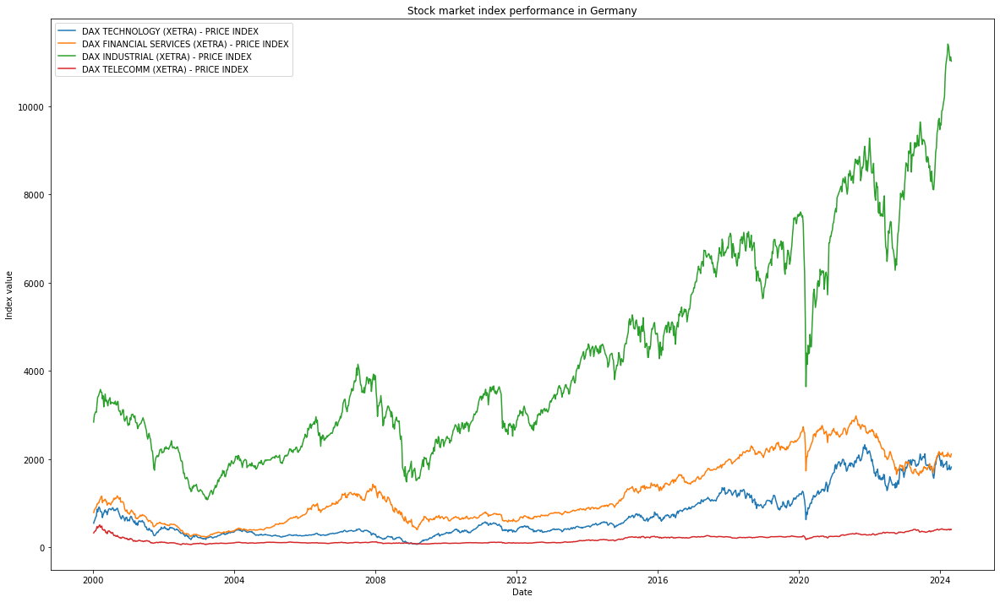

In [8]:
plt.figure(figsize=(20,12))  

for column in germany.columns:
    plt.plot(germany.index, germany[column], label=column)

plt.title("Stock market index performance in Germany")
plt.xlabel("Date")
plt.ylabel("Index value")
plt.legend()
plt.savefig('Graph Germany index.pdf', bbox_inches='tight')
plt.show()

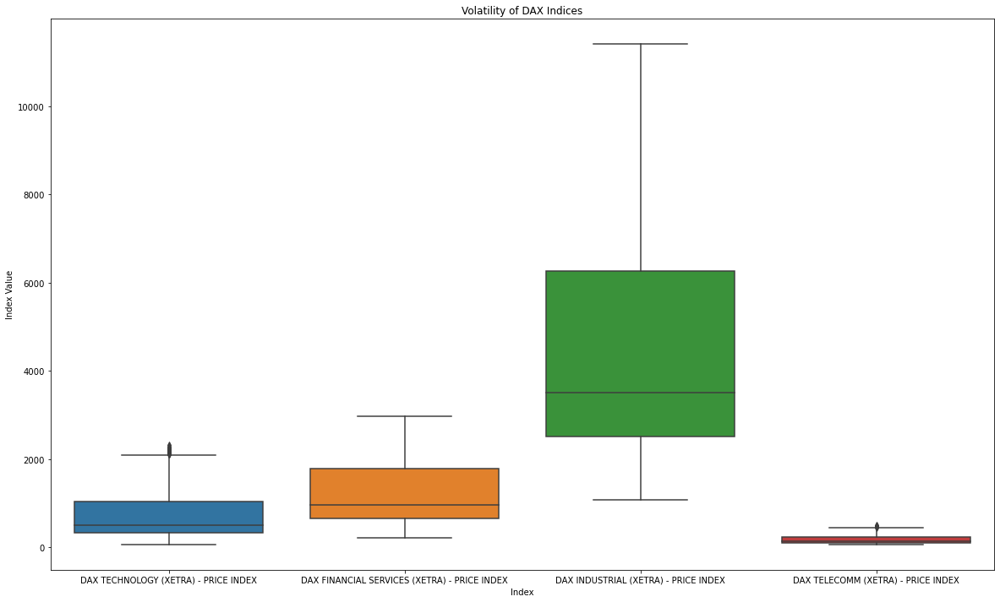

In [9]:
plt.figure(figsize=(20,12))
sns.boxplot(data=germany[['DAX TECHNOLOGY (XETRA) - PRICE INDEX', 'DAX FINANCIAL SERVICES (XETRA) - PRICE INDEX', 'DAX INDUSTRIAL (XETRA) - PRICE INDEX', 'DAX TELECOMM (XETRA) - PRICE INDEX']], orient='v')
plt.title('Volatility of DAX Indices')
plt.ylabel('Index Value')
plt.xlabel('Index')
plt.savefig('Boite Germany index.pdf', bbox_inches='tight')
plt.show()

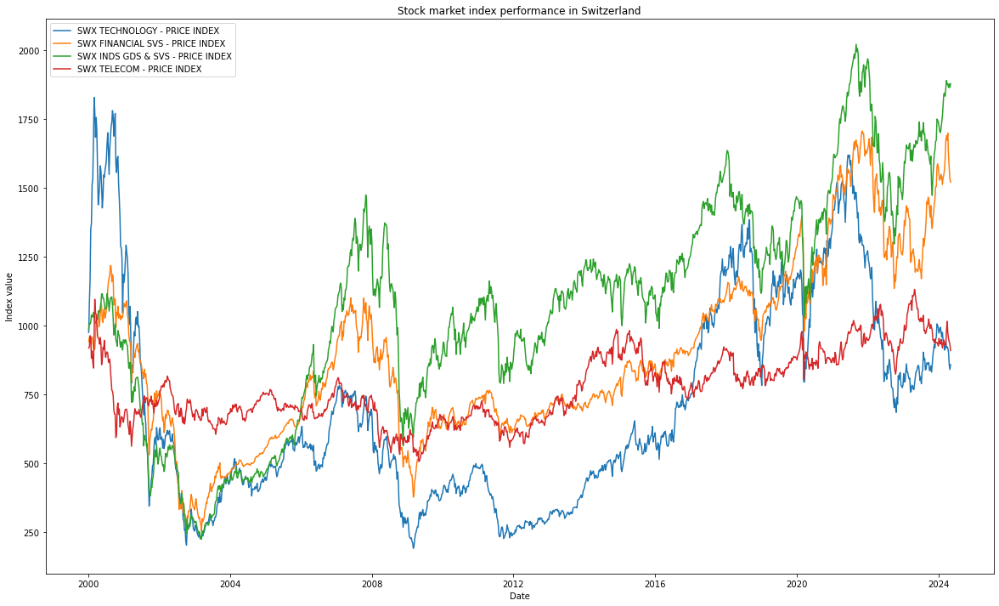

In [10]:
plt.figure(figsize=(20,12))  

for column in switzerland.columns:
    plt.plot(switzerland.index, switzerland[column], label=column)

plt.title("Stock market index performance in Switzerland")
plt.xlabel("Date")
plt.ylabel("Index value")
plt.legend()
plt.savefig('Graph Switzerland index.pdf', bbox_inches='tight')
plt.show()

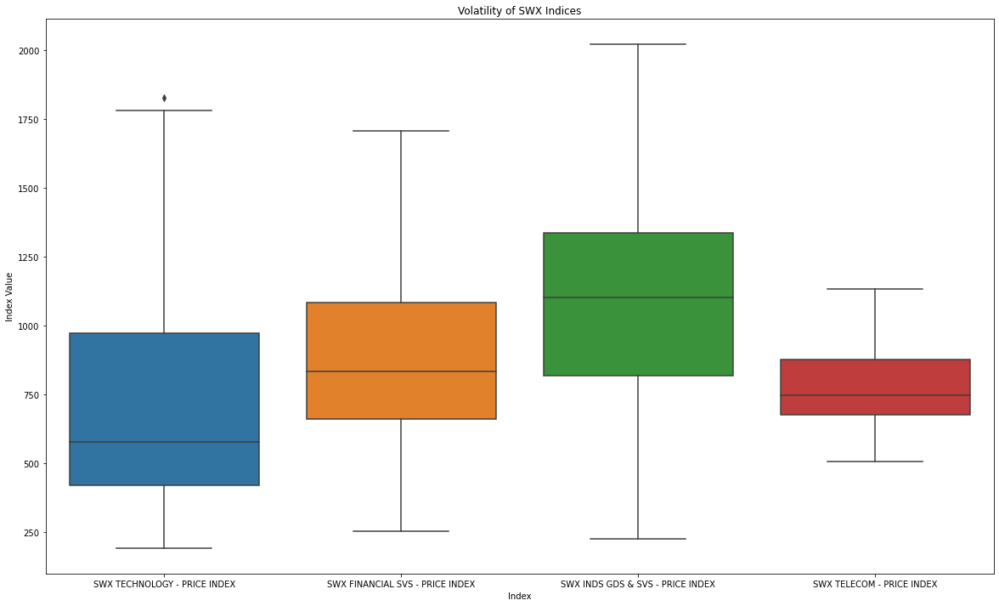

In [11]:
plt.figure(figsize=(20,12))
sns.boxplot(data=switzerland[['SWX TECHNOLOGY - PRICE INDEX', 'SWX FINANCIAL SVS - PRICE INDEX', 'SWX INDS GDS & SVS - PRICE INDEX', 'SWX TELECOM - PRICE INDEX']], orient='v')
plt.title('Volatility of SWX Indices')
plt.ylabel('Index Value')
plt.xlabel('Index')
plt.savefig('Boite Suisse index.pdf', bbox_inches='tight')
plt.show()

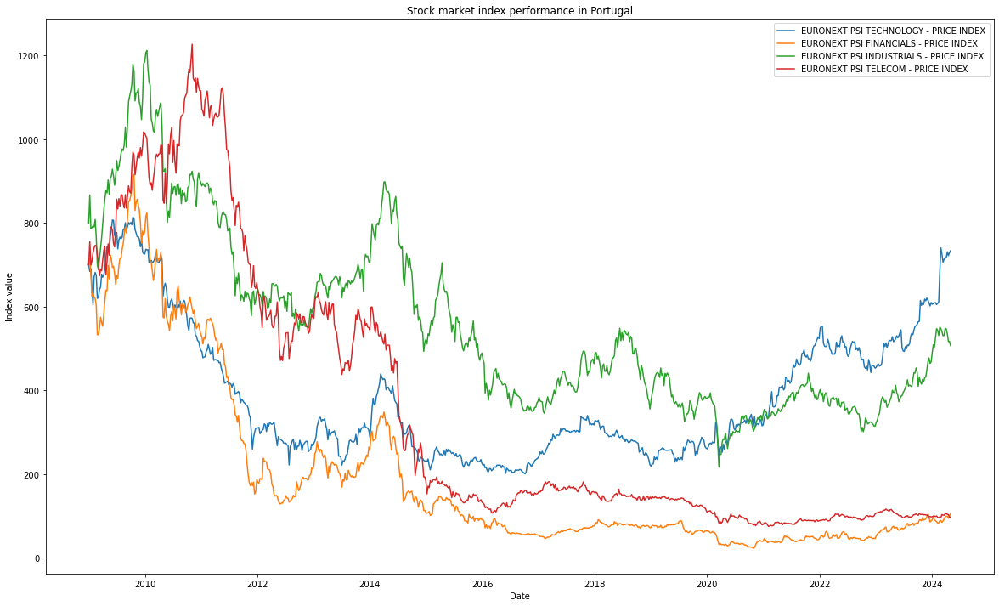

In [12]:
plt.figure(figsize=(20,12))  

for column in portugal.columns:
    plt.plot(portugal.index, portugal[column], label=column)

plt.title("Stock market index performance in Portugal")
plt.xlabel("Date")
plt.ylabel("Index value")
plt.legend()
plt.savefig('Graph Portugal index.pdf', bbox_inches='tight')
plt.show()

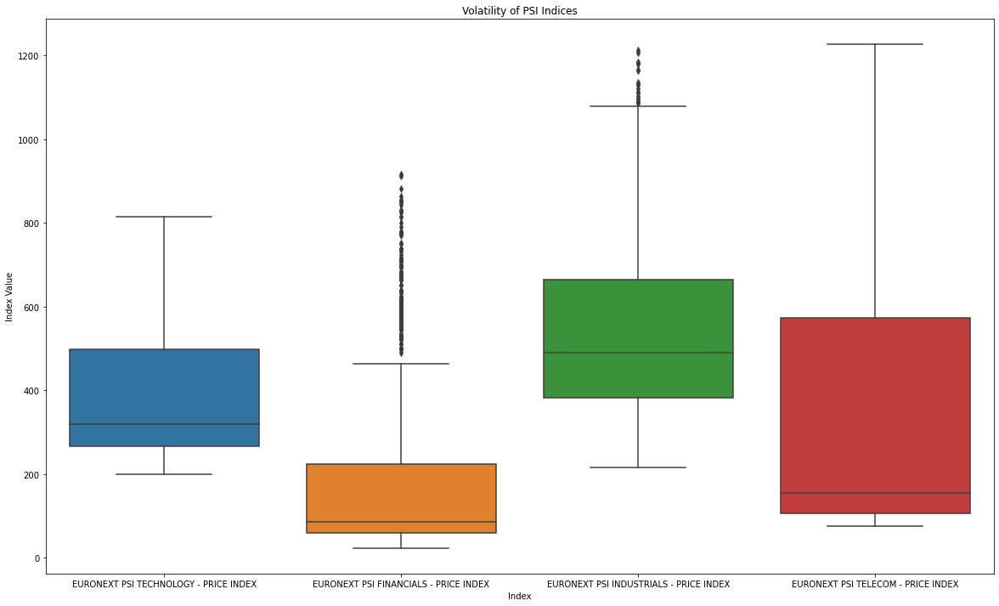

In [13]:
plt.figure(figsize=(20,12))
sns.boxplot(data=portugal[['EURONEXT PSI TECHNOLOGY - PRICE INDEX', 'EURONEXT PSI FINANCIALS - PRICE INDEX', 'EURONEXT PSI INDUSTRIALS - PRICE INDEX', 'EURONEXT PSI TELECOM - PRICE INDEX']], orient='v')
plt.title('Volatility of PSI Indices')
plt.ylabel('Index Value')
plt.xlabel('Index')
plt.savefig('Boite Portugal index.pdf', bbox_inches='tight')
plt.show()

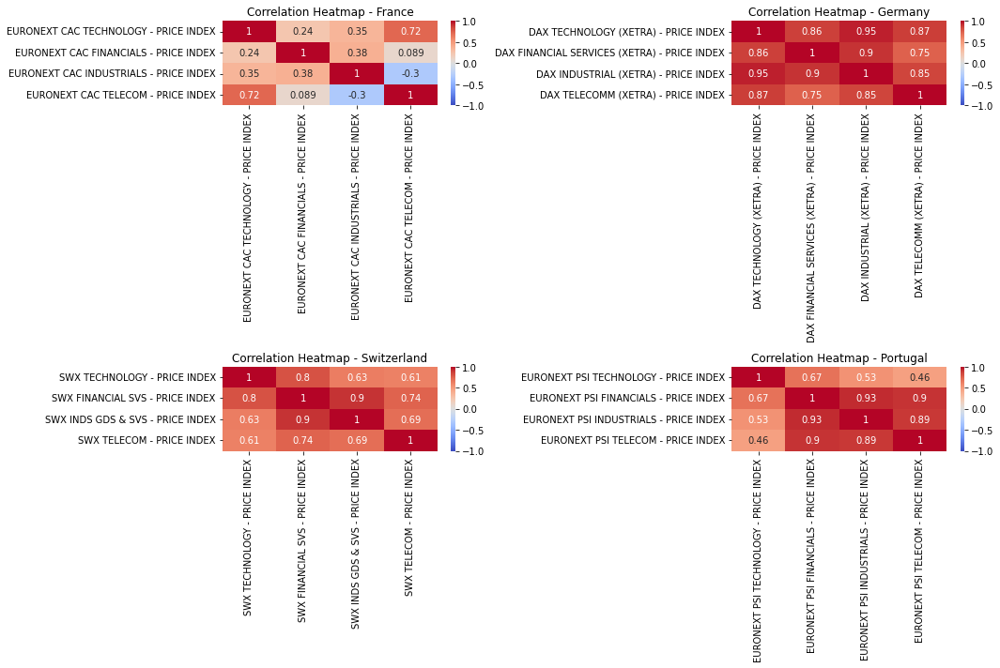

In [14]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10)) 
sns.heatmap(france.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1, ax=axs[0, 0])
axs[0, 0].set_title('Correlation Heatmap - France')
sns.heatmap(germany.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1, ax=axs[0, 1])
axs[0, 1].set_title('Correlation Heatmap - Germany')
sns.heatmap(switzerland.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1, ax=axs[1, 0])
axs[1, 0].set_title('Correlation Heatmap - Switzerland')
sns.heatmap(portugal.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1, ax=axs[1, 1])
axs[1, 1].set_title('Correlation Heatmap - Portugal')
plt.tight_layout()
with PdfPages('countries correlation.pdf') as pdf:
    pdf.savefig(fig)


### 2-Inter country analysis

In [15]:
france.columns = ['Technology', 'Financials', 'Industrials','Telecom']
germany.columns = ['Technology', 'Financials', 'Industrials','Telecom']
switzerland.columns = ['Technology', 'Financials', 'Industrials','Telecom']
switzerland.index = switzerland.index - timedelta(days=1)
portugal.columns = ['Technology', 'Financials', 'Industrials','Telecom']
allindexes = pd.concat([france, germany, switzerland, portugal], axis=1)

technology = pd.concat([france[['Technology']].rename(columns={'Technology': 'France'}),
                           germany[['Technology']].rename(columns={'Technology': 'Germany'}),
                           switzerland[['Technology']].rename(columns={'Technology': 'Switzerland'}),
                           portugal[['Technology']].rename(columns={'Technology': 'Portugal'})], axis=1)

financials = pd.concat([france[['Financials']].rename(columns={'Financials': 'France'}),
                           germany[['Financials']].rename(columns={'Financials': 'Germany'}),
                           switzerland[['Financials']].rename(columns={'Financials': 'Switzerland'}),
                           portugal[['Financials']].rename(columns={'Financials': 'Portugal'})], axis=1)

industrials = pd.concat([france[['Industrials']].rename(columns={'Industrials': 'France'}),
                            germany[['Industrials']].rename(columns={'Industrials': 'Germany'}),
                            switzerland[['Industrials']].rename(columns={'Industrials': 'Switzerland'}),
                            portugal[['Industrials']].rename(columns={'Industrials': 'Portugal'})], axis=1)

telecom = pd.concat([france[['Telecom']].rename(columns={'Telecom': 'France'}),
                        germany[['Telecom']].rename(columns={'Telecom': 'Germany'}),
                        switzerland[['Telecom']].rename(columns={'Telecom': 'Switzerland'}),
                        portugal[['Telecom']].rename(columns={'Telecom': 'Portugal'})], axis=1)

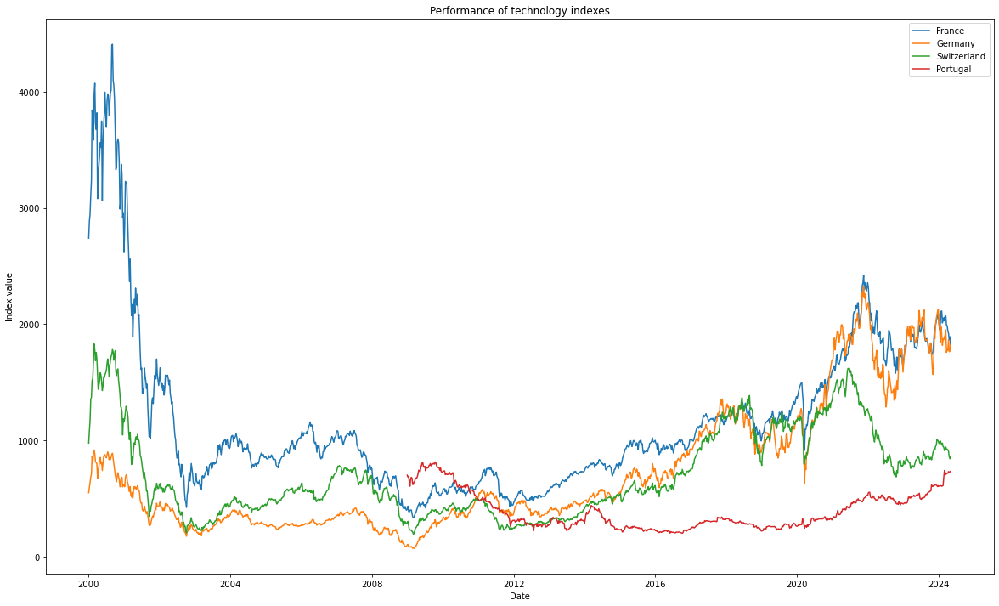

In [16]:
plt.figure(figsize=(20,12))  

for column in technology.columns:
    plt.plot(technology.index, technology[column], label=column)

plt.title("Performance of technology indexes")
plt.xlabel("Date")
plt.ylabel("Index value")
plt.legend()
plt.savefig('Graph Technologie.pdf', bbox_inches='tight')
plt.show()

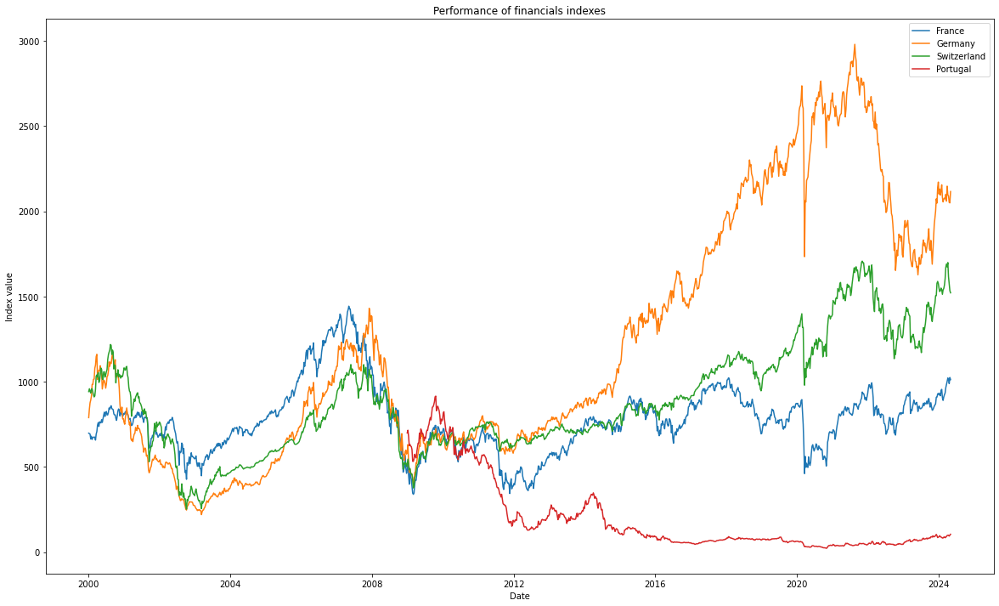

In [17]:
plt.figure(figsize=(20,12))  

for column in financials.columns:
    plt.plot(financials.index, financials[column], label=column)

plt.title("Performance of financials indexes")
plt.xlabel("Date")
plt.ylabel("Index value")
plt.legend()
plt.savefig('Graph financials.pdf', bbox_inches='tight')
plt.show()

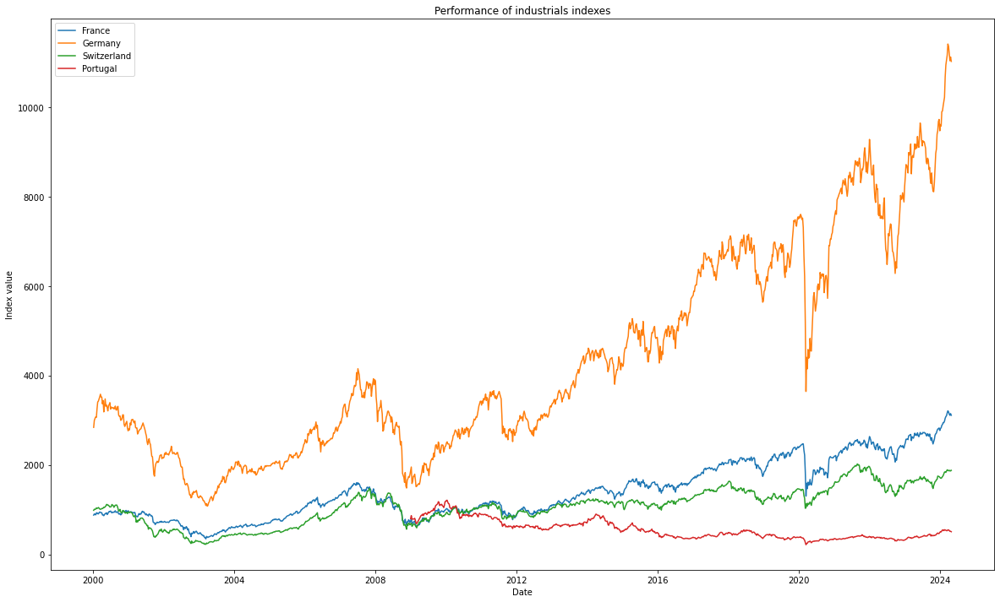

In [18]:
plt.figure(figsize=(20,12))  

for column in industrials.columns:
    plt.plot(industrials.index, industrials[column], label=column)

plt.title("Performance of industrials indexes")
plt.xlabel("Date")
plt.ylabel("Index value")
plt.legend()
plt.savefig('Graph industrials.pdf', bbox_inches='tight')
plt.show()

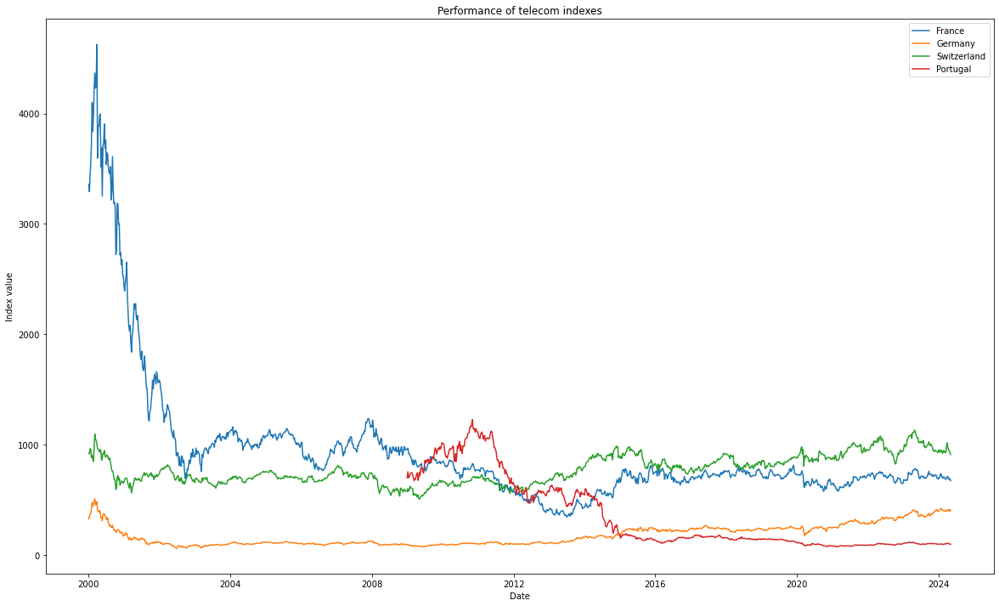

In [19]:
plt.figure(figsize=(20,12))  

for column in telecom.columns:
    plt.plot(telecom.index, telecom[column], label=column)

plt.title("Performance of telecom indexes")
plt.xlabel("Date")
plt.ylabel("Index value")
plt.legend()
plt.savefig('Graph telecom.pdf', bbox_inches='tight')
plt.show()

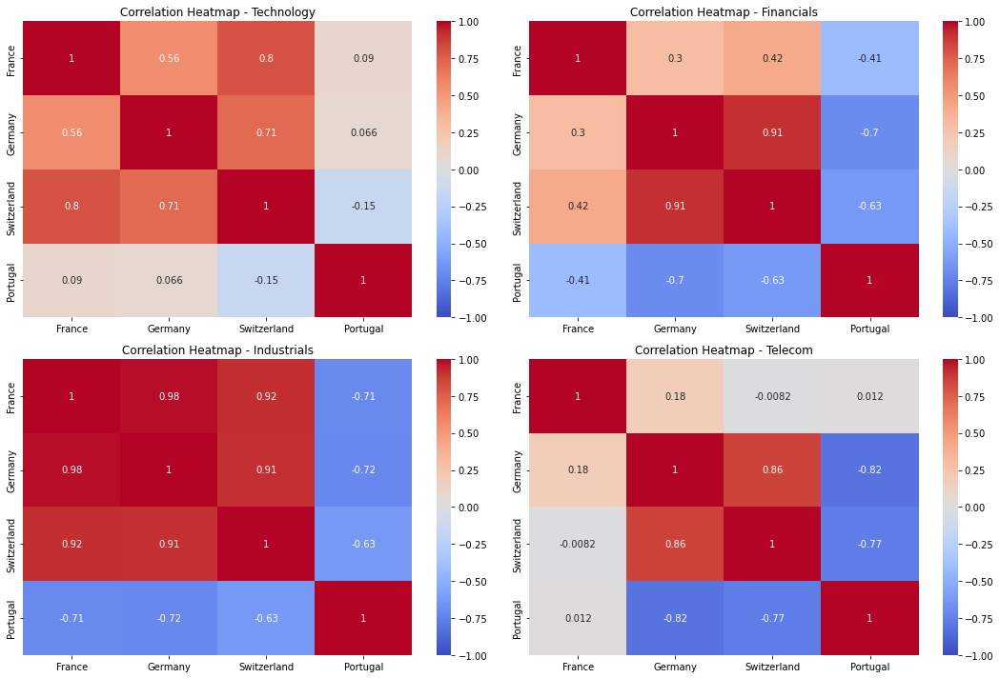

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10)) 
sns.heatmap(technology.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1, ax=axs[0, 0])
axs[0, 0].set_title('Correlation Heatmap - Technology')
sns.heatmap(financials.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1, ax=axs[0, 1])
axs[0, 1].set_title('Correlation Heatmap - Financials')
sns.heatmap(industrials.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1, ax=axs[1, 0])
axs[1, 0].set_title('Correlation Heatmap - Industrials')
sns.heatmap(telecom.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1, ax=axs[1, 1])
axs[1, 1].set_title('Correlation Heatmap - Telecom')
plt.tight_layout()
with PdfPages('sectors correlation.pdf') as pdf:
    pdf.savefig(fig)



### 3-Impact of economic events 

In [21]:
crises_france={'Dotcom bubble burst':['2000-03-01','2002-01-01'],'Subprime crises':['2008-01-01','2009-01-01'],'Covid 19':['2020-01-01','2021-01-01']}
stimulus_policies_france = {'LCME':['2003-01-01','2004-01-01'],'Stimulus policy 2009':['2009-01-01', '2010-01-01'],'Stimulus policy Covid':['2020-03-01','2022-06-01']}

for crisis, (start_date,end_date) in crises_france.items():
    france[crisis] = ((france.index >= pd.to_datetime(start_date)) & (france.index <= pd.to_datetime(end_date))).astype(int)

for policy, (start_date, end_date) in stimulus_policies_france.items():
    france[policy] = ((france.index >= pd.to_datetime(start_date)) & (france.index <= pd.to_datetime(end_date))).astype(int)

crises_germany={'Dotcom bubble burst':['2000-03-01','2002-01-01'],'Subprime crises':['2008-01-01','2009-01-01'],'Covid 19':['2020-01-01','2021-01-01']}
stimulus_policies_germany ={'Hartz and Agenda2010':['2009-01-01', '2010-06-01'],'Konjunkturpaket I':['2008-11-01', '2011-01-01'],'Konjunkturpaket II':['2009-02-01', '2011-01-01'],'Stimulus policy Covid':['2020-03-01','2023-01-01']}

for crisis, (start_date, end_date) in crises_germany.items():
    germany[crisis] = ((germany.index >= pd.to_datetime(start_date)) & (germany.index <= pd.to_datetime(end_date))).astype(int)

for policy, (start_date, end_date) in stimulus_policies_germany.items():
    germany[policy] = ((germany.index >= pd.to_datetime(start_date)) & (germany.index <= pd.to_datetime(end_date))).astype(int)

crises_switzerland={'Dotcom bubble burst':['2000-03-01','2002-01-01'],'Subprime crises':['2008-01-01','2009-01-01'],'Covid 19':['2020-01-01','2021-01-01']}
stimulus_policies_switzerland={'Stimulus policy 2001':['2001-05-01','2003-05-01'],'Stimulus policy 2009':['2009-01-01', '2010-01-01'],'Stimulus policy Covid':['2020-04-01','2023-01-01']}

for crisis, (start_date, end_date) in crises_switzerland.items():
    switzerland[crisis] = ((switzerland.index >= pd.to_datetime(start_date)) & (switzerland.index <= pd.to_datetime(end_date))).astype(int)

for policy, (start_date, end_date) in stimulus_policies_switzerland.items():
    switzerland[policy] = ((switzerland.index >= pd.to_datetime(start_date)) & (switzerland.index <= pd.to_datetime(end_date))).astype(int)

crises_portugal={'Sovereign debt crisis':['2010-01-01','2012-01-01'],'Covid 19':['2020-01-01','2021-01-01']}
stimulus_policies_portugal={'Stimulus debt crisis':['2011-05-01','2014-05-01'],'Political Instability':['2014-01-01','2015-01-01'],'Stimulus policy Covid':['2020-03-01','2022-06-01']}

for crisis, (start_date, end_date) in crises_portugal.items():
    portugal[crisis] = ((portugal.index >= pd.to_datetime(start_date))& (portugal.index <= pd.to_datetime(end_date))).astype(int)

for policy, (start_date, end_date) in stimulus_policies_portugal.items():
    portugal[policy] = ((portugal.index >= pd.to_datetime(start_date)) & (portugal.index <= pd.to_datetime(end_date))).astype(int)


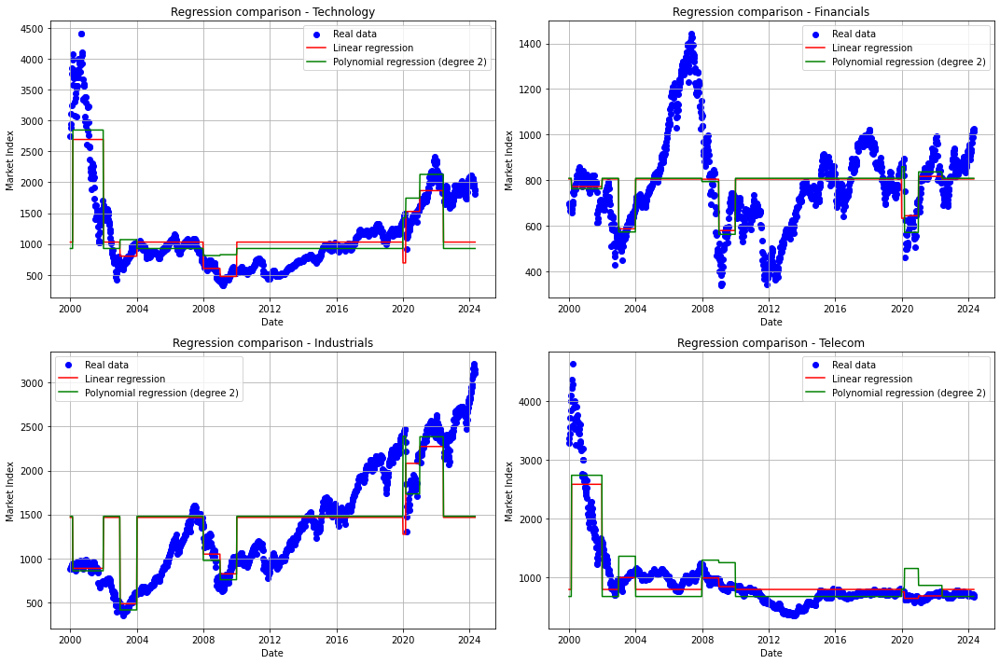

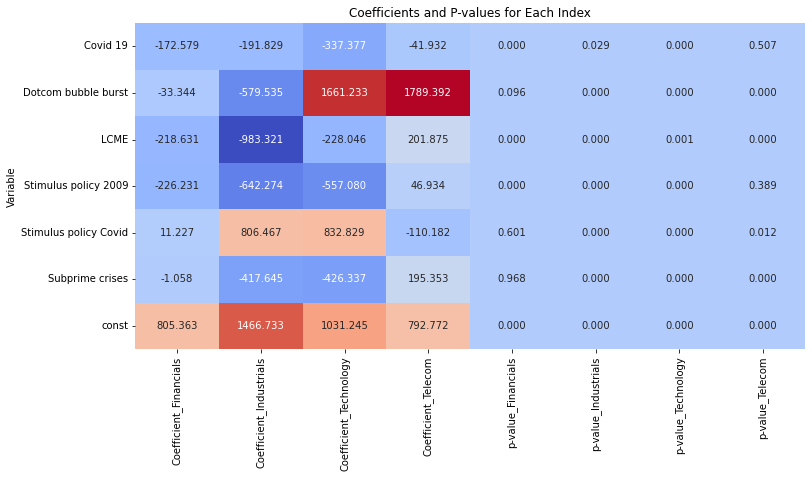

In [22]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
control_var_france = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'LCME','Stimulus policy 2009', 'Stimulus policy Covid'] # Variable de contrôle utilisée dans toutes les régressions

poly_degree = 2
poly = PolynomialFeatures(degree=poly_degree)

fig, axs = plt.subplots(2, 2, figsize=(15, 10))
axs = axs.flatten()

results_france = pd.DataFrame()


for i, index in enumerate(indices):
    X = france[control_var_france].values  
    y = france[index].values  

    lin_reg = LinearRegression()
    lin_reg.fit(X, y)
    y_pred_lin = lin_reg.predict(X)

    X_poly = poly.fit_transform(X)
    poly_reg = LinearRegression()
    poly_reg.fit(X_poly, y)
    y_pred_poly = poly_reg.predict(X_poly)

    X_sm = sm.add_constant(france[control_var_france])
    model = sm.OLS(y, X_sm).fit()

    results_index = pd.DataFrame({'Coefficient': model.params,'p-value': model.pvalues})
    results_index['Indice'] = index
    results_index.reset_index(inplace=True)
    results_index.rename(columns={'index': 'Variable'}, inplace=True)

    results_france = pd.concat([results_france, results_index], axis=0)

    dates = france.index
    axs[i].scatter(dates, y, color='blue', label='Real data')
    axs[i].plot(dates, y_pred_lin, color='red', label='Linear regression')
    axs[i].plot(dates, y_pred_poly, color='green', label=f'Polynomial regression (degree {poly_degree})')
    axs[i].set_title(f'Regression comparison - {index}')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Market Index')
    axs[i].legend()
    axs[i].grid(True)

plt.tight_layout()
fig.savefig('regression_france.pdf', format='pdf')
plt.show()

results_france = results_france.pivot(index='Variable', columns='Indice', values=['Coefficient', 'p-value'])
results_france.columns = ['_'.join(col).strip() for col in results_france.columns.values]

plt.figure(figsize=(12, 6))
sns.heatmap(results_france, annot=True, fmt=".3f", cmap='coolwarm', cbar=False)
plt.title('Coefficients and P-values for Each Index')
plt.savefig('regression table france.pdf', format='pdf')
plt.show()


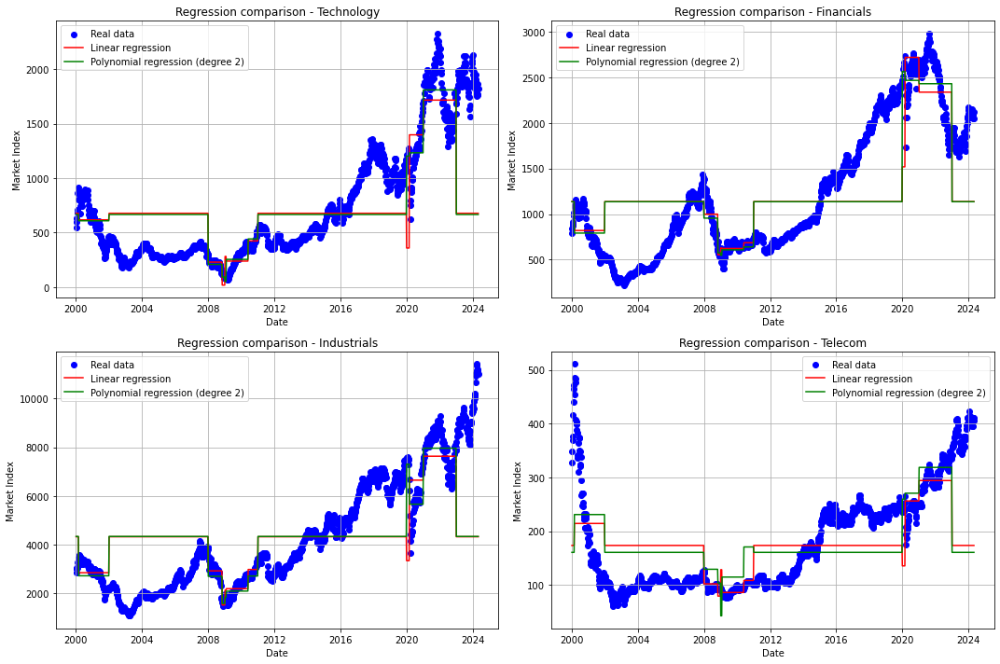

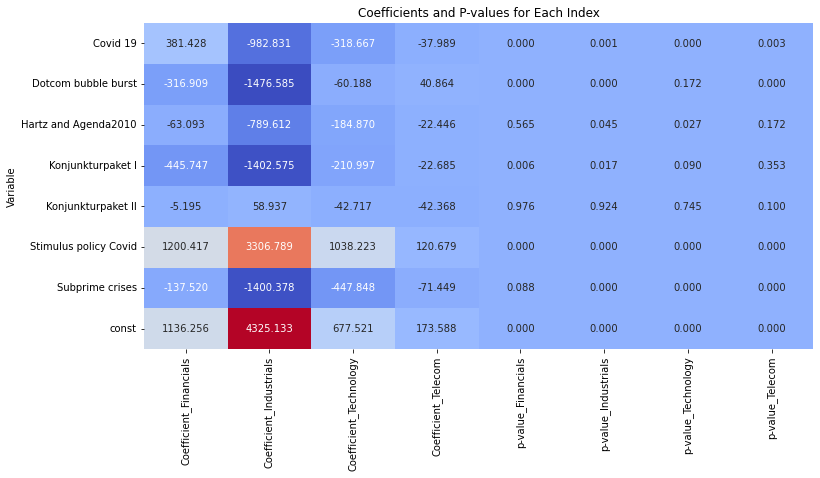

In [23]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
control_var_germany = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19','Hartz and Agenda2010', 'Konjunkturpaket I', 'Konjunkturpaket II','Stimulus policy Covid']

poly_degree = 2
poly = PolynomialFeatures(degree=poly_degree)


fig, axs = plt.subplots(2, 2, figsize=(15, 10))
axs = axs.flatten()

results_germany = pd.DataFrame()

for i, index in enumerate(indices):
    X = germany[control_var_germany].values  
    y = germany[index].values 

    lin_reg = LinearRegression()
    lin_reg.fit(X, y)
    y_pred_lin = lin_reg.predict(X)

    X_poly = poly.fit_transform(X)
    poly_reg = LinearRegression()
    poly_reg.fit(X_poly, y)
    y_pred_poly = poly_reg.predict(X_poly)

    X_sm = sm.add_constant(germany[control_var_germany])
    model = sm.OLS(y, X_sm).fit()

    results_index = pd.DataFrame({'Coefficient': model.params,'p-value': model.pvalues})
    results_index['Indice'] = index
    results_index.reset_index(inplace=True)
    results_index.rename(columns={'index': 'Variable'}, inplace=True)

    results_germany = pd.concat([results_germany, results_index], axis=0)

    dates = germany.index
    axs[i].scatter(dates, y, color='blue', label='Real data')
    axs[i].plot(dates, y_pred_lin, color='red', label='Linear regression')
    axs[i].plot(dates, y_pred_poly, color='green', label=f'Polynomial regression (degree {poly_degree})')
    axs[i].set_title(f'Regression comparison - {index}')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Market Index')
    axs[i].legend()
    axs[i].grid(True)

plt.tight_layout()
fig.savefig('regression_germany.pdf', format='pdf')
plt.show()

results_germany = results_germany.pivot(index='Variable', columns='Indice', values=['Coefficient', 'p-value'])
results_germany.columns = ['_'.join(col).strip() for col in results_germany.columns.values]

plt.figure(figsize=(12, 6))
sns.heatmap(results_germany, annot=True, fmt=".3f", cmap='coolwarm', cbar=False)
plt.title('Coefficients and P-values for Each Index')
plt.savefig('regression table germany.pdf', format='pdf')
plt.show()


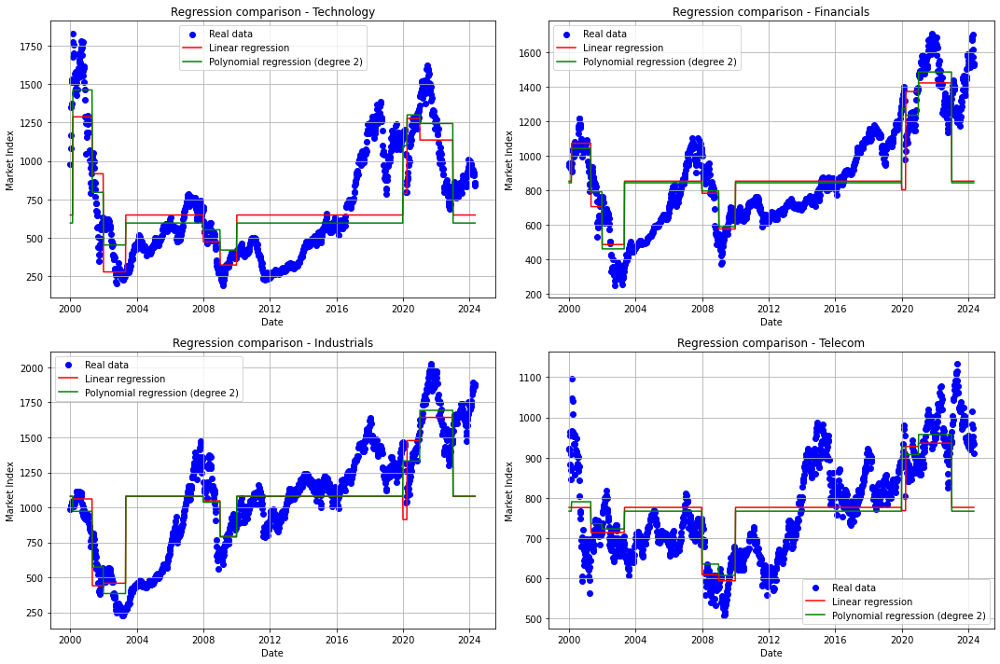

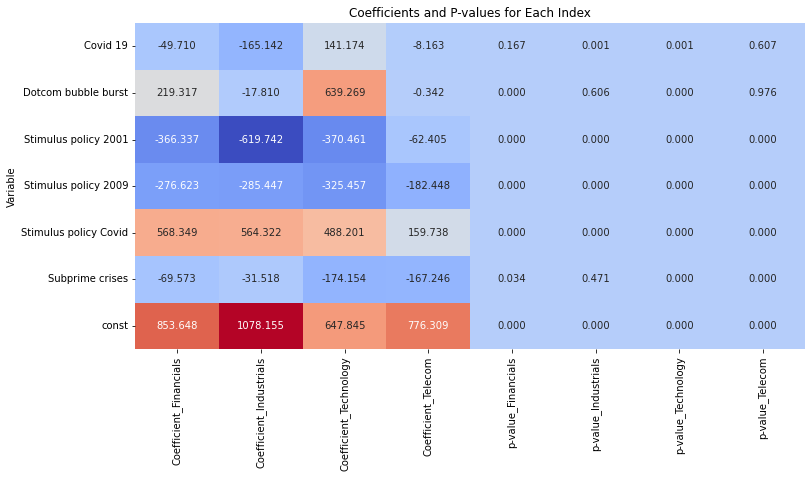

In [24]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
control_var_switzerland = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19','Stimulus policy 2001', 'Stimulus policy 2009','Stimulus policy Covid']

poly_degree = 2
poly = PolynomialFeatures(degree=poly_degree)


fig, axs = plt.subplots(2, 2, figsize=(15, 10))
axs = axs.flatten()

results_switzerland = pd.DataFrame()

for i, index in enumerate(indices):
    X = switzerland[control_var_switzerland].values  
    y = switzerland[index].values  

    lin_reg = LinearRegression()
    lin_reg.fit(X, y)
    y_pred_lin = lin_reg.predict(X)

    X_poly = poly.fit_transform(X)
    poly_reg = LinearRegression()
    poly_reg.fit(X_poly, y)
    y_pred_poly = poly_reg.predict(X_poly)

    X_sm = sm.add_constant(switzerland[control_var_switzerland])
    model = sm.OLS(y, X_sm).fit()

    results_index = pd.DataFrame({'Coefficient': model.params,'p-value': model.pvalues})
    results_index['Indice'] = index
    results_index.reset_index(inplace=True)
    results_index.rename(columns={'index': 'Variable'}, inplace=True)

    results_switzerland = pd.concat([results_switzerland, results_index], axis=0)

    dates = switzerland.index
    axs[i].scatter(dates, y, color='blue', label='Real data')
    axs[i].plot(dates, y_pred_lin, color='red', label='Linear regression')
    axs[i].plot(dates, y_pred_poly, color='green', label=f'Polynomial regression (degree {poly_degree})')
    axs[i].set_title(f'Regression comparison - {index}')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Market Index')
    axs[i].legend()
    axs[i].grid(True)

plt.tight_layout()
fig.savefig('regression_switzerland.pdf', format='pdf')
plt.show()

results_switzerland = results_switzerland.pivot(index='Variable', columns='Indice', values=['Coefficient', 'p-value'])
results_switzerland.columns = ['_'.join(col).strip() for col in results_switzerland.columns.values]

plt.figure(figsize=(12, 6))
sns.heatmap(results_switzerland, annot=True, fmt=".3f", cmap='coolwarm', cbar=False)
plt.title('Coefficients and P-values for Each Index')
plt.savefig('regression table switzerland.pdf', format='pdf')
plt.show()


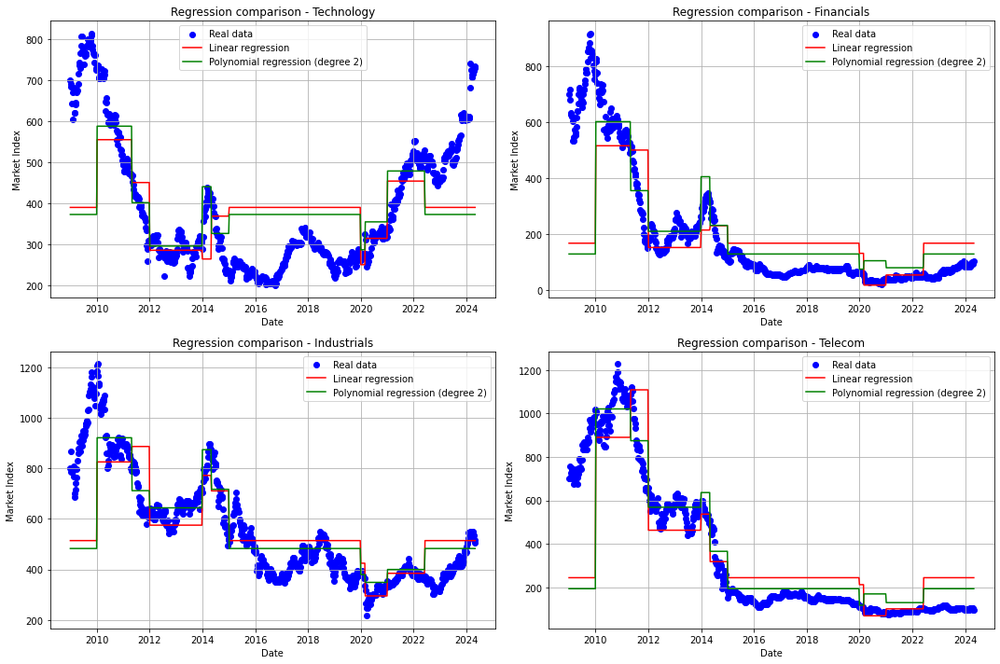

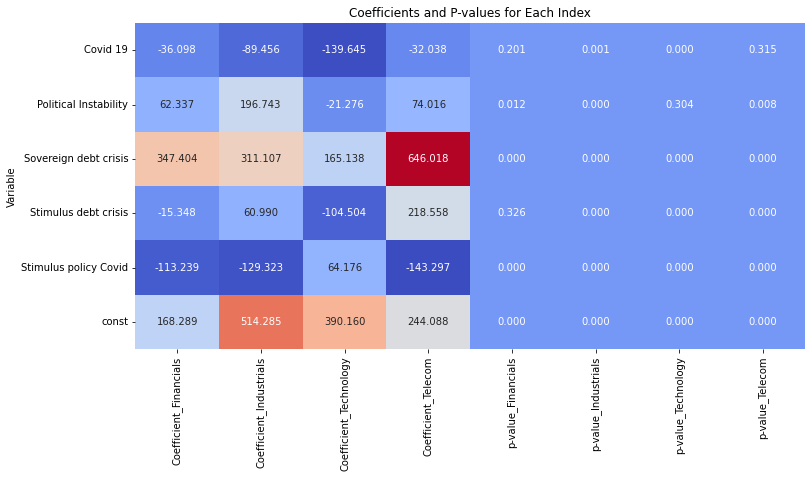

In [25]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
control_var_portugal = ['Sovereign debt crisis', 'Covid 19', 'Stimulus debt crisis','Political Instability', 'Stimulus policy Covid']

poly_degree = 2
poly = PolynomialFeatures(degree=poly_degree)

fig, axs = plt.subplots(2, 2, figsize=(15, 10))
axs = axs.flatten()

results_portugal = pd.DataFrame()

for i, index in enumerate(indices):
    X = portugal[control_var_portugal].values  
    y = portugal[index].values 

    lin_reg = LinearRegression()
    lin_reg.fit(X, y)
    y_pred_lin = lin_reg.predict(X)

    X_poly = poly.fit_transform(X)
    poly_reg = LinearRegression()
    poly_reg.fit(X_poly, y)
    y_pred_poly = poly_reg.predict(X_poly)

    X_sm = sm.add_constant(portugal[control_var_portugal])
    model = sm.OLS(y, X_sm).fit()

    results_index = pd.DataFrame({'Coefficient': model.params,'p-value': model.pvalues})
    results_index['Indice'] = index
    results_index.reset_index(inplace=True)
    results_index.rename(columns={'index': 'Variable'}, inplace=True)

    results_portugal = pd.concat([results_portugal, results_index], axis=0)

    dates = portugal.index
    axs[i].scatter(dates, y, color='blue', label='Real data')
    axs[i].plot(dates, y_pred_lin, color='red', label='Linear regression')
    axs[i].plot(dates, y_pred_poly, color='green', label=f'Polynomial regression (degree {poly_degree})')
    axs[i].set_title(f'Regression comparison - {index}')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Market Index')
    axs[i].legend()
    axs[i].grid(True)

plt.tight_layout()
fig.savefig('regression_portugal.pdf', format='pdf')
plt.show()

results_portugal = results_portugal.pivot(index='Variable', columns='Indice', values=['Coefficient', 'p-value'])
results_portugal.columns = ['_'.join(col).strip() for col in results_portugal.columns.values]

plt.figure(figsize=(12, 6))
sns.heatmap(results_portugal, annot=True, fmt=".3f", cmap='coolwarm', cbar=False)
plt.title('Coefficients and P-values for Each Index')
plt.savefig('regression table portugal.pdf', format='pdf')
plt.show()


### 4-The importance of macroeconomic variables

In [26]:
bond=pd.read_excel('10Y Bond.xlsx')
bci=pd.read_excel('bci.xlsx')
cci=pd.read_excel('CCI.xlsx')
exchangerate=pd.read_excel('Exchange rate.xlsx')
gdp=pd.read_excel('GDP.xlsx')
inflation=pd.read_excel('Inflation.xlsx')

In [27]:
def load_excel_with_dates(file_path, date_column):
    df = pd.read_excel(file_path, parse_dates=[date_column], index_col=date_column)
    return df

bond = load_excel_with_dates('10Y Bond.xlsx', 0)  
bci = load_excel_with_dates('bci.xlsx', 0)
cci = load_excel_with_dates('CCI.xlsx', 0)
exchangerate = load_excel_with_dates('Exchange rate.xlsx', 0)
gdp = load_excel_with_dates('GDP.xlsx', 0)
inflation = load_excel_with_dates('Inflation.xlsx', 0)
unemployment=load_excel_with_dates('unemployment.xlsx', 0)

In [28]:
def quarter_to_date(quarter):
    year = int(quarter.split()[1])
    q = quarter.split()[0]
    if q == 'Q1':
        return pd.Timestamp(f'{year}-01-01')
    elif q == 'Q2':
        return pd.Timestamp(f'{year}-04-01')
    elif q == 'Q3':
        return pd.Timestamp(f'{year}-07-01')
    elif q == 'Q4':
        return pd.Timestamp(f'{year}-10-01')
    else:
        raise ValueError(f"Trimestre non reconnu : {quarter}")

date_index = pd.Index([quarter_to_date(q) for q in cci.index])
cci.index = date_index

date_index = pd.Index([quarter_to_date(q) for q in unemployment.index])
unemployment.index=date_index

In [29]:
bond = bond.loc['2000-01-01':]
numeric_columns = bond.select_dtypes(include=np.number).columns
bond = bond[numeric_columns].apply(np.log1p)

bci = bci.loc['2000-01-01':]
scaler = MinMaxScaler()
numeric_columns = bci.select_dtypes(include=np.number).columns
bci[numeric_columns] = scaler.fit_transform(bci[numeric_columns])

cci = cci.loc['2000-01-01':]
scaler = MinMaxScaler()
numeric_columns = cci.select_dtypes(include=np.number).columns
cci[numeric_columns] = scaler.fit_transform(cci[numeric_columns])

gdp = gdp.loc['2000-01-01':]
numeric_columns = gdp.select_dtypes(include=np.number).columns
gdp_normalized = gdp[numeric_columns].apply(np.log1p)

exchangerate = exchangerate.loc['2000-01-01':]

inflation = inflation.loc['2000-01-01':]
inflation = inflation.drop(inflation.columns[[4]], axis=1)

unemployment = unemployment.loc['2000-01-01':]
scaler = MinMaxScaler()
numeric_columns = unemployment.select_dtypes(include=np.number).columns
unemployment[numeric_columns] = scaler.fit_transform(unemployment[numeric_columns])

In [30]:
def to_weekly(macro_df, method='ffill'):
    macro_df.index = pd.to_datetime(macro_df.index, errors='coerce')
    if method == 'ffill':
        weekly_df = macro_df.resample('W-SUN').ffill()
    elif method == 'interpolate':
        weekly_df = macro_df.resample('W-SUN').interpolate(method='linear')
    else:
        raise ValueError(f"Unknown method: {method}")
    
    return weekly_df

In [31]:
bond_weekly = to_weekly(bond, method='ffill')
bond_weekly.index = bond_weekly.index + pd.DateOffset(days=3)
start_date = '2000-01-05'
end_date = '2024-05-01'
new_index = pd.date_range(start=start_date, end=end_date, freq='W-WED')
bond_weekly = bond_weekly.reindex(new_index)
bond_weekly = bond_weekly[(bond_weekly.index >= start_date) & (bond_weekly.index <= end_date)]
bond_weekly = bond_weekly.apply(pd.to_numeric, errors='coerce')
bond_weekly.fillna(method='bfill', inplace=True)
bond_weekly.interpolate(method='linear', inplace=True)

In [32]:
bci_weekly = to_weekly(bci, method='ffill')
bci_weekly.index = bci_weekly.index + pd.DateOffset(days=3)
start_date = '2000-01-05'
end_date = '2024-05-01'
new_index = pd.date_range(start=start_date, end=end_date, freq='W-WED')
bci_weekly = bci_weekly.reindex(new_index)
bci_weekly = bci_weekly[(bci_weekly.index >= start_date) & (bci_weekly.index <= end_date)]
bci_weekly = bci_weekly.apply(pd.to_numeric, errors='coerce')
bci_weekly.fillna(method='bfill', inplace=True)
bci_weekly.interpolate(method='linear', inplace=True)

In [33]:
cci_weekly = to_weekly(cci, method='ffill')
cci_weekly.index = cci_weekly.index + pd.DateOffset(days=3)
start_date = '2000-01-05'
end_date = '2024-05-01'
new_index = pd.date_range(start=start_date, end=end_date, freq='W-WED')
cci_weekly = cci_weekly.reindex(new_index)
cci_weekly = cci_weekly[(cci_weekly.index >= start_date) & (cci_weekly.index <= end_date)]
cci_weekly = cci_weekly.apply(pd.to_numeric, errors='coerce')
cci_weekly.fillna(method='bfill', inplace=True)
cci_weekly.interpolate(method='linear', inplace=True)

In [34]:
gdp_weekly = to_weekly(gdp, method='ffill')
gdp_weekly.index = gdp_weekly.index + pd.DateOffset(days=3)
start_date = '2000-01-05'
end_date = '2024-05-01'
new_index = pd.date_range(start=start_date, end=end_date, freq='W-WED')
gdp_weekly = gdp_weekly.reindex(new_index)
gdp_weekly = gdp_weekly[(gdp_weekly.index >= start_date) & (gdp_weekly.index <= end_date)]
gdp_weekly = gdp_weekly.apply(pd.to_numeric, errors='coerce')
gdp_weekly.fillna(method='bfill', inplace=True)
gdp_weekly.interpolate(method='linear', inplace=True)

In [35]:
gdp_weekly_normalized = to_weekly(gdp_normalized, method='ffill')
gdp_weekly_normalized.index = gdp_weekly_normalized.index + pd.DateOffset(days=3)
start_date = '2000-01-05'
end_date = '2024-05-01'
new_index = pd.date_range(start=start_date, end=end_date, freq='W-WED')
gdp_weekly_normalized = gdp_weekly_normalized.reindex(new_index)
gdp_weekly_normalized = gdp_weekly_normalized[(gdp_weekly_normalized.index >= start_date) & (gdp_weekly_normalized.index <= end_date)]
gdp_weekly_normalized = gdp_weekly_normalized.apply(pd.to_numeric, errors='coerce')
gdp_weekly_normalized.fillna(method='bfill', inplace=True)
gdp_weekly_normalized.interpolate(method='linear', inplace=True)

In [36]:
inflation_weekly = to_weekly(inflation, method='ffill')
inflation_weekly.index = inflation_weekly.index + pd.DateOffset(days=3)
start_date = '2000-01-05'
end_date = '2024-05-01'
new_index = pd.date_range(start=start_date, end=end_date, freq='W-WED')
inflation_weekly = inflation_weekly.reindex(new_index)
inflation_weekly = inflation_weekly[(inflation_weekly.index >= start_date) & (inflation_weekly.index <= end_date)]
inflation_weekly = inflation_weekly.apply(pd.to_numeric, errors='coerce')
inflation_weekly.fillna(method='bfill', inplace=True)
inflation_weekly.interpolate(method='linear', inplace=True)

In [37]:
exchangerate_weekly = to_weekly(exchangerate, method='ffill')
exchangerate_weekly.index = exchangerate_weekly.index + pd.DateOffset(days=3)
start_date = '2000-01-05'
end_date = '2024-05-01'
new_index = pd.date_range(start=start_date, end=end_date, freq='W-WED')
exchangerate_weekly = exchangerate_weekly.reindex(new_index)
exchangerate_weekly = exchangerate_weekly[(exchangerate_weekly.index >= start_date) & (exchangerate_weekly.index <= end_date)]
exchangerate_weekly = exchangerate_weekly.apply(pd.to_numeric, errors='coerce')
exchangerate_weekly.fillna(method='bfill', inplace=True)
exchangerate_weekly.interpolate(method='linear', inplace=True)

In [38]:
unemployment_weekly = to_weekly(unemployment, method='ffill')
unemployment_weekly.index = unemployment_weekly.index + pd.DateOffset(days=3)
start_date = '2000-01-05'
end_date = '2024-05-01'
new_index = pd.date_range(start=start_date, end=end_date, freq='W-WED')
unemployment_weekly = unemployment_weekly.reindex(new_index)
unemployment_weekly = unemployment_weekly[(unemployment_weekly.index >= start_date) & (unemployment_weekly.index <= end_date)]
unemployment_weekly = unemployment_weekly.apply(pd.to_numeric, errors='coerce')
unemployment_weekly.fillna(method='bfill', inplace=True)
unemployment_weekly.interpolate(method='linear', inplace=True)

In [39]:
def add_weekly_column(country_df, weekly_df, weekly_column, new_column_name):
    selected_column = weekly_df[[weekly_column]].rename(columns={weekly_column: new_column_name})
    return country_df.join(selected_column, how='left')

france = add_weekly_column(france, bond_weekly, 'EM GOVERNMENT BOND YIELD - 10 YEAR NADJ', 'Bond_Yield')
france = add_weekly_column(france, bci_weekly, 'FR SURVEY: BUSINESS CLIMATE FOR FRANCE NADJ', 'BCI')
france = add_weekly_column(france, cci_weekly, 'FR CONSUMER CONFIDENCE INDICATOR SADJ', 'CCI')
france = add_weekly_column(france, gdp_weekly, 'FRANCE GDP (CON) ', 'GDP')
france = add_weekly_column(france, inflation_weekly, 'FR INFLATION RATE ', 'Inflation')
france = add_weekly_column(france, exchangerate_weekly, 'EM U.S. $ TO 1 EURO (ECU PRIOR TO 1999) NADJ', '1euro/dollar')
france = add_weekly_column(france, unemployment_weekly, 'FR ILO UNEMPLOYMENT RATE SADJ', 'Unemployment')
france = add_weekly_column(france, gdp_weekly_normalized, 'FRANCE GDP (CON) ', 'GDP(log)')

germany = add_weekly_column(germany, bond_weekly, 'EM GOVERNMENT BOND YIELD - 10 YEAR NADJ', 'Bond_Yield')
germany = add_weekly_column(germany, bci_weekly, 'BD TRADE & IND: BUS CLIMATE, INDEX, SA VOLA', 'BCI')
germany = add_weekly_column(germany, cci_weekly, 'BD CONSUMER CONFIDENCE INDICATOR - GERMANY SADJ', 'CCI')
germany = add_weekly_column(germany, gdp_weekly, 'Germany GDP CONA', 'GDP')
germany = add_weekly_column(germany, inflation_weekly, 'Germany INFLATION', 'Inflation')
germany = add_weekly_column(germany, exchangerate_weekly, 'EM U.S. $ TO 1 EURO (ECU PRIOR TO 1999) NADJ', '1euro/dollar')
germany = add_weekly_column(germany, unemployment_weekly, 'BD UNEMPLOYMENT RATE - DEPENDENT CIVILIAN LABOUR FORCE NADJ', 'Unemployment')
germany = add_weekly_column(germany, gdp_weekly_normalized, 'Germany GDP CONA', 'GDP(log)')

switzerland = add_weekly_column(switzerland, bond_weekly, 'SW CONFEDERATION BOND YIELD - 10 YEARS NADJ', 'Bond_Yield')
switzerland = add_weekly_column(switzerland, bci_weekly, 'SW KOF IND. SURVEY: MACHINERY - BUSINESS CLIMATE(DISC.) NADJ', 'BCI')
switzerland = add_weekly_column(switzerland, cci_weekly, 'SW SECO CONSUMER CONFIDENCE INDICATOR SEASONAL ADJUSTED SADJ', 'CCI')
switzerland = add_weekly_column(switzerland, gdp_weekly, 'SW GDP (SA WDA) CONA', 'GDP')
switzerland = add_weekly_column(switzerland, inflation_weekly, 'SW ANNUAL INFLATION RATE NADJ', 'Inflation')
switzerland = add_weekly_column(switzerland, exchangerate_weekly, 'SW SWISS FRANCS TO USD NADJ', '1usd/chf')
switzerland = add_weekly_column(switzerland, exchangerate_weekly, 'SWISS FRANC TO EURO (WMR) - EXCHANGE RATE', '1eur/chf')
switzerland = add_weekly_column(switzerland, unemployment_weekly, 'SW UNEMPLOYMENT RATE (METHOD BREAK JAN 2014) NADJ', 'Unemployment')
switzerland = add_weekly_column(switzerland, gdp_weekly_normalized, 'SW GDP (SA WDA) CONA', 'GDP(log)')

portugal = add_weekly_column(portugal, bond_weekly, 'EM GOVERNMENT BOND YIELD - 10 YEAR NADJ', 'Bond_Yield')
portugal = add_weekly_column(portugal, bci_weekly, 'PT BUS SURVEY-MFG.: ECONOMIC CLIMATE INDICATOR (3MMA) NADJ', 'BCI')
portugal = add_weekly_column(portugal, cci_weekly, 'PT CONSUMER CONFIDENCE INDICATOR - PORTUGAL SADJ', 'CCI')
portugal = add_weekly_column(portugal, gdp_weekly, 'Portugal GDP CONA', 'GDP')
portugal = add_weekly_column(portugal, inflation_weekly, 'Portugal Inflation', 'Inflation')
portugal = add_weekly_column(portugal, exchangerate_weekly, 'EM U.S. $ TO 1 EURO (ECU PRIOR TO 1999) NADJ', '1euro/dollar')
portugal = add_weekly_column(portugal, unemployment_weekly, 'PT UNEMPLOYMENT RATE (METH. BREAK Q1.11) NADJ', 'Unemployment')
portugal = add_weekly_column(portugal, gdp_weekly_normalized, 'Portugal GDP CONA', 'GDP(log)')

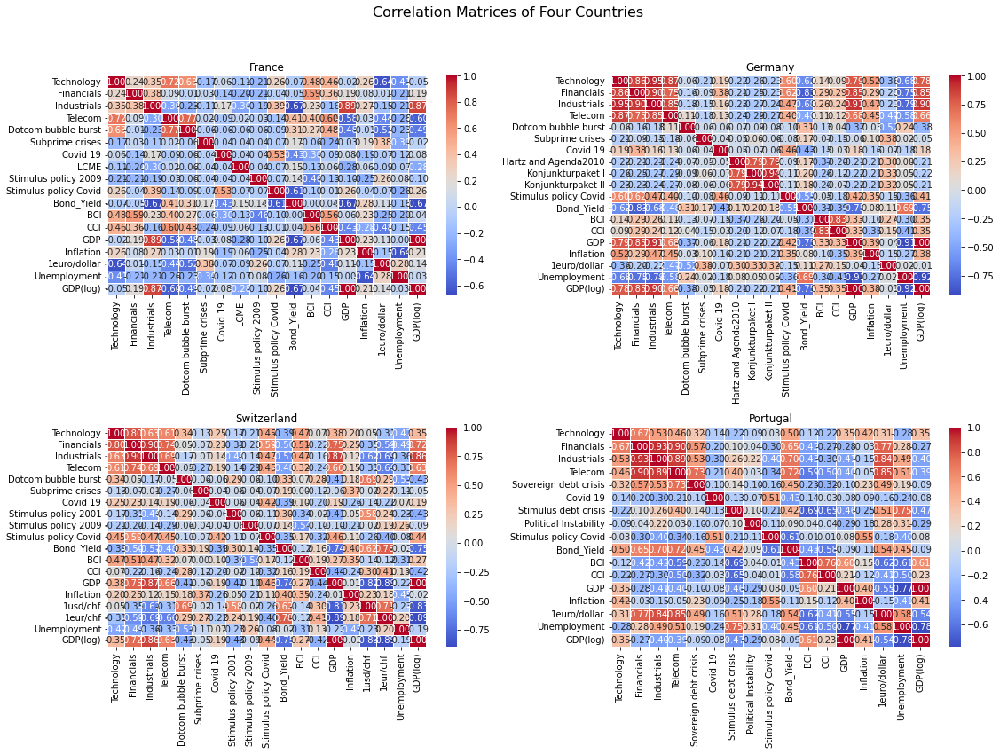

In [40]:
corr_france = france.corr()
corr_germany = germany.corr()
corr_switzerland = switzerland.corr()
corr_portugal = portugal.corr()

fig, axs = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Correlation Matrices of Four Countries", fontsize=16)

sns.heatmap(corr_france, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, ax=axs[0, 0])
axs[0, 0].set_title('France')

sns.heatmap(corr_germany, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, ax=axs[0, 1])
axs[0, 1].set_title('Germany')

sns.heatmap(corr_switzerland, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, ax=axs[1, 0])
axs[1, 0].set_title('Switzerland')

sns.heatmap(corr_portugal, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, ax=axs[1, 1])
axs[1, 1].set_title('Portugal')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

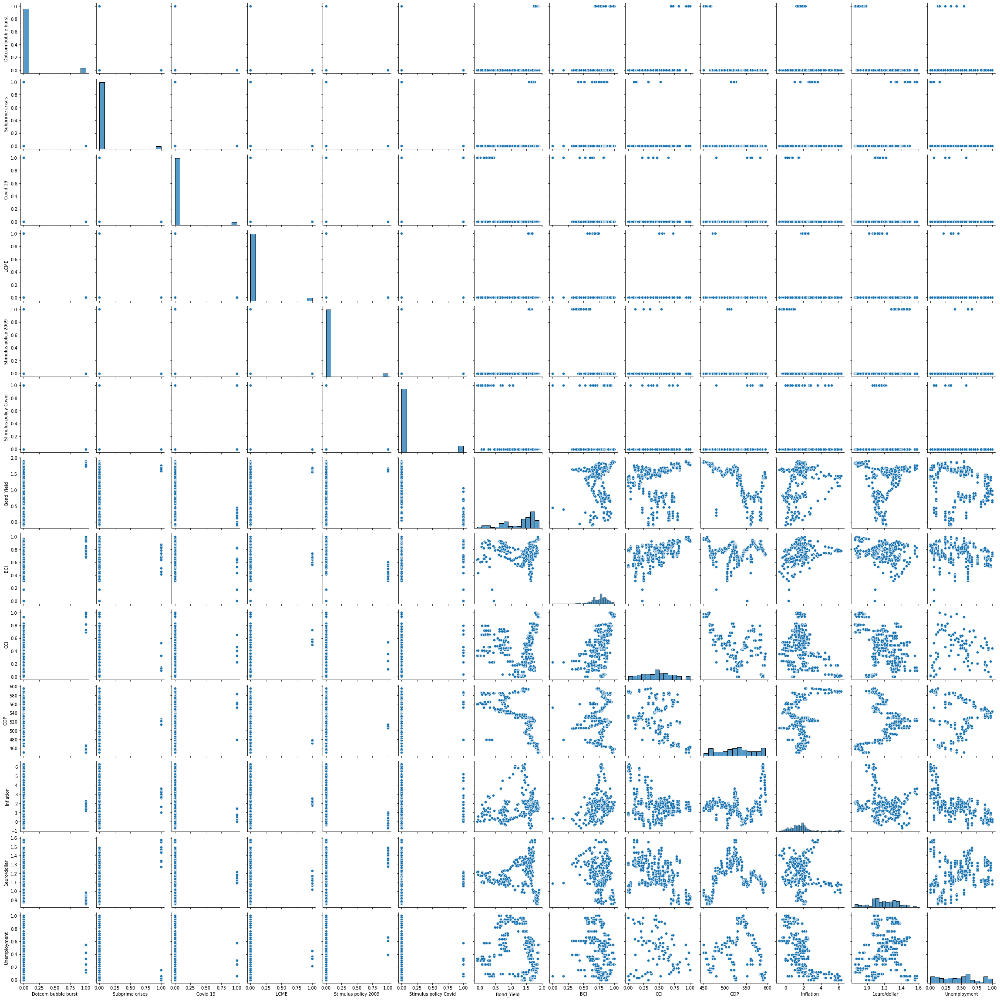

Importance des variables pour l'indice Technology:
Dotcom bubble burst: 0.0
Subprime crises: -8.104628079763643e-13
Covid 19: 2.2737367544323206e-13
LCME: -3.410605131648481e-13
Stimulus policy 2009: -3.410605131648481e-13
Stimulus policy Covid: -2.5579538487363607e-13
Bond_Yield: 391.3750178659648
BCI: 1254.5078591298109
CCI: 664.9448382815305
GDP: 6.26391141734628
Inflation: 135.49219986939175
1euro/dollar: -1544.1849785549737
Unemployment: 529.235154604607

Importance des variables pour l'indice Financials:
Dotcom bubble burst: 0.0
Subprime crises: -3.632649736573512e-13
Covid 19: 5.684341886080802e-14
LCME: 0.0
Stimulus policy 2009: -8.526512829121202e-14
Stimulus policy Covid: 0.0
Bond_Yield: 126.0662744882645
BCI: 645.9501810770438
CCI: 213.6522077339131
GDP: 2.3239997911743977
Inflation: -56.25485921733198
1euro/dollar: 210.46352905013728
Unemployment: -262.9358497136269

Importance des variables pour l'indice Industrials:
Dotcom bubble burst: 0.0
Subprime crises: -2.48689957516

In [41]:
constant_events = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'LCME', 'Stimulus policy 2009', 'Stimulus policy Covid']
control_var_france =['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'LCME', 'Stimulus policy 2009', 'Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']

simulated_vars = [var for var in control_var_france if var not in constant_events]

sns.pairplot(france[control_var_france])
plt.show()

def calculate_indices(scenario, models):
    X_scenario = pd.DataFrame([scenario])
    indices = {}
    for index, model in models.items():
        indices[index] = model.predict(X_scenario)[0]
    return indices

indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
models = {}
for index in indices:
    X = france[control_var_france]
    y = france[index]
    model = LinearRegression()
    model.fit(X, y)
    models[index] = model

def monte_carlo_simulation(data, control_vars, constant_events, models, n_simulations=10000):
    simulations = []
    indices_values = {index: [] for index in models.keys()}
    for _ in range(n_simulations):
        scenario = {}
        for var in control_vars:
            if var in constant_events:
                scenario[var] = data[var].iloc[0] 
            else:
                scenario[var] = np.random.choice(data[var])
        simulations.append(scenario)
        indices = calculate_indices(scenario, models)
        for index, value in indices.items():
            indices_values[index].append(value)
    return simulations, indices_values

scenarios, indices_values = monte_carlo_simulation(france, control_var_france, constant_events, models)

def sensitivity_analysis(indices_values, scenarios, control_vars):
    for index, values in indices_values.items():
        df = pd.DataFrame(scenarios)
        df[index] = values
        
        X = df[control_vars]
        y = df[index]
        
        model = LinearRegression()
        model.fit(X, y)
        
        importance = model.coef_
        print(f'Importance des variables pour l\'indice {index}:')
        for i, var in enumerate(control_vars):
            print(f'{var}: {importance[i]}')
        print()

sensitivity_analysis(indices_values, scenarios, control_var_france)

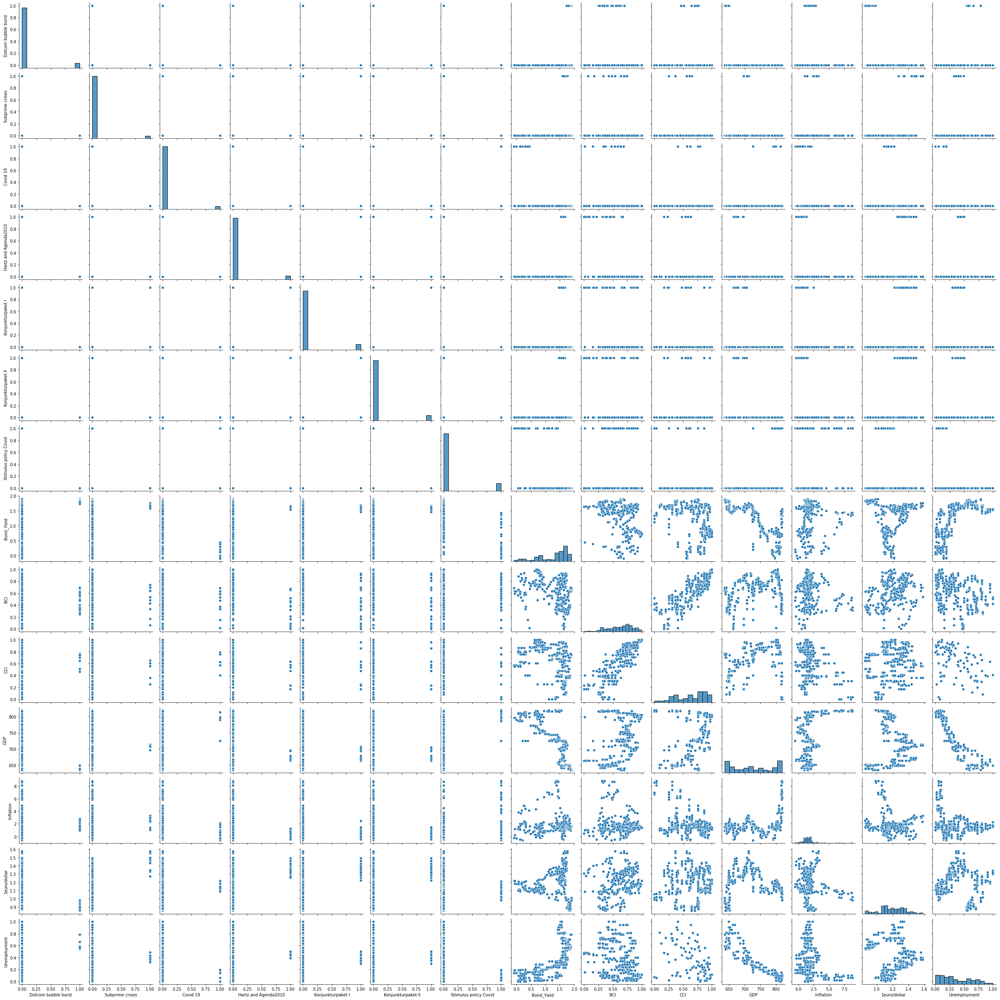

Importance des variables pour l'indice Technology:
Dotcom bubble burst: 0.0
Subprime crises: -2.1316282072803006e-14
Covid 19: 9.947598300641403e-14
Hartz and Agenda2010: 3.197442310920451e-14
Konjunkturpaket I: -1.2789769243681803e-13
Konjunkturpaket II: 3.552713678800501e-14
Stimulus policy Covid: -2.2737367544323206e-13
Bond_Yield: -9.536007354040494
BCI: 154.85013623312005
CCI: -114.9830852086024
GDP: 8.735215631706524
Inflation: 39.87838384853587
1euro/dollar: -698.7055288279039
Unemployment: 648.7918104742687

Importance des variables pour l'indice Financials:
Dotcom bubble burst: 0.0
Subprime crises: 4.796163466380676e-14
Covid 19: -5.684341886080802e-14
Hartz and Agenda2010: 5.684341886080802e-14
Konjunkturpaket I: -8.526512829121202e-14
Konjunkturpaket II: 4.263256414560601e-14
Stimulus policy Covid: -2.2737367544323206e-13
Bond_Yield: -363.64729326892814
BCI: 341.18015749038346
CCI: 211.29631606489016
GDP: 10.97786227353213
Inflation: 18.504577453970647
1euro/dollar: -669.215

In [42]:
constant_events = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19','Hartz and Agenda2010', 'Konjunkturpaket I', 'Konjunkturpaket II','Stimulus policy Covid']
control_var_germany =['Dotcom bubble burst', 'Subprime crises', 'Covid 19','Hartz and Agenda2010', 'Konjunkturpaket I', 'Konjunkturpaket II','Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']

simulated_vars = [var for var in control_var_germany if var not in constant_events]

sns.pairplot(germany[control_var_germany])
plt.show()

def calculate_indices(scenario, models):
    X_scenario = pd.DataFrame([scenario])
    indices = {}
    for index, model in models.items():
        indices[index] = model.predict(X_scenario)[0]
    return indices

indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
models = {}
for index in indices:
    X = germany[control_var_germany]
    y = germany[index]
    model = LinearRegression()
    model.fit(X, y)
    models[index] = model

def monte_carlo_simulation(data, control_vars, constant_events, models, n_simulations=10000):
    simulations = []
    indices_values = {index: [] for index in models.keys()}
    for _ in range(n_simulations):
        scenario = {}
        for var in control_vars:
            if var in constant_events:
                scenario[var] = data[var].iloc[0] 
            else:
                scenario[var] = np.random.choice(data[var])
        simulations.append(scenario)
        indices = calculate_indices(scenario, models)
        for index, value in indices.items():
            indices_values[index].append(value)
    return simulations, indices_values

scenarios, indices_values = monte_carlo_simulation(germany, control_var_germany, constant_events, models)

def sensitivity_analysis(indices_values, scenarios, control_vars):
    for index, values in indices_values.items():
        df = pd.DataFrame(scenarios)
        df[index] = values
        
        X = df[control_vars]
        y = df[index]
        
        model = LinearRegression()
        model.fit(X, y)
        
        importance = model.coef_
        print(f'Importance des variables pour l\'indice {index}:')
        for i, var in enumerate(control_vars):
            print(f'{var}: {importance[i]}')
        print()

sensitivity_analysis(indices_values, scenarios, control_var_germany)

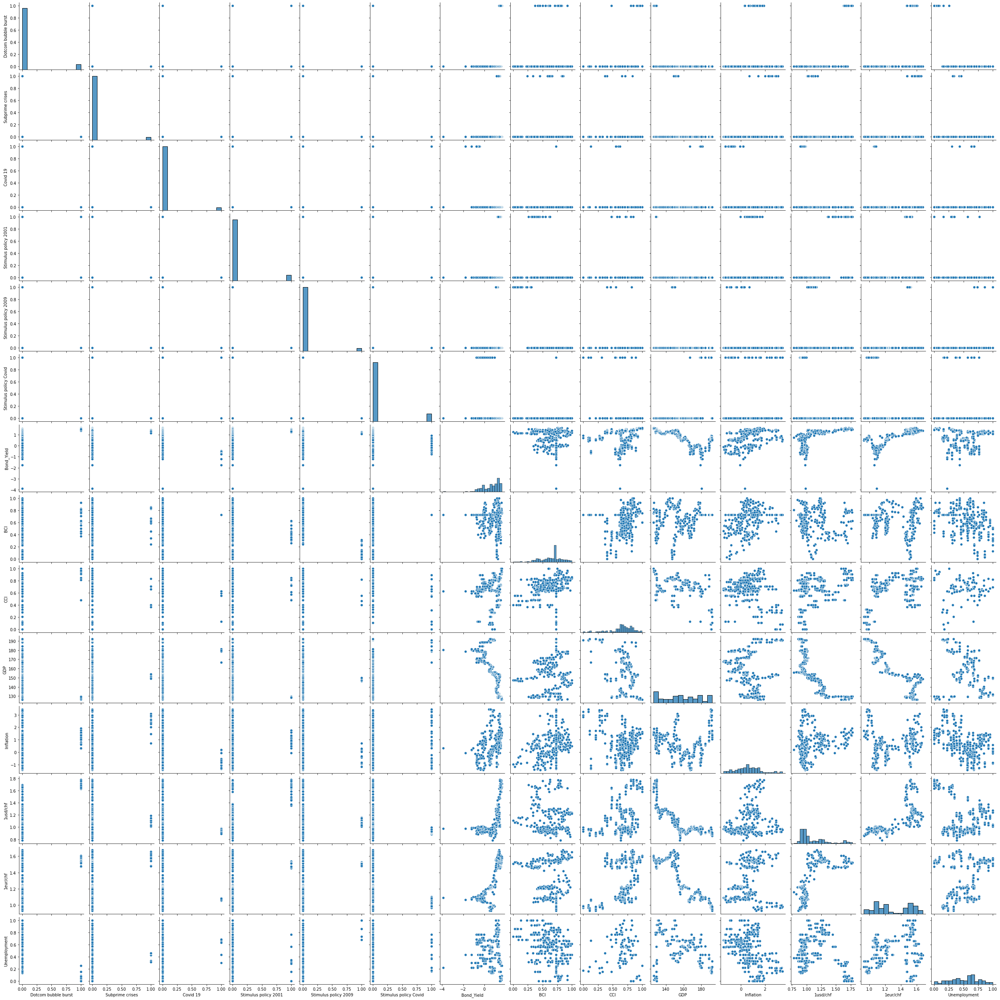

Importance des variables pour l'indice Technology:
Dotcom bubble burst: 0.0
Subprime crises: -4.263256414560601e-14
Covid 19: -3.979039320256561e-13
Stimulus policy 2001: 5.684341886080801e-13
Stimulus policy 2009: 5.684341886080801e-13
Stimulus policy Covid: -1.1368683772161603e-13
Bond_Yield: -137.31583828900386
BCI: 353.26523525198223
CCI: 421.4817609087769
GDP: 18.417052843294655
Inflation: 10.79434147473056
1usd/chf: 1663.8523539424182
1eur/chf: 120.75378966405515
Unemployment: 22.991892509824353

Importance des variables pour l'indice Financials:
Dotcom bubble burst: 0.0
Subprime crises: -3.552713678800501e-14
Covid 19: -3.268496584496461e-13
Stimulus policy 2001: 4.547473508864641e-13
Stimulus policy 2009: 3.410605131648481e-13
Stimulus policy Covid: -1.1368683772161603e-13
Bond_Yield: 27.88806463782379
BCI: 202.2575735006472
CCI: 138.6436109558468
GDP: 23.760139583237642
Inflation: -24.377712294967907
1usd/chf: 791.9646997924302
1eur/chf: 565.436160496058
Unemployment: -65.3386

In [43]:
constant_events = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19','Stimulus policy 2001', 'Stimulus policy 2009','Stimulus policy Covid']
control_var_switzerland =['Dotcom bubble burst', 'Subprime crises', 'Covid 19','Stimulus policy 2001', 'Stimulus policy 2009','Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1usd/chf','1eur/chf','Unemployment']
simulated_vars = [var for var in control_var_switzerland if var not in constant_events]

sns.pairplot(switzerland[control_var_switzerland])
plt.show()

def calculate_indices(scenario, models):
    X_scenario = pd.DataFrame([scenario])
    indices = {}
    for index, model in models.items():
        indices[index] = model.predict(X_scenario)[0]
    return indices

indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
models = {}
for index in indices:
    X = switzerland[control_var_switzerland]
    y = switzerland[index]
    model = LinearRegression()
    model.fit(X, y)
    models[index] = model

def monte_carlo_simulation(data, control_vars, constant_events, models, n_simulations=10000):
    simulations = []
    indices_values = {index: [] for index in models.keys()}
    for _ in range(n_simulations):
        scenario = {}
        for var in control_vars:
            if var in constant_events:
                scenario[var] = data[var].iloc[0] 
            else:
                scenario[var] = np.random.choice(data[var])
        simulations.append(scenario)
        indices = calculate_indices(scenario, models)
        for index, value in indices.items():
            indices_values[index].append(value)
    return simulations, indices_values

scenarios, indices_values = monte_carlo_simulation(switzerland, control_var_switzerland, constant_events, models)

def sensitivity_analysis(indices_values, scenarios, control_vars):
    for index, values in indices_values.items():
        df = pd.DataFrame(scenarios)
        df[index] = values
        
        X = df[control_vars]
        y = df[index]
        
        model = LinearRegression()
        model.fit(X, y)
        
        importance = model.coef_
        print(f'Importance des variables pour l\'indice {index}:')
        for i, var in enumerate(control_vars):
            print(f'{var}: {importance[i]}')
        print()

sensitivity_analysis(indices_values, scenarios, control_var_switzerland)

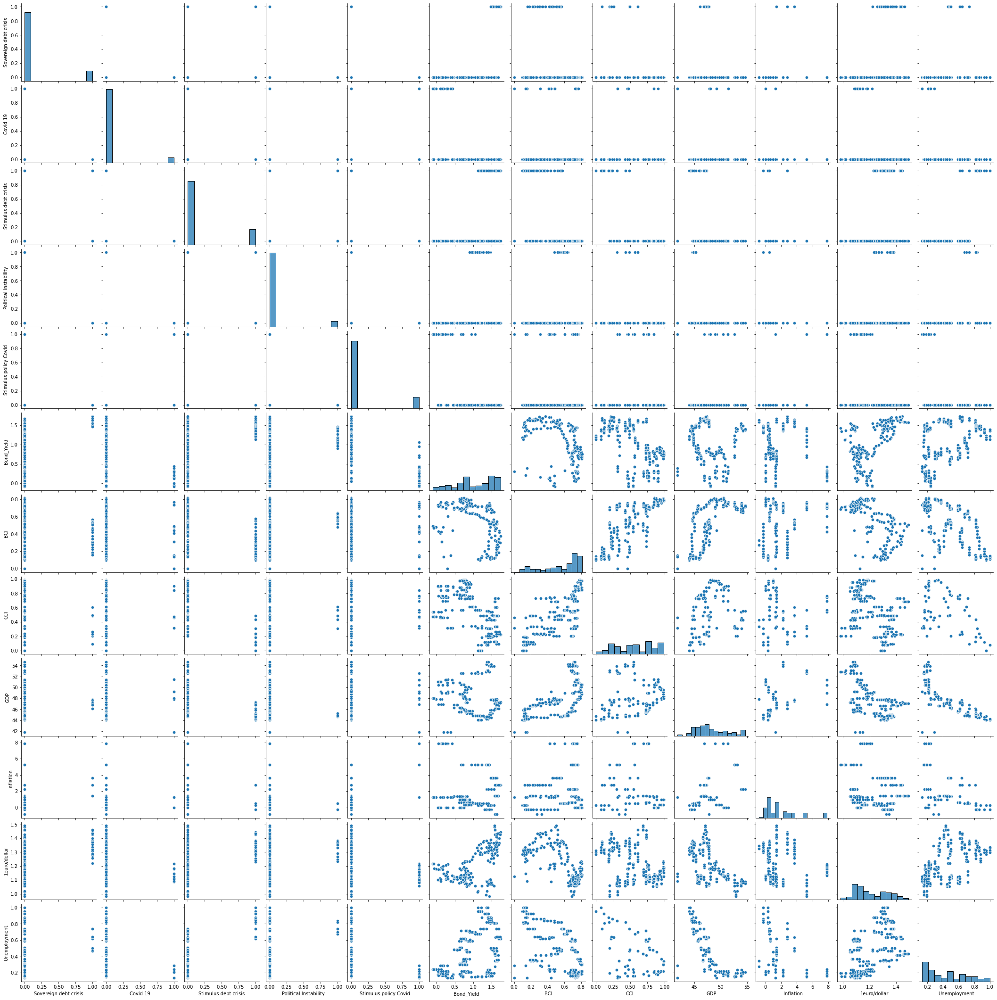

Importance des variables pour l'indice Technology:
Sovereign debt crisis: 0.0
Covid 19: 1.5631940186722204e-13
Stimulus debt crisis: 2.8421709430404007e-13
Political Instability: 4.263256414560601e-14
Stimulus policy Covid: -2.2737367544323206e-13
Bond_Yield: 230.18748097750768
BCI: -292.57563384485684
CCI: 133.6186125055023
GDP: 24.17517964724974
Inflation: 19.69620163806524
1euro/dollar: 600.0276408699298
Unemployment: -24.949339209298607

Importance des variables pour l'indice Financials:
Sovereign debt crisis: 0.0
Covid 19: 2.8421709430404007e-13
Stimulus debt crisis: 5.968558980384842e-13
Political Instability: 1.7053025658242404e-13
Stimulus policy Covid: -3.410605131648481e-13
Bond_Yield: 176.43749034381563
BCI: -118.8914650786327
CCI: 40.58192342567896
GDP: -6.048591947414103
Inflation: 5.895758750528376
1euro/dollar: 1313.624200844282
Unemployment: -22.082443519543133

Importance des variables pour l'indice Industrials:
Sovereign debt crisis: 0.0
Covid 19: 1.9895196601282805e-

In [44]:
constant_events = ['Sovereign debt crisis', 'Covid 19', 'Stimulus debt crisis','Political Instability', 'Stimulus policy Covid']
control_var_portugal =['Sovereign debt crisis', 'Covid 19', 'Stimulus debt crisis','Political Instability', 'Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']

simulated_vars = [var for var in control_var_portugal if var not in constant_events]

sns.pairplot(portugal[control_var_portugal])
plt.show()

def calculate_indices(scenario, models):
    X_scenario = pd.DataFrame([scenario])
    indices = {}
    for index, model in models.items():
        indices[index] = model.predict(X_scenario)[0]
    return indices

indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
models = {}
for index in indices:
    X = portugal[control_var_portugal]
    y = portugal[index]
    model = LinearRegression()
    model.fit(X, y)
    models[index] = model

def monte_carlo_simulation(data, control_vars, constant_events, models, n_simulations=10000):
    simulations = []
    indices_values = {index: [] for index in models.keys()}
    for _ in range(n_simulations):
        scenario = {}
        for var in control_vars:
            if var in constant_events:
                scenario[var] = data[var].iloc[0]  
            else:
                scenario[var] = np.random.choice(data[var])
        simulations.append(scenario)
        indices = calculate_indices(scenario, models)
        for index, value in indices.items():
            indices_values[index].append(value)
    return simulations, indices_values

scenarios, indices_values = monte_carlo_simulation(portugal, control_var_portugal, constant_events, models)

def sensitivity_analysis(indices_values, scenarios, control_vars):
    for index, values in indices_values.items():
        df = pd.DataFrame(scenarios)
        df[index] = values
        
        X = df[control_vars]
        y = df[index]
        
        model = LinearRegression()
        model.fit(X, y)
        
        importance = model.coef_
        print(f'Importance des variables pour l\'indice {index}:')
        for i, var in enumerate(control_vars):
            print(f'{var}: {importance[i]}')
        print()

sensitivity_analysis(indices_values, scenarios, control_var_portugal)

### 5-Challenges in Predictive Modeling and Alternative Approaches

In [45]:
poly_degree = 2
poly = PolynomialFeatures(degree=poly_degree)

def regression_pays(df, country_name, indices, control_var):
    fig, axs = plt.subplots(2, 2, figsize=(15, 10))
    axs = axs.flatten()
    fig.suptitle(f'Polynomial Regression of Indices in {country_name}', fontsize=16)

    for i, index in enumerate(indices):
        X = df[control_var].values
        y = df[index].values

        X_poly = poly.fit_transform(X)

        poly_reg = LinearRegression()
        poly_reg.fit(X_poly, y)

        y_pred = poly_reg.predict(X_poly)

        dates = df.index
        axs[i].plot(dates, y, color='blue', label='Real data')
        axs[i].plot(dates, y_pred, color='green', label=f'Polynomial regression (degree {poly_degree})')
        axs[i].set_title(index)
        axs[i].set_xlabel('Date')
        axs[i].set_ylabel('Market Index')
        axs[i].legend()
        axs[i].grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

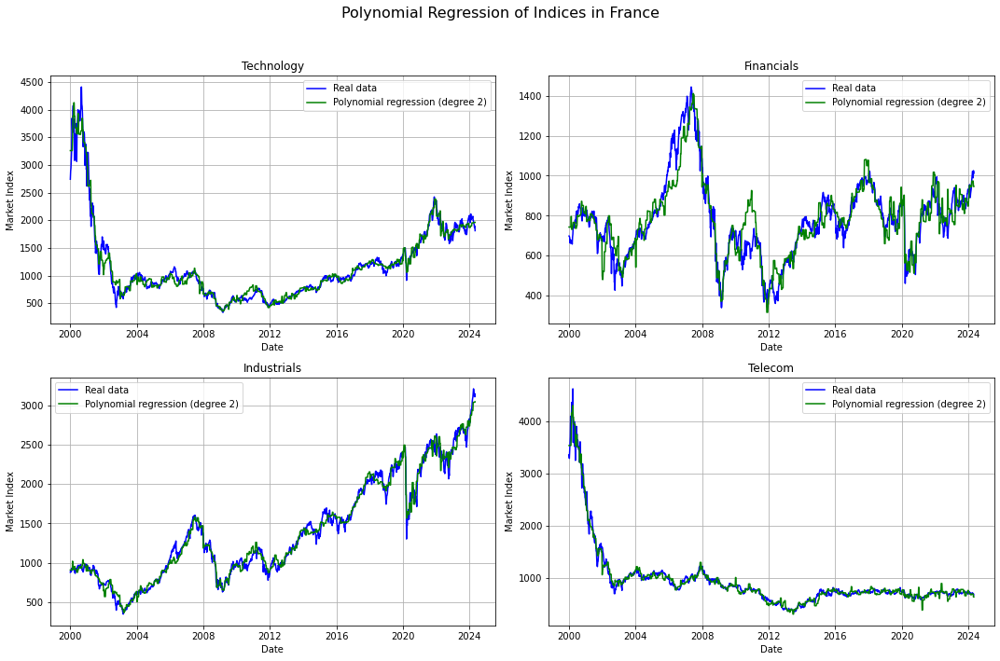

In [46]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']

control_var_france = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'LCME', 'Stimulus policy 2009', 'Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']
regression_pays(france, 'France', indices, control_var_france)

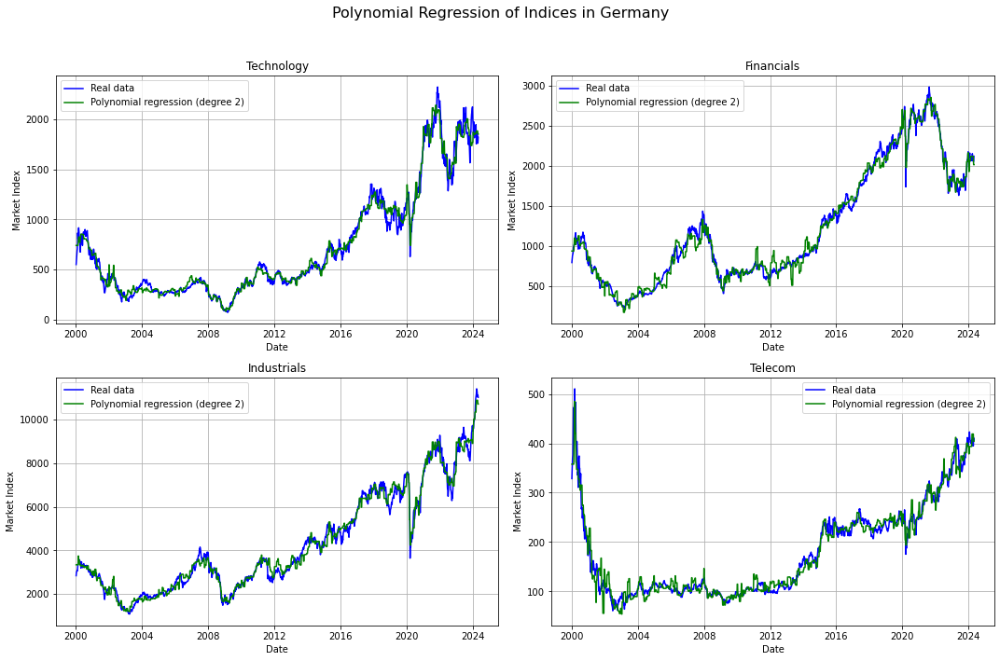

In [47]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']

control_var_germany = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'Hartz and Agenda2010', 'Konjunkturpaket I','Konjunkturpaket II','Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']
regression_pays(germany, 'Germany', indices, control_var_germany)

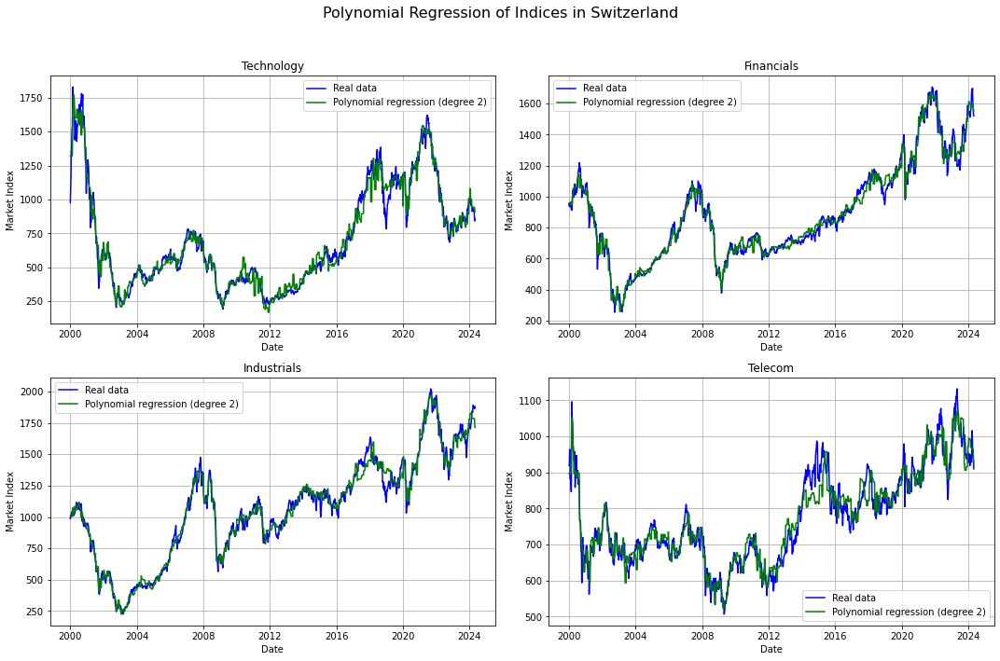

In [48]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']

control_var_switzerland = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'Stimulus policy 2001', 'Stimulus policy 2009','Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1usd/chf','1eur/chf','Unemployment']
regression_pays(switzerland, 'Switzerland', indices, control_var_switzerland)

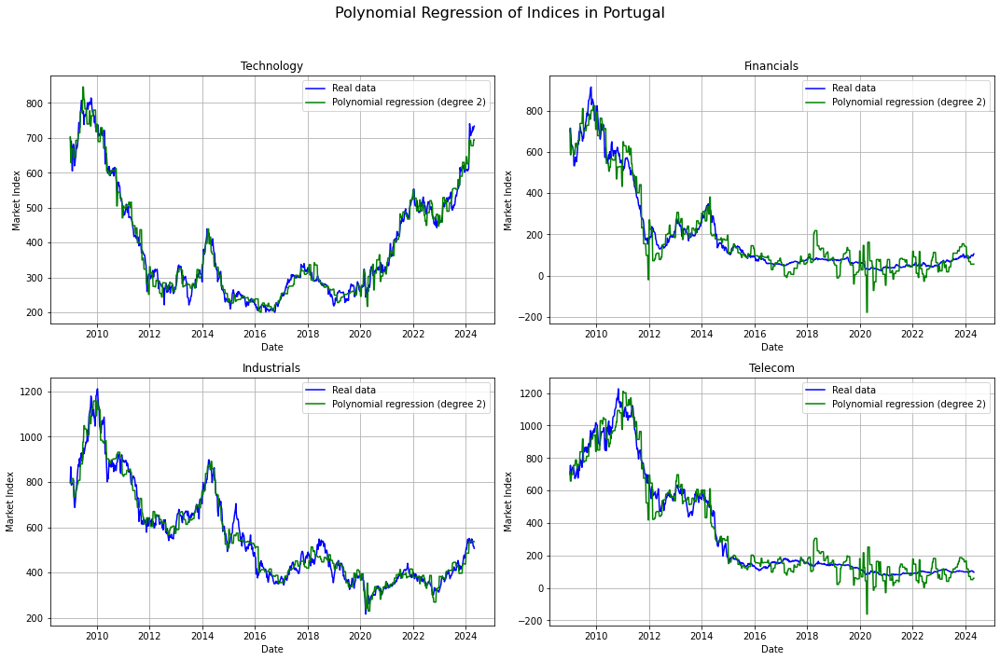

In [49]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']

control_var_portugal = ['Sovereign debt crisis', 'Covid 19', 'Stimulus debt crisis', 'Political Instability','Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']
regression_pays(portugal, 'Portugal', indices, control_var_portugal)

In [50]:
binary_vars = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'LCME', 'Stimulus policy 2009', 'Stimulus policy Covid'] 
macro_vars = ['Technology', 'Financials', 'Industrials', 'Telecom','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']

scaler = StandardScaler()
normalized_macro = scaler.fit_transform(france[macro_vars])

import pandas as pd

normalized_macro_france = pd.DataFrame(normalized_macro, columns=macro_vars, index=france.index)

france_normalized = pd.concat([france[binary_vars], normalized_macro_france], axis=1)

In [51]:
binary_vars = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'Hartz and Agenda2010', 'Konjunkturpaket I','Konjunkturpaket II','Stimulus policy Covid']
macro_vars = ['Technology', 'Financials', 'Industrials', 'Telecom','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']

scaler = StandardScaler()
normalized_macro = scaler.fit_transform(germany[macro_vars])

import pandas as pd

normalized_macro_germany = pd.DataFrame(normalized_macro, columns=macro_vars, index=germany.index)

germany_normalized = pd.concat([germany[binary_vars], normalized_macro_germany], axis=1)

In [52]:
binary_vars = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'Stimulus policy 2001', 'Stimulus policy 2009','Stimulus policy Covid']
macro_vars = ['Technology', 'Financials', 'Industrials', 'Telecom','Bond_Yield','BCI','CCI','GDP','Inflation','1usd/chf','1eur/chf','Unemployment']

scaler = StandardScaler()
normalized_macro = scaler.fit_transform(switzerland[macro_vars])

import pandas as pd

normalized_macro_switzerland = pd.DataFrame(normalized_macro, columns=macro_vars, index=switzerland.index)

switzerland_normalized = pd.concat([switzerland[binary_vars], normalized_macro_switzerland], axis=1)

In [53]:
binary_vars = ['Sovereign debt crisis', 'Covid 19', 'Stimulus debt crisis', 'Political Instability','Stimulus policy Covid']
macro_vars = ['Technology', 'Financials', 'Industrials', 'Telecom','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']

scaler = StandardScaler()
normalized_macro = scaler.fit_transform(portugal[macro_vars])

import pandas as pd

normalized_macro_portugal = pd.DataFrame(normalized_macro, columns=macro_vars, index=portugal.index)

portugal_normalized = pd.concat([portugal[binary_vars], normalized_macro_portugal], axis=1)

In [54]:
def svr_regression_split(df, country_name, indices, control_var, kernel='rbf', C=1.0, epsilon=0.1):
    train_df = df[df.index < '2020-01-01']
    test_df = df[df.index >= '2020-01-01']

    scaler = StandardScaler()
    X_train = scaler.fit_transform(train_df[control_var])
    X_test = scaler.transform(test_df[control_var])

    fig, axs = plt.subplots(2, 2, figsize=(15, 10))
    axs = axs.flatten()
    fig.suptitle(f'Support Vector Regression (SVR) for {country_name} Indices', fontsize=16)

    for i, index in enumerate(indices):
        y_train = train_df[index].values
        y_test = test_df[index].values

        svr = SVR(kernel=kernel, C=C, epsilon=epsilon)
        svr.fit(X_train, y_train)

        y_train_pred = svr.predict(X_train)
        y_test_pred = svr.predict(X_test)

        mse_train = mean_squared_error(y_train, y_train_pred)
        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_train = r2_score(y_train, y_train_pred)
        r2_test = r2_score(y_test, y_test_pred)

        print(f"Index: {index}")
        print(f"Training - MSE: {mse_train:.4f}, R²: {r2_train:.4f}")
        print(f"Testing - MSE: {mse_test:.4f}, R²: {r2_test:.4f}\n")

        axs[i].plot(train_df.index, y_train, color='blue', label='Real data (train)')
        axs[i].plot(train_df.index, y_train_pred, color='red', label='SVR Prediction (train)')
        axs[i].plot(test_df.index, y_test, color='orange', label='Real data (test)')
        axs[i].plot(test_df.index, y_test_pred, color='green', label='SVR Prediction (test)')
        axs[i].set_title(index)
        axs[i].set_xlabel('Date')
        axs[i].set_ylabel('Market Index')
        axs[i].legend()
        axs[i].grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

Index: Technology
Training - MSE: 0.0295, R²: 0.9699
Testing - MSE: 0.9350, R²: -4.8782

Index: Financials
Training - MSE: 0.1092, R²: 0.9033
Testing - MSE: 0.2924, R²: 0.2508

Index: Industrials
Training - MSE: 0.0086, R²: 0.9840
Testing - MSE: 2.1117, R²: -6.1405

Index: Telecom
Training - MSE: 0.0220, R²: 0.9813
Testing - MSE: 0.5002, R²: -89.9246



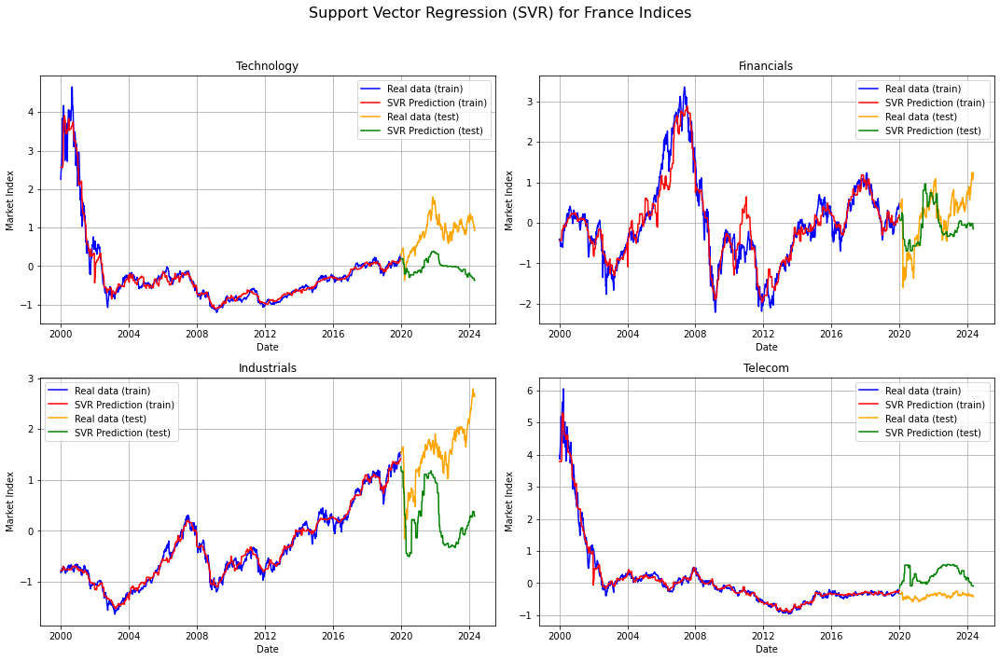

In [55]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']

control_var_france = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'LCME', 'Stimulus policy 2009', 'Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']
svr_regression_split(france_normalized, 'France', indices, control_var_france)

Index: Technology
Training - MSE: 0.0077, R²: 0.9746
Testing - MSE: 4.3822, R²: -10.3257

Index: Financials
Training - MSE: 0.0094, R²: 0.9836
Testing - MSE: 2.0116, R²: -6.0318

Index: Industrials
Training - MSE: 0.0090, R²: 0.9815
Testing - MSE: 3.4632, R²: -7.8845

Index: Telecom
Training - MSE: 0.0694, R²: 0.8835
Testing - MSE: 2.6118, R²: -5.5191



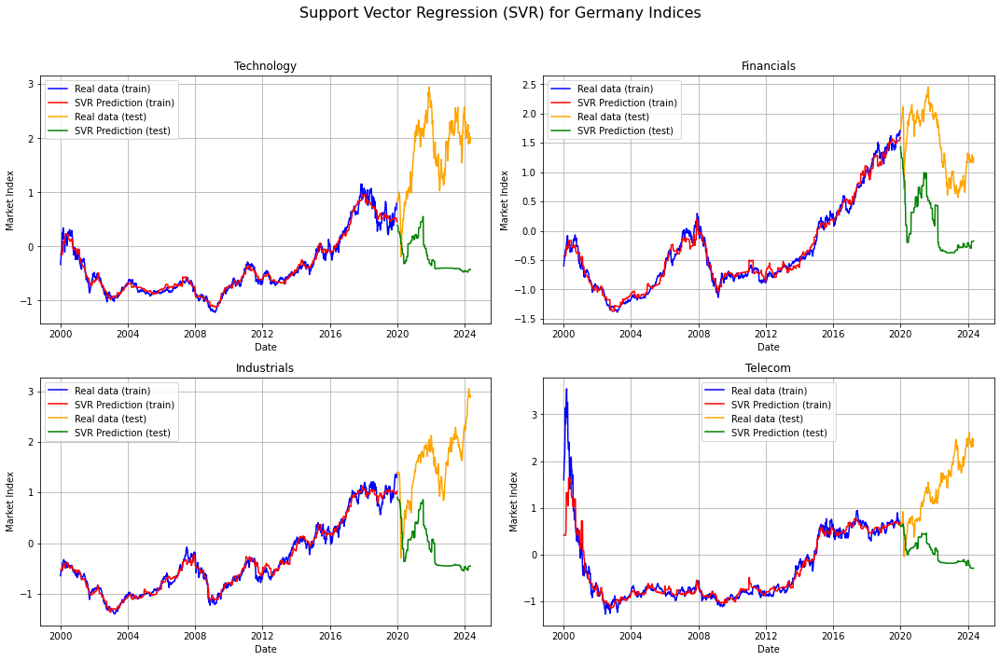

In [56]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
control_var_germany = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'Hartz and Agenda2010', 'Konjunkturpaket I','Konjunkturpaket II','Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']
svr_regression_split(germany_normalized, 'Germany', indices, control_var_germany)

Index: Technology
Training - MSE: 0.0361, R²: 0.9579
Testing - MSE: 0.7847, R²: -0.6901

Index: Financials
Training - MSE: 0.0152, R²: 0.9675
Testing - MSE: 2.6018, R²: -8.1215

Index: Industrials
Training - MSE: 0.0166, R²: 0.9754
Testing - MSE: 2.2389, R²: -6.6055

Index: Telecom
Training - MSE: 0.0984, R²: 0.8458
Testing - MSE: 2.3645, R²: -7.8026



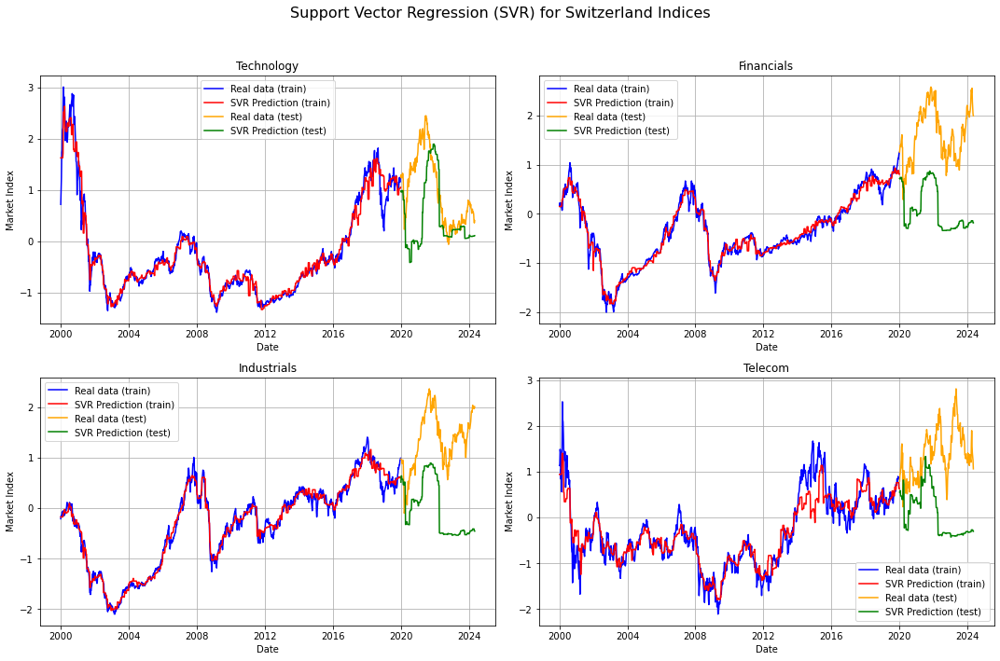

In [57]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
control_var_switzerland = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'Stimulus policy 2001', 'Stimulus policy 2009','Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1usd/chf','1eur/chf','Unemployment']
svr_regression_split(switzerland_normalized, 'Switzerland', indices, control_var_switzerland)

Index: Technology
Training - MSE: 0.0127, R²: 0.9883
Testing - MSE: 0.6669, R²: -0.3145

Index: Financials
Training - MSE: 0.0131, R²: 0.9887
Testing - MSE: 1.4483, R²: -167.4877

Index: Industrials
Training - MSE: 0.0338, R²: 0.9652
Testing - MSE: 1.5272, R²: -16.5574

Index: Telecom
Training - MSE: 0.0110, R²: 0.9896
Testing - MSE: 1.8336, R²: -2122.1297



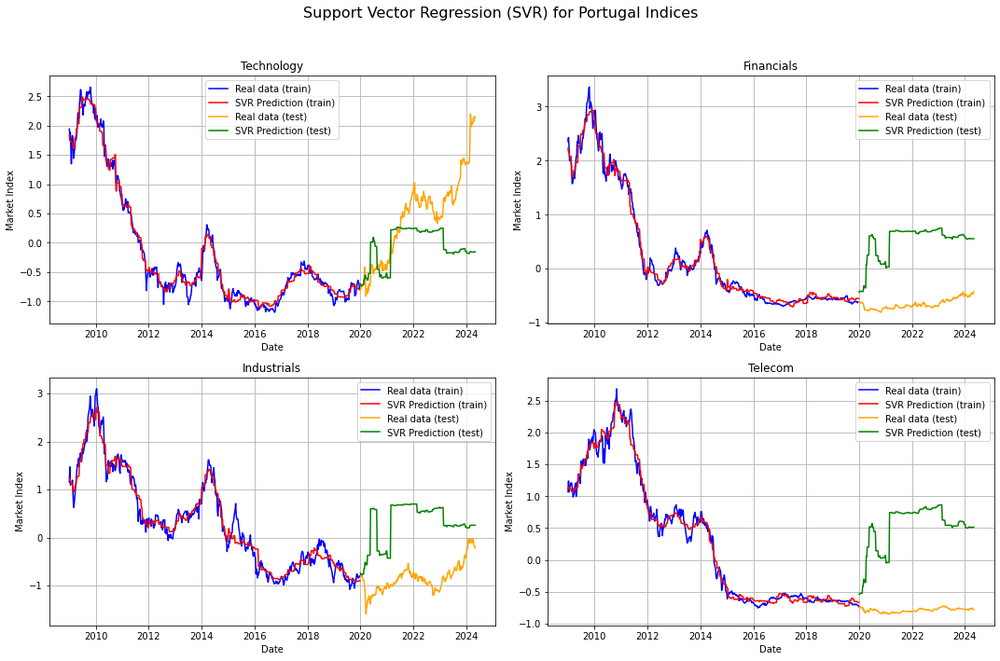

In [58]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
control_var_portugal = ['Sovereign debt crisis', 'Covid 19', 'Stimulus debt crisis', 'Political Instability','Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']
svr_regression_split(portugal_normalized, 'Portugal', indices, control_var_portugal)

In [60]:
def grid_search_svr_feature_selection(df, indices, control_vars, param_grid, test_size=0.3, random_state=42):
    X = df[control_vars].values
    scaler = StandardScaler()

    results = {}

    for index in indices:
        y = df[index].values
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        svr = SVR()

        grid_search = GridSearchCV(svr, param_grid, scoring='neg_mean_squared_error', cv=5)
        grid_search.fit(X_train, y_train)

        best_params = grid_search.best_params_
        print(f"Best parameters {index} : {best_params}")

        best_svr = grid_search.best_estimator_
        best_svr.fit(X_train, y_train)

        y_train_pred = best_svr.predict(X_train)
        y_test_pred = best_svr.predict(X_test)

        mse_train = mean_squared_error(y_train, y_train_pred)
        mse_test = mean_squared_error(y_test, y_test_pred)

        results[index] = {
            'best_params': best_params,
            'mse_train': mse_train,
            'mse_test': mse_test}

        if best_params['kernel'] == 'linear':
            feature_weights = best_svr.coef_.flatten()
            sorted_indices = sorted(range(len(control_vars)), key=lambda k: abs(feature_weights[k]), reverse=True)
            important_vars = [control_vars[i] for i in sorted_indices]
            results[index]['important_vars'] = important_vars

            print(f"Variables importantes pour {index} : {important_vars}")

    return results

param_grid = {'C': [0.1, 1, 10],'epsilon': [0.01, 0.1, 0.2],'kernel': ['linear', 'rbf']}

In [61]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
control_var_france = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'LCME', 'Stimulus policy 2009', 'Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']
results = grid_search_svr_feature_selection(france_normalized, indices, control_var_france, param_grid)

Best parameters Technology : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Best parameters Financials : {'C': 10, 'epsilon': 0.2, 'kernel': 'rbf'}
Best parameters Industrials : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Best parameters Telecom : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}


In [62]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
control_var_germany = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'Hartz and Agenda2010', 'Konjunkturpaket I','Konjunkturpaket II','Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']
results = grid_search_svr_feature_selection(germany_normalized, indices, control_var_germany, param_grid)

Best parameters Technology : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Best parameters Financials : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Best parameters Industrials : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Best parameters Telecom : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}


In [63]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
control_var_switzerland = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'Stimulus policy 2001', 'Stimulus policy 2009','Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1usd/chf','1eur/chf','Unemployment']
results = grid_search_svr_feature_selection(switzerland_normalized, indices, control_var_switzerland, param_grid)

Best parameters Technology : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Best parameters Financials : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Best parameters Industrials : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Best parameters Telecom : {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}


In [64]:
indices = ['Technology', 'Financials', 'Industrials', 'Telecom']
control_var_portugal = ['Sovereign debt crisis', 'Covid 19', 'Stimulus debt crisis', 'Political Instability','Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']
results = grid_search_svr_feature_selection(portugal_normalized, indices, control_var_portugal, param_grid)

Best parameters Technology : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Best parameters Financials : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Best parameters Industrials : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Best parameters Telecom : {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}


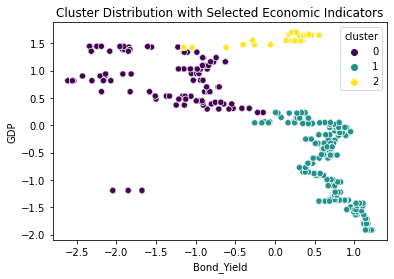

In [65]:
selected_features = ['Bond_Yield', 'GDP', 'Inflation']
kmeans = KMeans(n_clusters=3, random_state=42)
france_normalized['cluster'] = kmeans.fit_predict(france_normalized[selected_features])

sns.scatterplot(x='Bond_Yield', y='GDP', hue='cluster', data=france_normalized, palette='viridis')
plt.title('Cluster Distribution with Selected Economic Indicators')
plt.show()

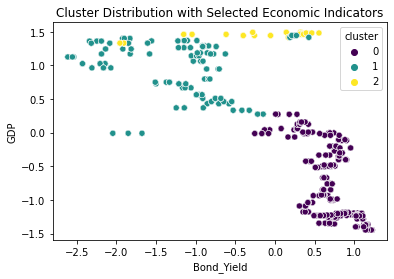

In [66]:
selected_features = ['Bond_Yield', 'GDP', 'Inflation']
kmeans = KMeans(n_clusters=3, random_state=42)
germany_normalized['cluster'] = kmeans.fit_predict(germany_normalized[selected_features])

sns.scatterplot(x='Bond_Yield', y='GDP', hue='cluster', data=germany_normalized, palette='viridis')
plt.title('Cluster Distribution with Selected Economic Indicators')
plt.show()


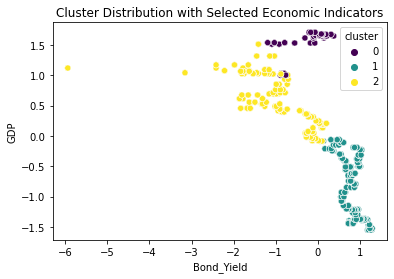

In [67]:
selected_features = ['Bond_Yield', 'GDP', 'Inflation']
kmeans = KMeans(n_clusters=3, random_state=42)
switzerland_normalized['cluster'] = kmeans.fit_predict(switzerland_normalized[selected_features])

sns.scatterplot(x='Bond_Yield', y='GDP', hue='cluster', data=switzerland_normalized, palette='viridis')
plt.title('Cluster Distribution with Selected Economic Indicators')
plt.show()

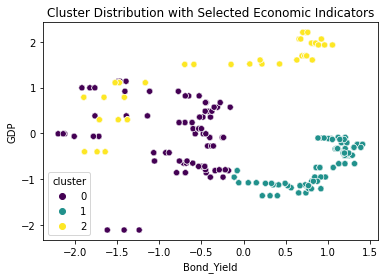

In [68]:
selected_features = ['Bond_Yield', 'GDP', 'Inflation']
kmeans = KMeans(n_clusters=3, random_state=42)
portugal_normalized['cluster'] = kmeans.fit_predict(portugal_normalized[selected_features])

sns.scatterplot(x='Bond_Yield', y='GDP', hue='cluster', data=portugal_normalized, palette='viridis')
plt.title('Cluster Distribution with Selected Economic Indicators')
plt.show()

In [69]:
def svr_regression_split(df, country_name, indices, control_var, best_params):
    if 'cluster' not in df.columns:
        print("La colonne 'cluster' est manquante dans le DataFrame.")
        return 

    control_var = control_var + ['cluster']
    train_df = df[df.index < '2020-01-01']
    test_df = df[df.index >= '2020-01-01']
    
    scaler = StandardScaler()
    X_train = scaler.fit_transform(train_df[control_var])
    X_test = scaler.transform(test_df[control_var])

    fig, axs = plt.subplots(2, 2, figsize=(15, 10))
    axs = axs.flatten()
    fig.suptitle(f'Support Vector Regression (SVR) for {country_name} Indices', fontsize=16)

    for i, index in enumerate(indices):
        y_train = train_df[index].values
        y_test = test_df[index].values
        svr = SVR(kernel=best_params[index]['kernel'], C=best_params[index]['C'], epsilon=best_params[index]['epsilon'])
        svr.fit(X_train, y_train)
        y_train_pred = svr.predict(X_train)
        y_test_pred = svr.predict(X_test)

        axs[i].plot(train_df.index, y_train, color='blue', label='Real data (train)')
        axs[i].plot(train_df.index, y_train_pred, color='red', label='SVR Prediction (train)')
        axs[i].plot(test_df.index, y_test, color='orange', label='Real data (test)')
        axs[i].plot(test_df.index, y_test_pred, color='green', label='SVR Prediction (test)')
        axs[i].set_title(index)
        axs[i].set_xlabel('Date')
        axs[i].set_ylabel('Market Index')
        axs[i].legend()
        axs[i].grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

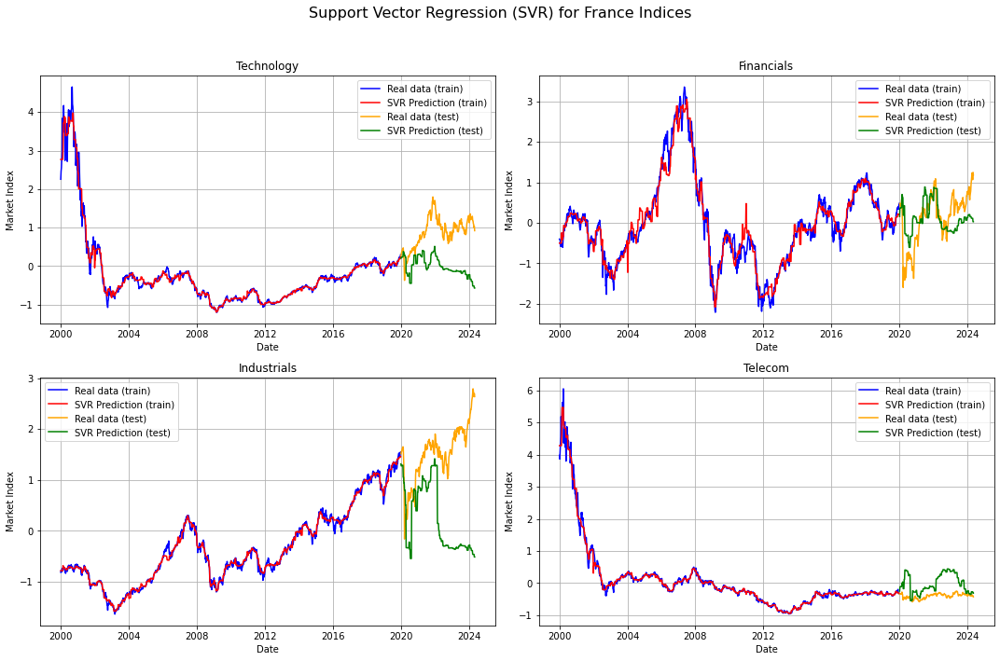

In [70]:
best_params = {
    'Technology': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'},
    'Financials': {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'},
    'Industrials': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'},
    'Telecom': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
}

svr_regression_split(france_normalized, 'France', indices, control_var_france, best_params)

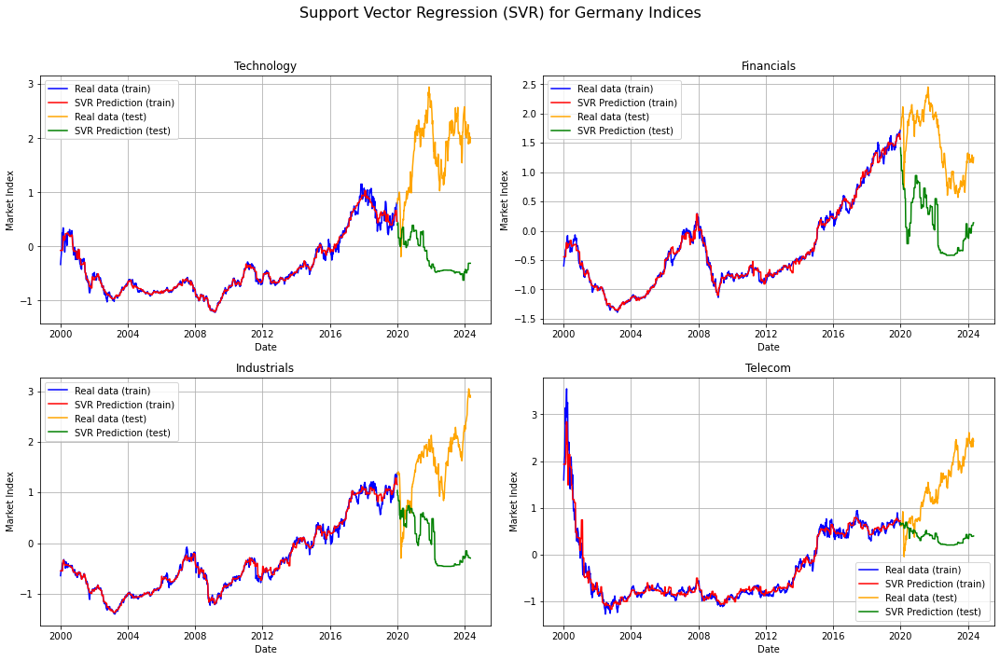

In [71]:
best_params = {
    'Technology': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'},
    'Financials': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'},
    'Industrials': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'},
    'Telecom': {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
}

svr_regression_split(germany_normalized, 'Germany', indices, control_var_germany, best_params)

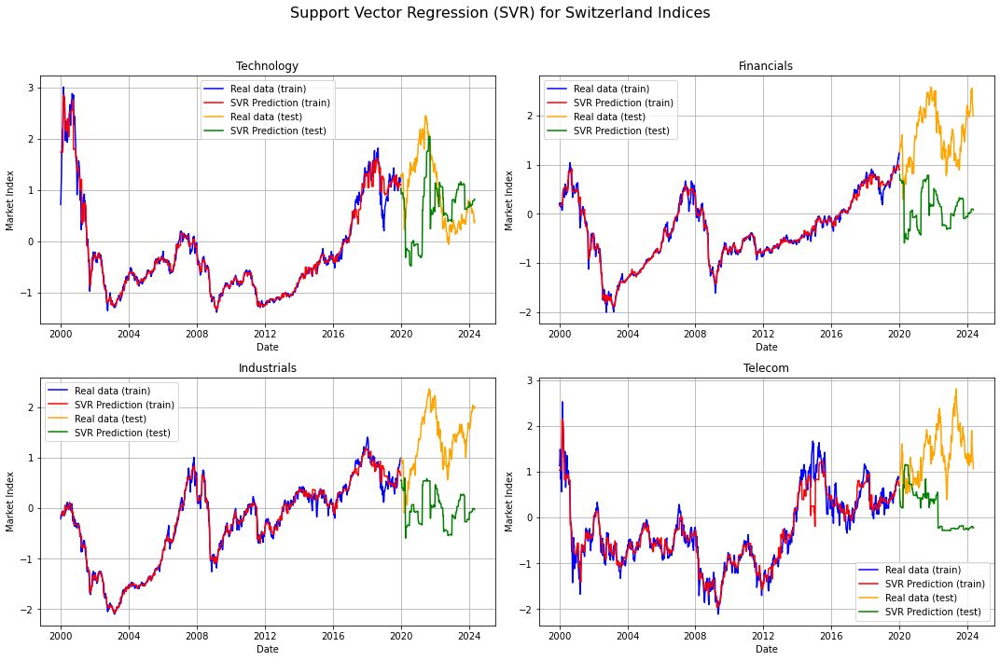

In [72]:
best_params = {
    'Technology': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'},
    'Financials': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'},
    'Industrials': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'},
    'Telecom': {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
}

svr_regression_split(switzerland_normalized, 'Switzerland', indices, control_var_switzerland, best_params)

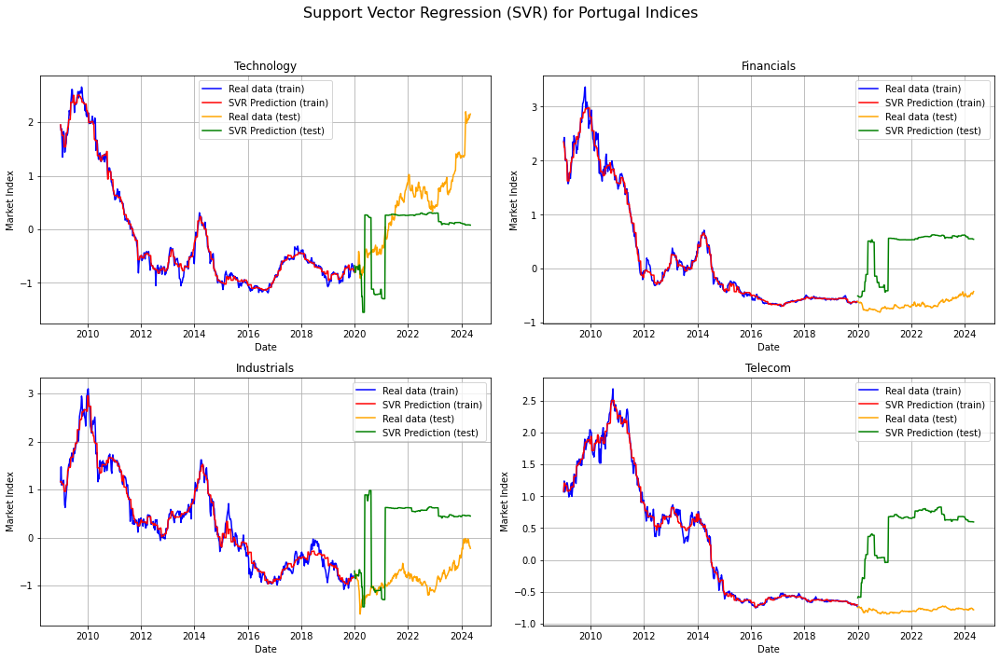

In [73]:
best_params = {
    'Technology': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'},
    'Financials': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'},
    'Industrials': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'},
    'Telecom': {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
}

svr_regression_split(portugal_normalized, 'Portugal', indices, control_var_portugal, best_params)

In [74]:
def random_forest_enhanced(df, indices, control_var):
    results = {}
    param_grid = {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10]
    }
    
    train_df = df[df.index < '2020-01-01']
    test_df = df[df.index >= '2020-01-01']
    X_train = train_df[control_var]
    X_test = test_df[control_var]

    for index in indices:
        y_train = train_df[index]
        y_test = test_df[index]
        
        rf = RandomForestRegressor(random_state=42)
        grid_search = GridSearchCV(rf, param_grid, cv=5, scoring='neg_mean_squared_error')
        grid_search.fit(X_train, y_train)

        best_rf = grid_search.best_estimator_
        y_pred = best_rf.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        feature_importances = best_rf.feature_importances_

        results[index] = {
            'MSE': mse,
            'Best Params': grid_search.best_params_,
            'Feature Importances': feature_importances
        }
        print(f"Results for {index}: {results[index]}")
    
    return results

In [75]:
france_results = random_forest_enhanced(france, indices, control_var_france)

Results for Technology: {'MSE': 619618.7319839619, 'Best Params': {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 100}, 'Feature Importances': array([2.16998056e-04, 5.48275795e-06, 0.00000000e+00, 2.60431520e-04,
       6.71153333e-07, 0.00000000e+00, 8.10156943e-03, 3.27509162e-02,
       2.82099382e-01, 6.27536700e-01, 4.00161087e-03, 4.24327738e-02,
       2.59346427e-03])}
Results for Financials: {'MSE': 13428.149026964878, 'Best Params': {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 200}, 'Feature Importances': array([5.02564164e-05, 1.47342719e-03, 0.00000000e+00, 1.26188974e-04,
       1.40533800e-04, 0.00000000e+00, 6.19619522e-02, 4.65729399e-01,
       6.06294632e-02, 1.58461382e-01, 3.13704785e-02, 1.74061562e-01,
       4.59953559e-02])}
Results for Industrials: {'MSE': 168518.5000725606, 'Best Params': {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 300}, 'Feature Importances': array([1.91086826e-05, 4.37941529e-05, 0.00000000e+00, 4.42

In [76]:
germany_results = random_forest_enhanced(germany, indices, control_var_germany)

Results for Technology: {'MSE': 526357.6633675267, 'Best Params': {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100}, 'Feature Importances': array([2.24852238e-05, 2.94193477e-03, 0.00000000e+00, 5.86472299e-06,
       1.49497864e-05, 3.77476055e-05, 0.00000000e+00, 6.97117724e-03,
       9.01049704e-03, 1.64644633e-01, 5.70095208e-01, 1.64545261e-02,
       9.31962431e-02, 1.36604733e-01])}
Results for Financials: {'MSE': 382213.0499094766, 'Best Params': {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100}, 'Feature Importances': array([1.39763605e-04, 2.19992886e-05, 0.00000000e+00, 3.36445184e-06,
       1.90092706e-05, 4.59303692e-05, 0.00000000e+00, 2.35551586e-01,
       4.12239715e-02, 8.00445663e-02, 6.01375411e-01, 2.61997123e-03,
       1.44233448e-02, 2.45310825e-02])}
Results for Industrials: {'MSE': 4146874.471455105, 'Best Params': {'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 100}, 'Feature Importances': array([1.27342189e-05, 2.4850728

In [77]:
switzerland_results = random_forest_enhanced(switzerland, indices, control_var_switzerland)

Results for Technology: {'MSE': 132762.95666260459, 'Best Params': {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 100}, 'Feature Importances': array([8.50327585e-05, 1.93032196e-03, 0.00000000e+00, 3.94349305e-02,
       3.21555994e-05, 0.00000000e+00, 1.03793227e-01, 5.68189527e-02,
       2.14583371e-02, 3.18010001e-01, 1.08758582e-02, 9.02869087e-03,
       6.07254790e-02, 3.77807013e-01])}
Results for Financials: {'MSE': 125939.00258088046, 'Best Params': {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 100}, 'Feature Importances': array([1.81224850e-03, 4.81943909e-04, 0.00000000e+00, 5.79331503e-04,
       2.90253549e-06, 0.00000000e+00, 4.33131597e-02, 4.83879744e-02,
       2.15569482e-01, 4.80513504e-01, 8.45604345e-03, 2.73325761e-02,
       7.17971510e-02, 1.01753683e-01])}
Results for Industrials: {'MSE': 109681.39674123297, 'Best Params': {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 100}, 'Feature Importances': array([4.62856785e-05,

In [78]:
portugal_results = random_forest_enhanced(portugal, indices, control_var_portugal)

Results for Technology: {'MSE': 12148.837934301682, 'Best Params': {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}, 'Feature Importances': array([5.12788115e-04, 0.00000000e+00, 8.94858680e-04, 1.44163475e-04,
       0.00000000e+00, 3.69439546e-01, 2.46684140e-02, 1.07640960e-01,
       1.25796436e-02, 3.06012650e-01, 6.44838723e-02, 1.13623104e-01])}
Results for Financials: {'MSE': 103352.50099803168, 'Best Params': {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}, 'Feature Importances': array([2.50663058e-04, 0.00000000e+00, 4.38734300e-02, 9.69087363e-05,
       0.00000000e+00, 3.17041841e-01, 8.19516393e-03, 3.54097397e-02,
       1.33813940e-02, 3.91301320e-01, 8.33597540e-02, 1.07089786e-01])}
Results for Industrials: {'MSE': 67209.39064500117, 'Best Params': {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100}, 'Feature Importances': array([9.79476847e-05, 0.00000000e+00, 1.33090791e-02, 1.60542102e-03,
       0.00000000e+00, 2.92019174

In [89]:
def train_optimal_models(df, indices, control_var, best_params, country):
    models = {}
    feature_importances = {}
    X = df[control_var]
    
    fig, axs = plt.subplots(len(indices), 1, figsize=(10, len(indices) * 5))
    if len(indices) == 1:
        axs = [axs] 

    for i, index in enumerate(indices):
        y = df[index]
        rf = RandomForestRegressor(
            n_estimators=best_params[index]['n_estimators'],
            max_depth=best_params[index]['max_depth'],
            min_samples_split=best_params[index]['min_samples_split'],
            random_state=42
        )
        
        rf.fit(X, y)
        
        model_path = f'random_forest_{index}_{country}.joblib'
        joblib.dump(rf, model_path)
        print(f"Model for {index} saved to {model_path}")
        
        y_pred = rf.predict(X)
        
        feature_importances[index] = rf.feature_importances_
        
        axs[i].plot(df.index, y, label='Real Data', color='blue')
        axs[i].plot(df.index, y_pred, label='Predicted Data', color='red')
        axs[i].set_title(f'Random Forest Prediction vs Real Data for {index}')
        axs[i].set_xlabel('Date')
        axs[i].set_ylabel(index)
        axs[i].legend()

    plt.tight_layout()
    plt.show()

    fig, axs = plt.subplots(len(indices), 1, figsize=(10, len(indices) * 5))
    if len(indices) == 1:
        axs = [axs]
    
    for i, index in enumerate(indices):
        axs[i].bar(control_var, feature_importances[index], color='teal')
        axs[i].set_title(f'Feature Importances for {index}')
        axs[i].set_ylabel('Importance')
        axs[i].set_xlabel('Features')
        axs[i].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

    return models


Model for Technology saved to random_forest_Technology_france.joblib
Model for Financials saved to random_forest_Financials_france.joblib
Model for Industrials saved to random_forest_Industrials_france.joblib
Model for Telecom saved to random_forest_Telecom_france.joblib


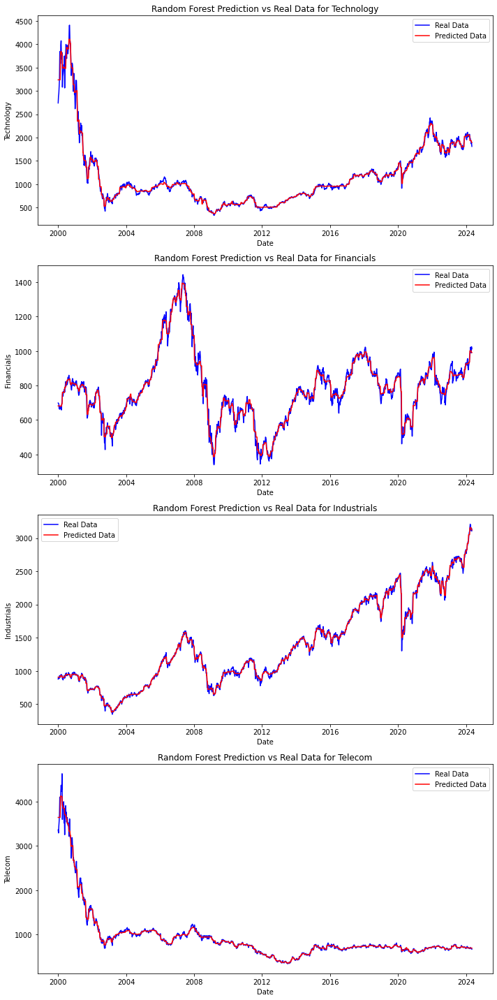

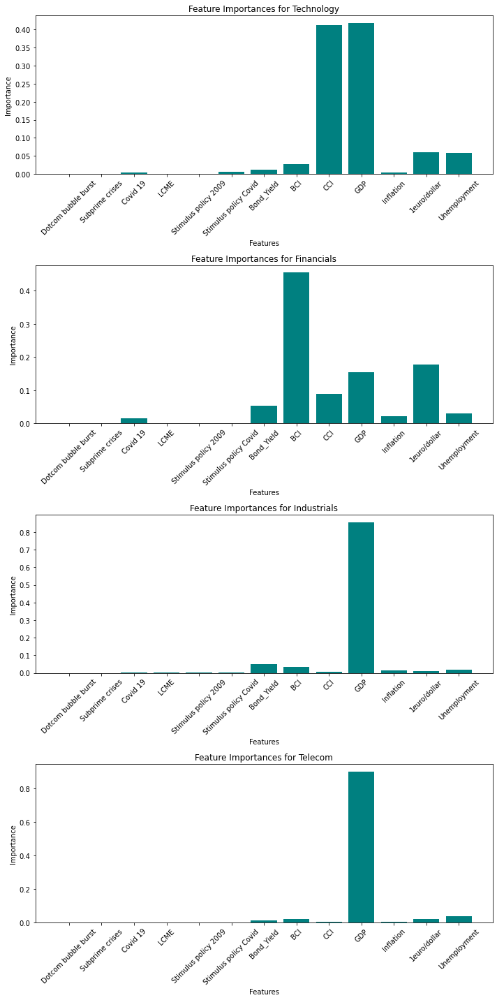

{}

In [90]:
best_params = {
    'Technology': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 10},
    'Financials': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 10},
    'Industrials': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 5},
    'Telecom': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 10}}

control_var_france = ['Dotcom bubble burst', 'Subprime crises', 'Covid 19', 'LCME', 'Stimulus policy 2009', 'Stimulus policy Covid','Bond_Yield','BCI','CCI','GDP','Inflation','1euro/dollar','Unemployment']
train_optimal_models(france,indices, control_var_france, best_params,'france')

Model for Technology saved to random_forest_Technology_germany.joblib
Model for Financials saved to random_forest_Financials_germany.joblib
Model for Industrials saved to random_forest_Industrials_germany.joblib
Model for Telecom saved to random_forest_Telecom_germany.joblib


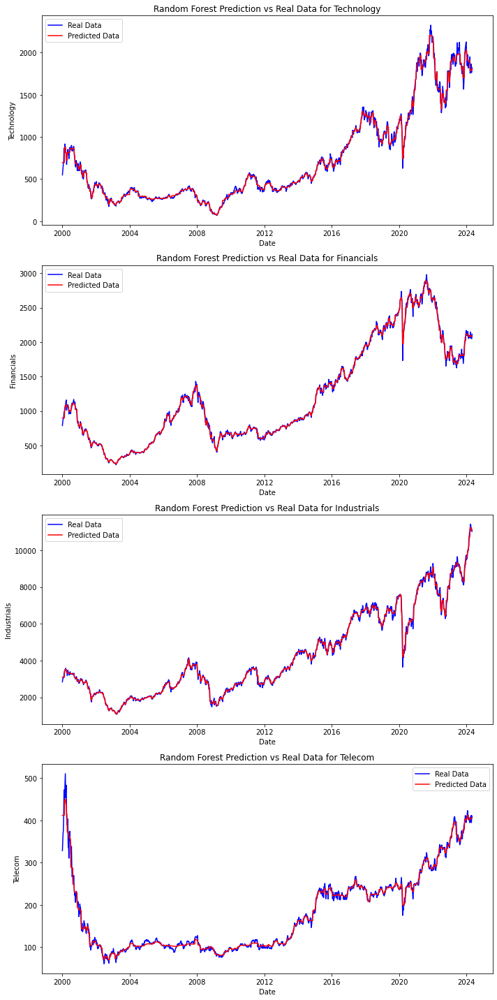

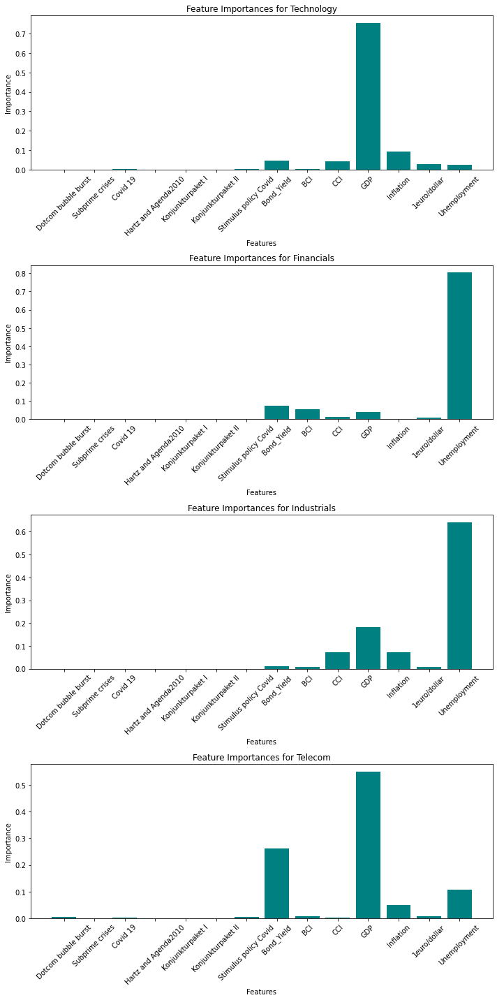

{}

In [91]:
best_params = {
    'Technology': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 2},
    'Financials': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 2},
    'Industrials': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 2},
    'Telecom': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 10}}


train_optimal_models(germany,indices, control_var_germany, best_params,'germany')

Model for Technology saved to random_forest_Technology_switzerland.joblib
Model for Financials saved to random_forest_Financials_switzerland.joblib
Model for Industrials saved to random_forest_Industrials_switzerland.joblib
Model for Telecom saved to random_forest_Telecom_switzerland.joblib


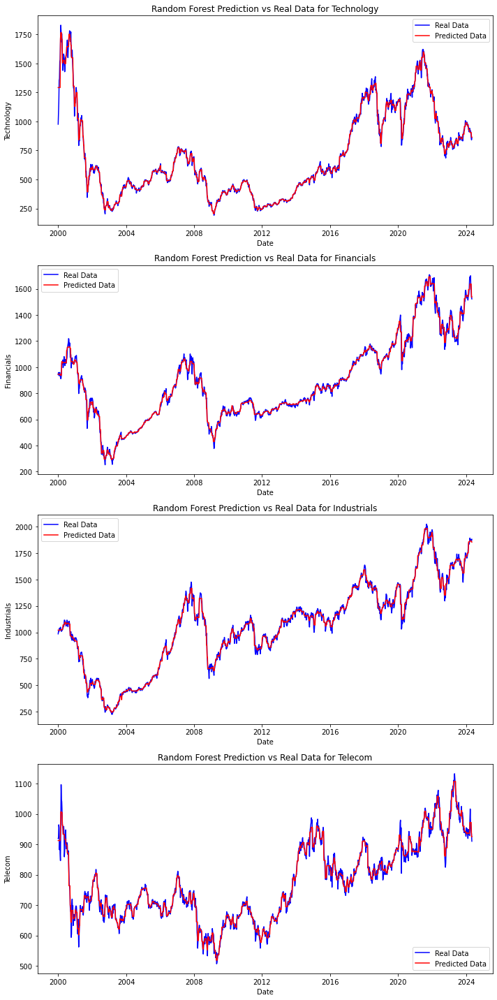

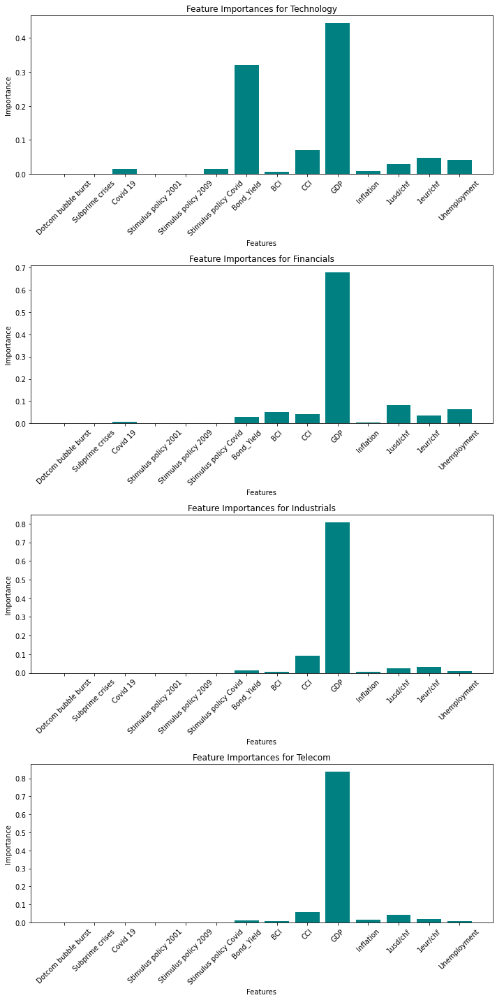

{}

In [92]:
best_params = {
    'Technology': {'n_estimators': 100, 'max_depth': 20, 'min_samples_split': 2},
    'Financials': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 10},
    'Industrials': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 10},
    'Telecom': {'n_estimators': 100, 'max_depth': 20, 'min_samples_split': 5}}


train_optimal_models(switzerland,indices, control_var_switzerland, best_params,'switzerland')

Model for Technology saved to random_forest_Technology_portugal.joblib
Model for Financials saved to random_forest_Financials_portugal.joblib
Model for Industrials saved to random_forest_Industrials_portugal.joblib
Model for Telecom saved to random_forest_Telecom_portugal.joblib


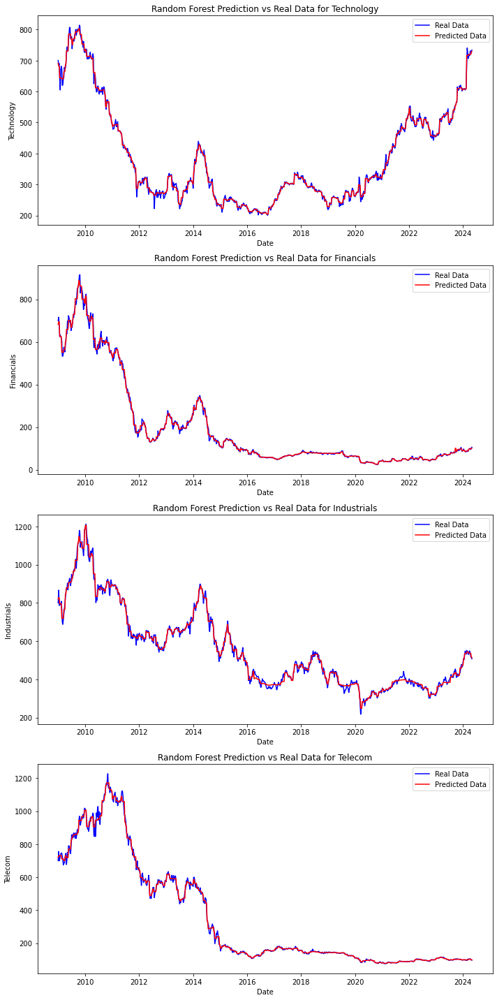

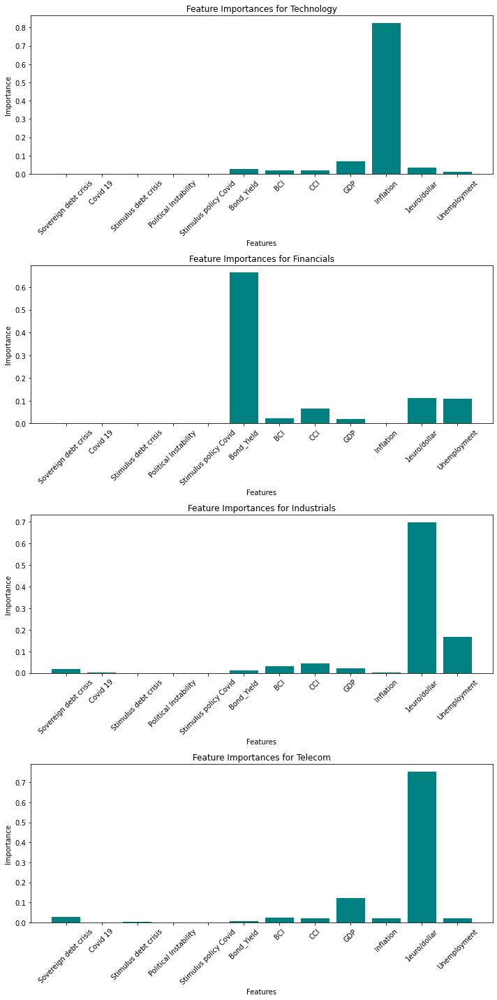

{}

In [83]:
best_params = {
    'Technology': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 2},
    'Financials': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 2},
    'Industrials': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 2},
    'Telecom': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 5}}


train_optimal_models(portugal,indices, control_var_portugal, best_params,'portugal')

In [93]:
def train_test_split_models(df, indices, control_vars, best_params, split_year="2020-01-01"):
    models = {}
    feature_importances = {}
    train_df = df[df.index < split_year]
    test_df = df[df.index >= split_year]

    fig, axs = plt.subplots(len(indices), 1, figsize=(10, len(indices) * 5))
    if len(indices) == 1:
        axs = [axs] 

    for i, index in enumerate(indices):
        X_train = train_df[control_vars]
        y_train = train_df[index]
        X_test = test_df[control_vars]
        y_test = test_df[index]
        
        rf = RandomForestRegressor(
            n_estimators=best_params[index]['n_estimators'],
            max_depth=best_params[index]['max_depth'],
            min_samples_split=best_params[index]['min_samples_split'],
            random_state=42
        )
        
        rf.fit(X_train, y_train)
        
        models[index] = rf
        
        y_train_pred = rf.predict(X_train)
        y_test_pred = rf.predict(X_test)
        
        feature_importances[index] = rf.feature_importances_
        
        axs[i].plot(train_df.index, y_train, label='Real Train Data', color='blue')
        axs[i].plot(train_df.index, y_train_pred, label='Predicted Train Data', color='red')
        axs[i].plot(test_df.index, y_test, label='Real Test Data', color='green')
        axs[i].plot(test_df.index, y_test_pred, label='Predicted Test Data', color='orange')
        axs[i].set_title(f'Random Forest Prediction vs Real Data for {index}')
        axs[i].set_xlabel('Date')
        axs[i].set_ylabel(index)
        axs[i].legend()

    plt.tight_layout()
    plt.show()

    fig, axs = plt.subplots(len(indices), 1, figsize=(10, len(indices) * 5))
    if len(indices) == 1:
        axs = [axs]
    
    for i, index in enumerate(indices):
        axs[i].bar(control_vars, feature_importances[index], color='teal')
        axs[i].set_title(f'Feature Importances for {index}')
        axs[i].set_ylabel('Importance')
        axs[i].set_xlabel('Features')
        axs[i].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

    return models

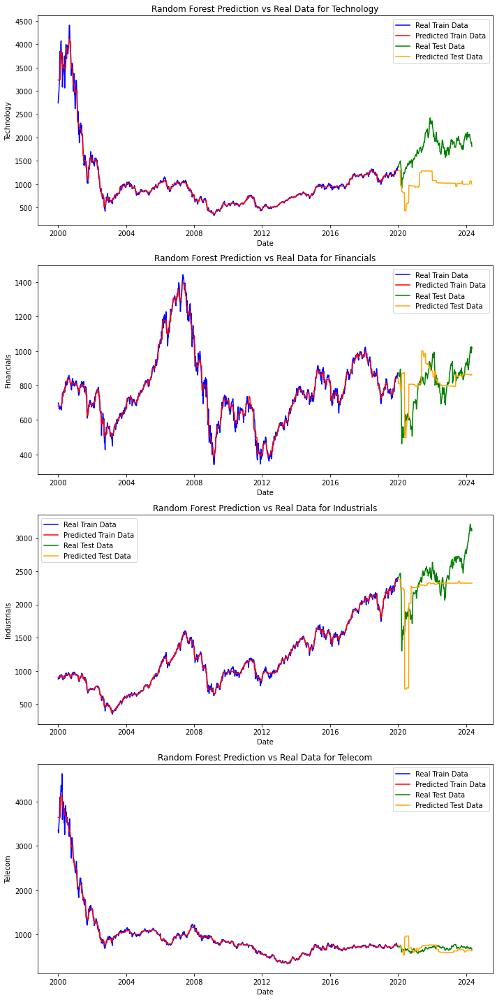

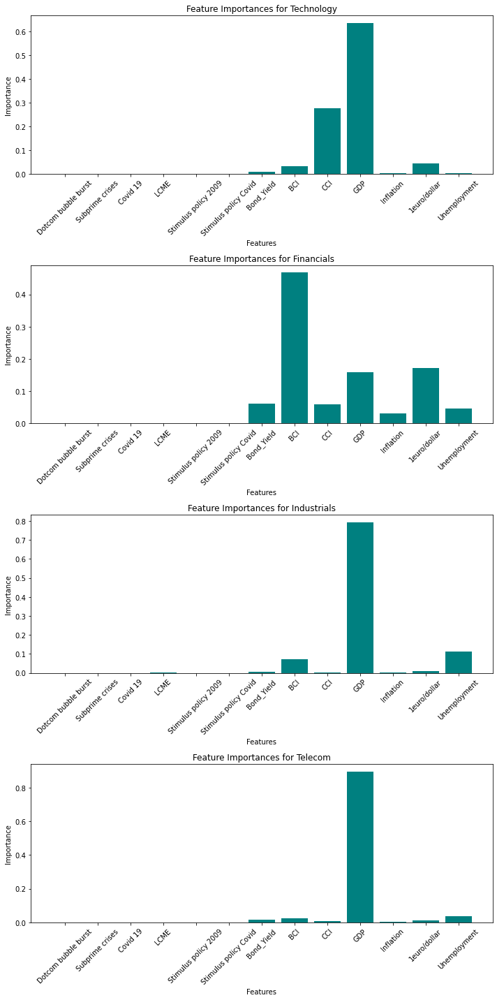

{'Technology': RandomForestRegressor(max_depth=10, min_samples_split=10, n_estimators=200,
                       random_state=42),
 'Financials': RandomForestRegressor(max_depth=10, min_samples_split=10, n_estimators=200,
                       random_state=42),
 'Industrials': RandomForestRegressor(max_depth=10, min_samples_split=5, n_estimators=200,
                       random_state=42),
 'Telecom': RandomForestRegressor(max_depth=10, min_samples_split=10, n_estimators=200,
                       random_state=42)}

In [94]:
best_params = {
    'Technology': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 10},
    'Financials': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 10},
    'Industrials': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 5},
    'Telecom': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 10}}
train_test_split_models(france, indices, control_var_france, best_params, split_year="2020-01-01")

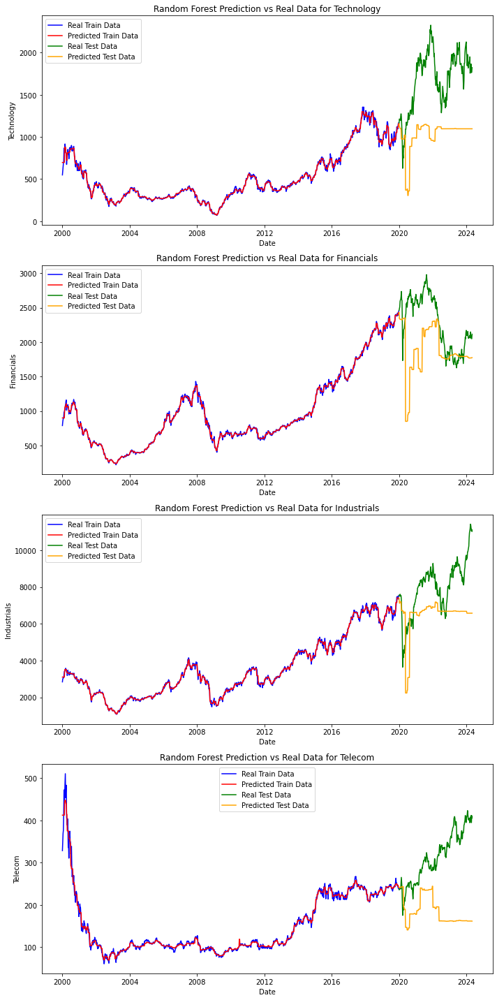

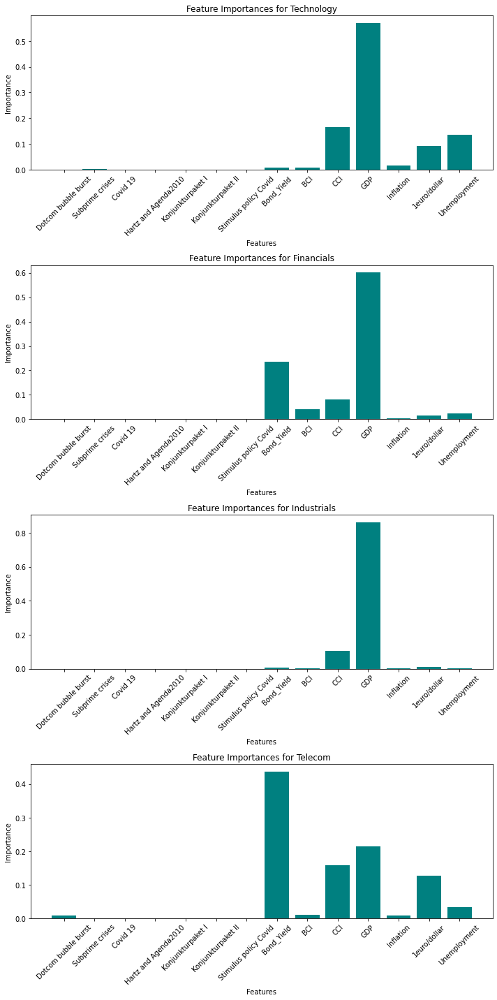

{'Technology': RandomForestRegressor(max_depth=10, random_state=42),
 'Financials': RandomForestRegressor(max_depth=10, random_state=42),
 'Industrials': RandomForestRegressor(max_depth=10, random_state=42),
 'Telecom': RandomForestRegressor(max_depth=10, min_samples_split=10, random_state=42)}

In [95]:
best_params = {
    'Technology': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 2},
    'Financials': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 2},
    'Industrials': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 2},
    'Telecom': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 10}}

train_test_split_models(germany, indices, control_var_germany, best_params, split_year="2020-01-01")

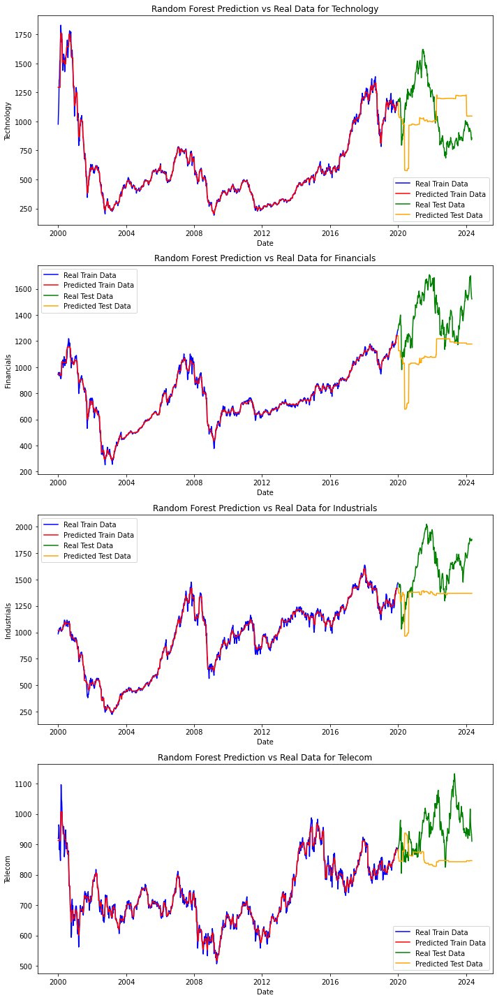

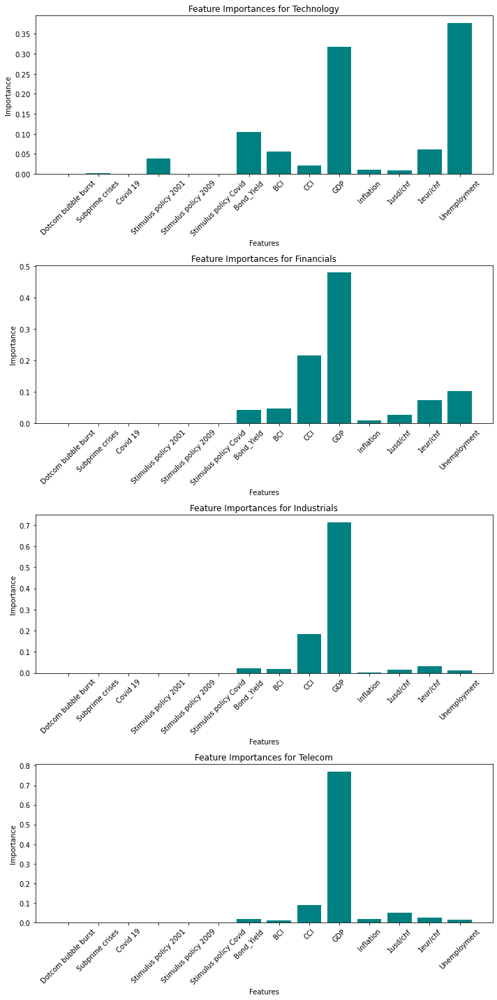

{'Technology': RandomForestRegressor(max_depth=20, random_state=42),
 'Financials': RandomForestRegressor(max_depth=10, min_samples_split=10, random_state=42),
 'Industrials': RandomForestRegressor(max_depth=10, min_samples_split=10, random_state=42),
 'Telecom': RandomForestRegressor(max_depth=20, min_samples_split=5, random_state=42)}

In [96]:
best_params = {
    'Technology': {'n_estimators': 100, 'max_depth': 20, 'min_samples_split': 2},
    'Financials': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 10},
    'Industrials': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 10},
    'Telecom': {'n_estimators': 100, 'max_depth': 20, 'min_samples_split': 5}}

train_test_split_models(switzerland, indices, control_var_switzerland, best_params, split_year="2020-01-01")

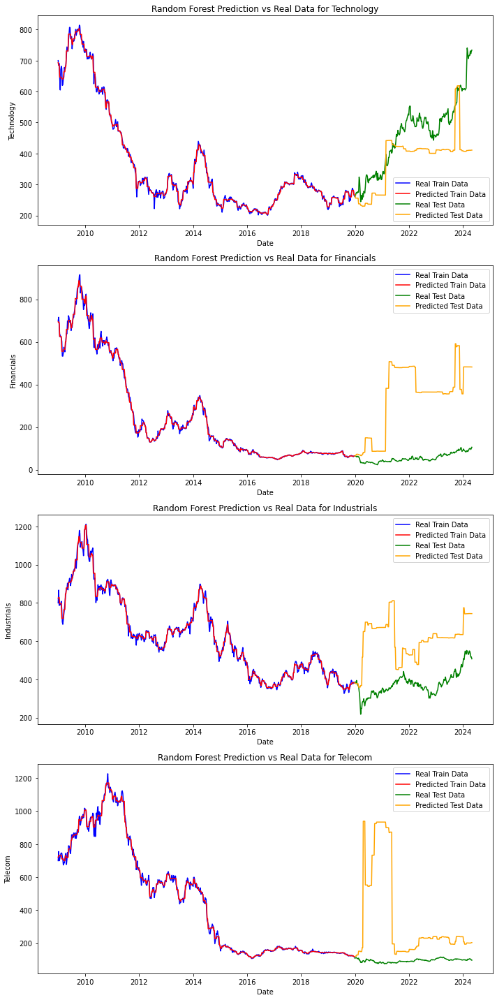

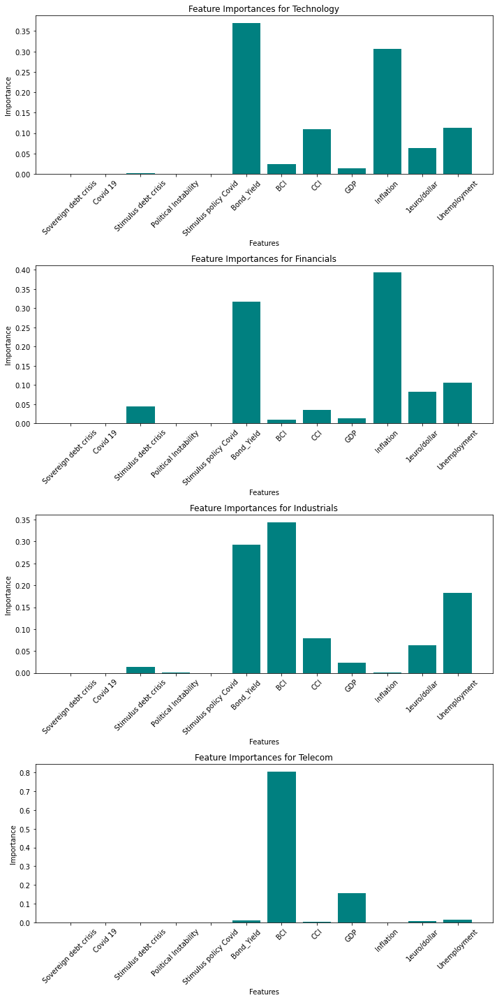

{'Technology': RandomForestRegressor(max_depth=10, n_estimators=200, random_state=42),
 'Financials': RandomForestRegressor(max_depth=10, n_estimators=200, random_state=42),
 'Industrials': RandomForestRegressor(max_depth=10, random_state=42),
 'Telecom': RandomForestRegressor(max_depth=10, min_samples_split=5, random_state=42)}

In [97]:
best_params = {
    'Technology': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 2},
    'Financials': {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 2},
    'Industrials': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 2},
    'Telecom': {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 5}}


train_test_split_models(portugal, indices, control_var_portugal, best_params, split_year="2020-01-01")

### 6-Forecasting with Prophet and Sarima

In [43]:
pip install pmdarima

Note: you may need to restart the kernel to use updated packages.



Processing column: Technology

Performing stepwise search to minimize aic


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,1)(0,1,1)[52]             : AIC=inf, Time=48.69 sec
 ARIMA(0,1,0)(0,1,0)[52]             : AIC=14269.144, Time=1.05 sec
 ARIMA(1,1,0)(1,1,0)[52]             : AIC=inf, Time=10.71 sec
 ARIMA(0,1,1)(0,1,1)[52]             : AIC=inf, Time=30.31 sec
 ARIMA(0,1,0)(1,1,0)[52]             : AIC=inf, Time=7.09 sec
 ARIMA(0,1,0)(0,1,1)[52]             : AIC=inf, Time=29.78 sec
 ARIMA(0,1,0)(1,1,1)[52]             : AIC=inf, Time=30.57 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,0)(0,1,0)[52]             : AIC=14269.323, Time=1.06 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,1,0)[52]             : AIC=14269.398, Time=1.63 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,1,0)[52]             : AIC=14271.240, Time=3.29 sec
 ARIMA(0,1,0)(0,1,0)[52] intercept   : AIC=14271.142, Time=1.31 sec

Best model:  ARIMA(0,1,0)(0,1,0)[52]          
Total fit time: 165.553 seconds
                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                 1270
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 52)   Log Likelihood               -7133.572
Date:                            Mon, 20 May 2024   AIC                          14269.144
Time:                                    09:46:00   BIC                          14274.248
Sample:                                01-05-2000   HQIC                         14271.065
                                     - 05-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|  

/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


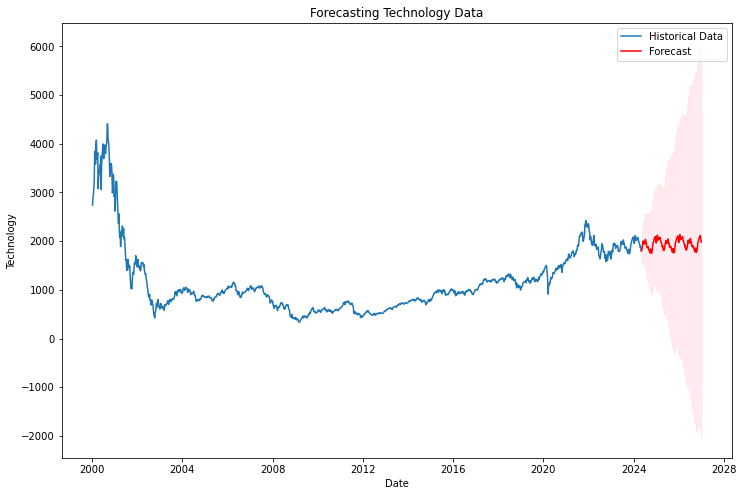

An error occurred for Technology: No figure None

Processing column: Financials

Financials series is non-stationary. Differencing is needed.
Performing stepwise search to minimize aic


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,1)(0,1,1)[52]             : AIC=inf, Time=72.66 sec
 ARIMA(0,1,0)(0,1,0)[52]             : AIC=12462.704, Time=0.83 sec
 ARIMA(1,1,0)(1,1,0)[52]             : AIC=12112.334, Time=8.08 sec
 ARIMA(0,1,1)(0,1,1)[52]             : AIC=inf, Time=27.06 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,0)(0,1,0)[52]             : AIC=12444.553, Time=0.90 sec
 ARIMA(1,1,0)(2,1,0)[52]             : AIC=inf, Time=25.14 sec
 ARIMA(1,1,0)(1,1,1)[52]             : AIC=inf, Time=40.08 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,0)(0,1,1)[52]             : AIC=inf, Time=24.14 sec
 ARIMA(1,1,0)(2,1,1)[52]             : AIC=inf, Time=109.58 sec
 ARIMA(0,1,0)(1,1,0)[52]             : AIC=12128.657, Time=6.24 sec
 ARIMA(2,1,0)(1,1,0)[52]             : AIC=12113.946, Time=10.97 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(1,1,0)[52]             : AIC=12114.058, Time=12.81 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(1,1,0)[52]             : AIC=12113.313, Time=9.15 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,1,1)(1,1,0)[52]             : AIC=12113.213, Time=35.25 sec
 ARIMA(1,1,0)(1,1,0)[52] intercept   : AIC=12114.323, Time=34.03 sec

Best model:  ARIMA(1,1,0)(1,1,0)[52]          
Total fit time: 416.983 seconds
                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                 1270
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 52)   Log Likelihood               -6053.167
Date:                            Mon, 20 May 2024   AIC                          12112.334
Time:                                    09:52:59   BIC                          12127.647
Sample:                                01-05-2000   HQIC                         12118.099
                                     - 05-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|

/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.78447D+00    |proj g|=  1.29990D-02


 This problem is unconstrained.



At iterate    5    f=  4.78099D+00    |proj g|=  4.17337D-02

At iterate   10    f=  4.76628D+00    |proj g|=  2.48088D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     12     15      1     0     0   1.949D-06   4.766D+00
  F =   4.7662734205659456     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


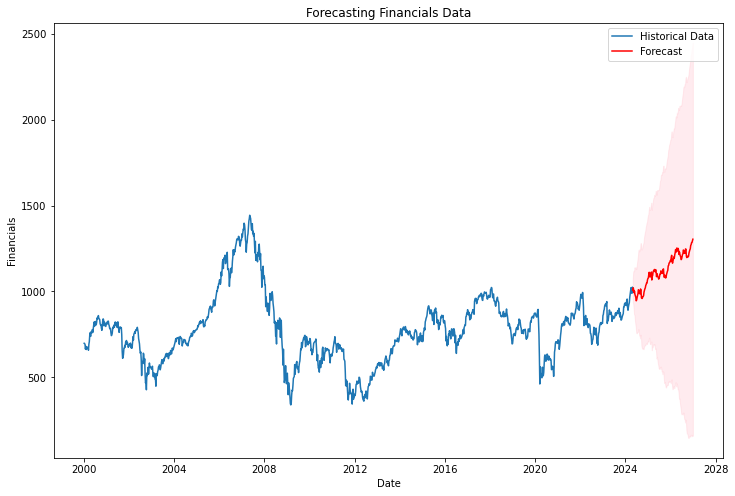

An error occurred for Financials: No figure None

Processing column: Industrials

Industrials series is non-stationary. Differencing is needed.
Performing stepwise search to minimize aic


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,1)(0,1,1)[52]             : AIC=inf, Time=69.89 sec
 ARIMA(0,1,0)(0,1,0)[52]             : AIC=13564.121, Time=1.08 sec
 ARIMA(1,1,0)(1,1,0)[52]             : AIC=13232.585, Time=10.35 sec
 ARIMA(0,1,1)(0,1,1)[52]             : AIC=inf, Time=24.86 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,0)(0,1,0)[52]             : AIC=13564.780, Time=1.01 sec
 ARIMA(1,1,0)(2,1,0)[52]             : AIC=inf, Time=27.31 sec
 ARIMA(1,1,0)(1,1,1)[52]             : AIC=inf, Time=37.75 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,0)(0,1,1)[52]             : AIC=inf, Time=24.17 sec
 ARIMA(1,1,0)(2,1,1)[52]             : AIC=inf, Time=118.89 sec
 ARIMA(0,1,0)(1,1,0)[52]             : AIC=13231.897, Time=7.24 sec
 ARIMA(0,1,0)(2,1,0)[52]             : AIC=inf, Time=19.44 sec
 ARIMA(0,1,0)(1,1,1)[52]             : AIC=inf, Time=48.73 sec
 ARIMA(0,1,0)(0,1,1)[52]             : AIC=inf, Time=17.16 sec
 ARIMA(0,1,0)(2,1,1)[52]             : AIC=inf, Time=138.53 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(1,1,0)[52]             : AIC=13232.628, Time=9.44 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(1,1,0)[52]             : AIC=13234.446, Time=14.81 sec
 ARIMA(0,1,0)(1,1,0)[52] intercept   : AIC=13233.787, Time=32.39 sec

Best model:  ARIMA(0,1,0)(1,1,0)[52]          
Total fit time: 603.150 seconds
                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                 1270
Model:             SARIMAX(0, 1, 0)x(1, 1, 0, 52)   Log Likelihood               -6613.948
Date:                            Mon, 20 May 2024   AIC                          13231.897
Time:                                    10:03:11   BIC                          13242.105
Sample:                                01-05-2000   HQIC                         13235.739
                                     - 05-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|

/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.20821D+00    |proj g|=  1.27310D-02


 This problem is unconstrained.



At iterate    5    f=  5.20804D+00    |proj g|=  1.82141D-03

At iterate   10    f=  5.20784D+00    |proj g|=  2.56823D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     12     14      1     0     0   6.068D-06   5.208D+00
  F =   5.2078333150366767     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


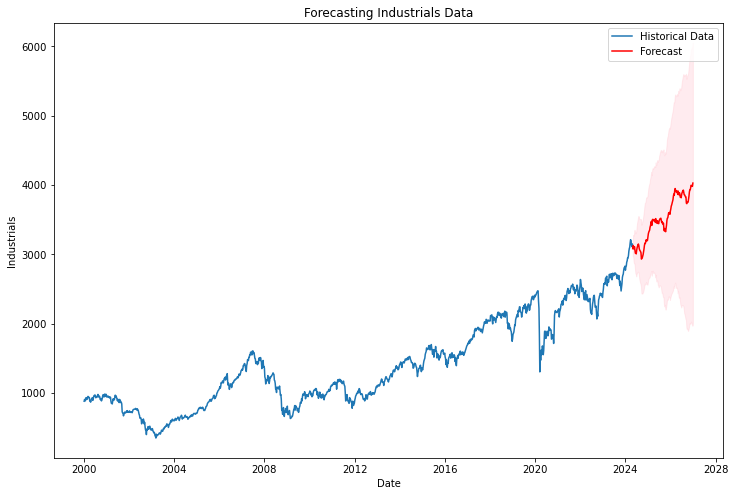

An error occurred for Industrials: No figure None

Processing column: Telecom

Performing stepwise search to minimize aic


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,1)(0,1,1)[52]             : AIC=inf, Time=41.33 sec
 ARIMA(0,1,0)(0,1,0)[52]             : AIC=13739.106, Time=1.07 sec
 ARIMA(1,1,0)(1,1,0)[52]             : AIC=13542.777, Time=11.81 sec
 ARIMA(0,1,1)(0,1,1)[52]             : AIC=inf, Time=33.19 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,0)(0,1,0)[52]             : AIC=13702.800, Time=0.98 sec
 ARIMA(1,1,0)(2,1,0)[52]             : AIC=13496.823, Time=30.37 sec
 ARIMA(1,1,0)(2,1,1)[52]             : AIC=inf, Time=152.90 sec
 ARIMA(1,1,0)(1,1,1)[52]             : AIC=inf, Time=41.77 sec
 ARIMA(0,1,0)(2,1,0)[52]             : AIC=13561.571, Time=30.14 sec
 ARIMA(2,1,0)(2,1,0)[52]             : AIC=13498.823, Time=36.58 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(2,1,0)[52]             : AIC=13498.823, Time=46.11 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(2,1,0)[52]             : AIC=13500.363, Time=31.61 sec


/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,1,1)(2,1,0)[52]             : AIC=13500.819, Time=36.25 sec
 ARIMA(1,1,0)(2,1,0)[52] intercept   : AIC=13497.777, Time=123.46 sec

Best model:  ARIMA(1,1,0)(2,1,0)[52]          
Total fit time: 617.683 seconds
                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                 1270
Model:             SARIMAX(1, 1, 0)x(2, 1, 0, 52)   Log Likelihood               -6744.412
Date:                            Mon, 20 May 2024   AIC                          13496.823
Time:                                    10:13:38   BIC                          13517.240
Sample:                                01-05-2000   HQIC                         13504.509
                                     - 05-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z

/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
/Users/mattso/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.33473D+00    |proj g|=  6.25138D-02

At iterate    5    f=  5.31893D+00    |proj g|=  2.53086D-03

At iterate   10    f=  5.31195D+00    |proj g|=  2.11100D-02

At iterate   15    f=  5.31056D+00    |proj g|=  3.46780D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     15     18      1     0     0   3.468D-06   5.311D+00
  F =   5.3105603450913783     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


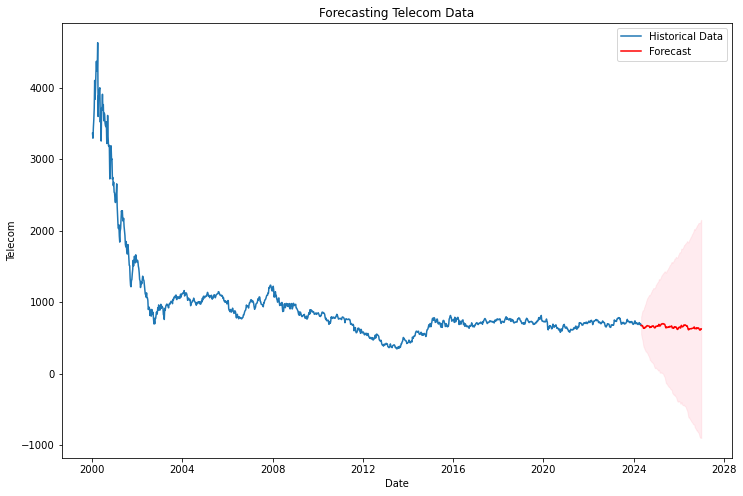

An error occurred for Telecom: No figure None


In [111]:
columns_to_forecast = ['Technology', 'Financials', 'Industrials', 'Telecom']

forecast_start = '2024-05-01'
forecast_end = '2027-01-01'
forecast_steps = len(pd.date_range(start=forecast_start, end=forecast_end, freq='W-WED'))

sarima_models = {}
forecasts = {}

pdf_filename = 'sarima_forecast_france.pdf'
pdf_pages = PdfPages(pdf_filename)

for column in columns_to_forecast:
    print(f"\nProcessing column: {column}\n")

    result = adfuller(france[column])

    if result[1] > 0.05:
        print(f"{column} series is non-stationary. Differencing is needed.")
    try:
        stepwise_model = auto_arima(france[column], start_p=1, start_q=1,
                                    max_p=3, max_q=3, m=52,  
                                    start_P=0, seasonal=True,
                                    d=1, D=1, trace=True,
                                    error_action='ignore',
                                    suppress_warnings=True,
                                    stepwise=True)

        print(stepwise_model.summary())

        model = SARIMAX(france[column],
                        order=stepwise_model.order,
                        seasonal_order=stepwise_model.seasonal_order)

        results = model.fit()

        forecast = results.get_forecast(steps=forecast_steps)
        forecast_index = pd.date_range(start=forecast_start, periods=forecast_steps, freq='W-WED')
        forecast_values = forecast.predicted_mean
        forecast_conf_int = forecast.conf_int()

        sarima_models[column] = results
        forecasts[column] = (forecast_values, forecast_conf_int)
        pdf_filename = 'sarima_forecast_plots.pdf'
        pdf_pages = PdfPages(pdf_filename)

        plt.figure(figsize=(12, 8))
        plt.plot(france[column], label='Historical Data')
        plt.plot(forecast_index, forecast_values, label='Forecast', color='red')
        plt.fill_between(forecast_index,
                         forecast_conf_int.iloc[:, 0],
                         forecast_conf_int.iloc[:, 1], color='pink', alpha=0.3)
        plt.legend()
        plt.title(f'Forecasting {column} Data')
        plt.xlabel('Date')
        plt.ylabel(column)
        plt.show()
        pdf_pages.savefig()
        plt.close()

    except Exception as e:
        print(f"An error occurred for {column}: {e}")
pdf_pages.close()

In [44]:
pip install prophet

Note: you may need to restart the kernel to use updated packages.


19:16:57 - cmdstanpy - INFO - Chain [1] start processing
19:16:57 - cmdstanpy - INFO - Chain [1] done processing


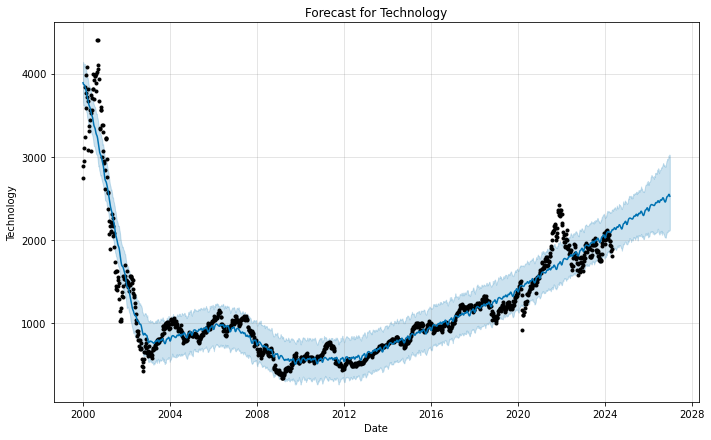

19:16:57 - cmdstanpy - INFO - Chain [1] start processing
19:16:58 - cmdstanpy - INFO - Chain [1] done processing


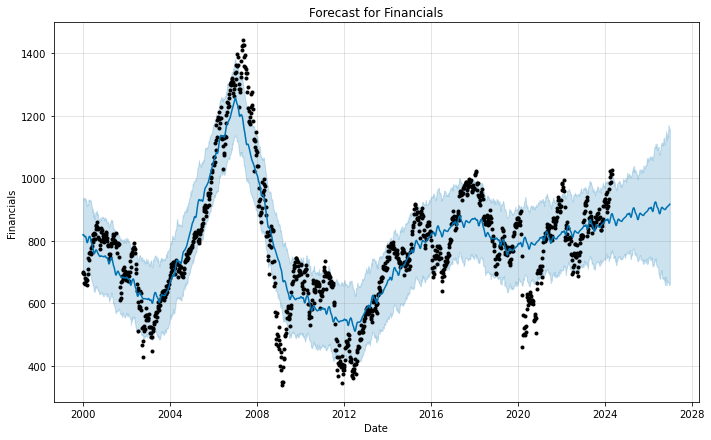

19:16:58 - cmdstanpy - INFO - Chain [1] start processing
19:16:59 - cmdstanpy - INFO - Chain [1] done processing


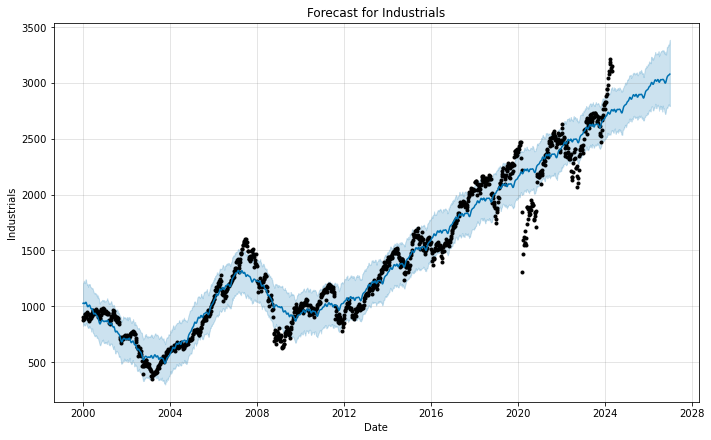

19:16:59 - cmdstanpy - INFO - Chain [1] start processing
19:16:59 - cmdstanpy - INFO - Chain [1] done processing


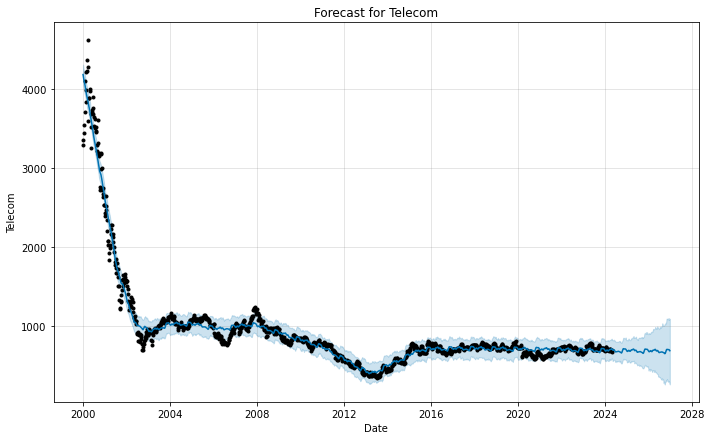

In [54]:
columns_to_forecast = ['Technology', 'Financials', 'Industrials', 'Telecom']

models = {}
forecasts = {}

pdf_filename = 'forecast_france.pdf'
pdf_pages = PdfPages(pdf_filename)

for column in columns_to_forecast:
    prophet_df = france[[column]].copy()
    
    prophet_df.reset_index(inplace=True)
    
    prophet_df.rename(columns={prophet_df.columns[0]: 'ds', column: 'y'}, inplace=True)
    
    prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], errors='coerce')
    
    prophet_df = prophet_df.dropna(subset=['ds'])
    
    model = Prophet()
    model.fit(prophet_df)
    last_date = prophet_df['ds'].max()
    end_date = pd.to_datetime('2027-01-01')
    n_weeks = (end_date - last_date).days // 7
    
    future = model.make_future_dataframe(periods=n_weeks, freq='W')
    
    forecast = model.predict(future)
    
    models[column] = model
    forecasts[column] = forecast
    
    fig1 = model.plot(forecast)
    plt.title(f'Forecast for {column}')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.show()
    pdf_pages.savefig(fig1)
    plt.close(fig1)
    fig2 = model.plot_components(forecast)
    pdf_pages.savefig(fig2)
    plt.close(fig2)
    plt.show()
pdf_pages.close()

In [ ]:
columns_to_forecast = ['Technology', 'Financials', 'Industrials', 'Telecom']

forecast_start = '2024-05-01'
forecast_end = '2027-01-01'
forecast_steps = len(pd.date_range(start=forecast_start, end=forecast_end, freq='W-WED'))

sarima_models = {}
forecasts = {}

pdf_filename = 'sarima_forecast_germany.pdf'
pdf_pages = PdfPages(pdf_filename)


for column in columns_to_forecast:
    print(f"\nProcessing column: {column}\n")

    result = adfuller(germany[column])
    print(f'ADF Statistic for {column}: {result[0]}')
    print(f'p-value for {column}: {result[1]}')

    if result[1] > 0.05:
        print(f"{column} series is non-stationary. Differencing is needed.")

    try:
        stepwise_model = auto_arima(germany[column], start_p=1, start_q=1,
                                    max_p=3, max_q=3, m=52,  # m=52 for weekly data
                                    start_P=0, seasonal=True,
                                    d=1, D=1, trace=True,
                                    error_action='ignore',
                                    suppress_warnings=True,
                                    stepwise=True)

        print(stepwise_model.summary())

        model = SARIMAX(germany[column],
                        order=stepwise_model.order,
                        seasonal_order=stepwise_model.seasonal_order)

        results = model.fit()
        forecast = results.get_forecast(steps=forecast_steps)
        forecast_index = pd.date_range(start=forecast_start, periods=forecast_steps, freq='W-WED')
        forecast_values = forecast.predicted_mean
        forecast_conf_int = forecast.conf_int()

        sarima_models[column] = results
        forecasts[column] = (forecast_values, forecast_conf_int)

        plt.figure(figsize=(12, 8))
        plt.plot(germany[column], label='Historical Data')
        plt.plot(forecast_index, forecast_values, label='Forecast', color='red')
        plt.fill_between(forecast_index,
                         forecast_conf_int.iloc[:, 0],
                         forecast_conf_int.iloc[:, 1], color='pink', alpha=0.3)
        plt.legend()
        plt.title(f'Forecasting {column} Data')
        plt.xlabel('Date')
        plt.ylabel(column)
        plt.show()
        pdf_pages.savefig()
        plt.close()

    except Exception as e:
        print(f"An error occurred for {column}: {e}")
pdf_pages.close()


Processing column: Telecom

ADF Statistic for Telecom: -0.7442744075072147
p-value for Telecom: 0.834945845821923
Telecom series is non-stationary. Differencing is needed.
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[52]             : AIC=inf, Time=32.23 sec
 ARIMA(0,1,0)(0,1,0)[52]             : AIC=8834.627, Time=1.04 sec
 ARIMA(1,1,0)(1,1,0)[52]             : AIC=8615.813, Time=6.67 sec
 ARIMA(0,1,1)(0,1,1)[52]             : AIC=inf, Time=18.40 sec
 ARIMA(1,1,0)(0,1,0)[52]             : AIC=8835.203, Time=1.03 sec
 ARIMA(1,1,0)(2,1,0)[52]             : AIC=8542.936, Time=19.11 sec
 ARIMA(1,1,0)(2,1,1)[52]             : AIC=inf, Time=66.68 sec
 ARIMA(1,1,0)(1,1,1)[52]             : AIC=inf, Time=26.35 sec
 ARIMA(0,1,0)(2,1,0)[52]             : AIC=8542.151, Time=17.16 sec
 ARIMA(0,1,0)(1,1,0)[52]             : AIC=8614.178, Time=6.41 sec
 ARIMA(0,1,0)(2,1,1)[52]             : AIC=inf, Time=60.62 sec
 ARIMA(0,1,0)(1,1,1)[52]             : AIC=inf, Time=19.04 sec
 A

21:46:42 - cmdstanpy - INFO - Chain [1] start processing
21:46:43 - cmdstanpy - INFO - Chain [1] done processing


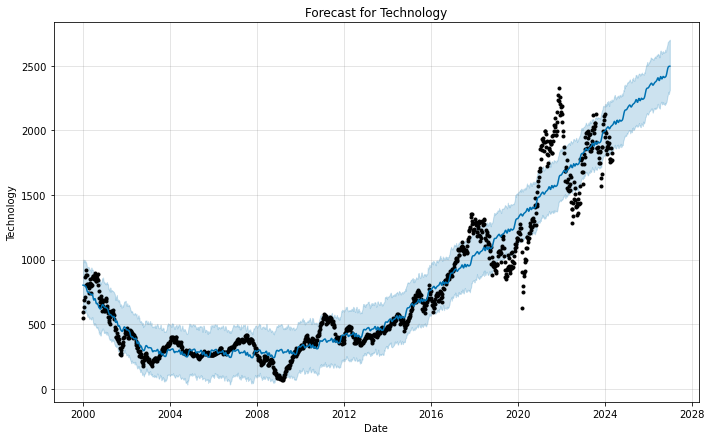

21:46:43 - cmdstanpy - INFO - Chain [1] start processing
21:46:44 - cmdstanpy - INFO - Chain [1] done processing


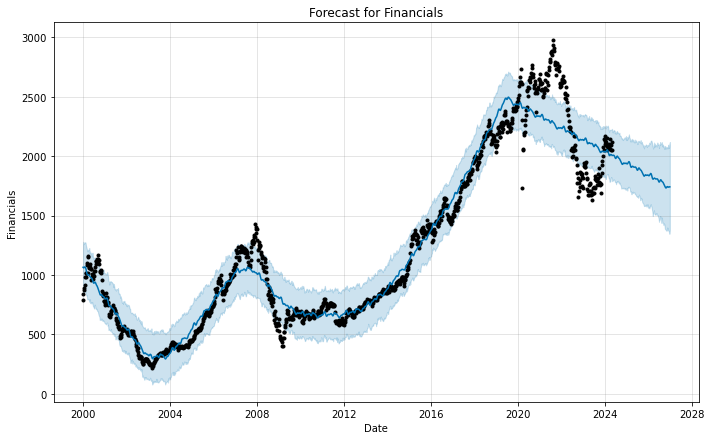

21:46:44 - cmdstanpy - INFO - Chain [1] start processing
21:46:44 - cmdstanpy - INFO - Chain [1] done processing


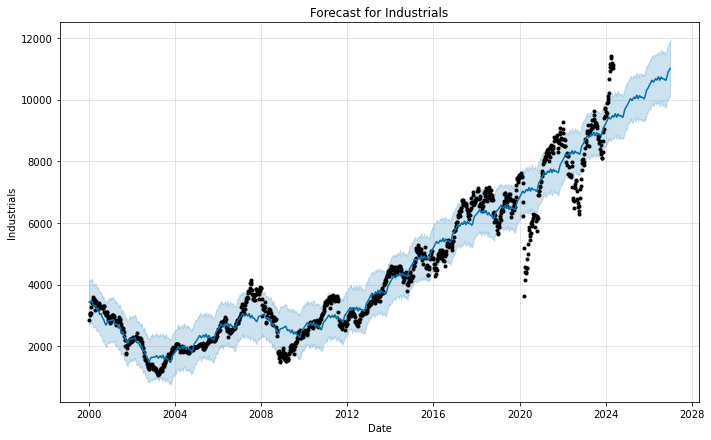

21:46:45 - cmdstanpy - INFO - Chain [1] start processing
21:46:45 - cmdstanpy - INFO - Chain [1] done processing


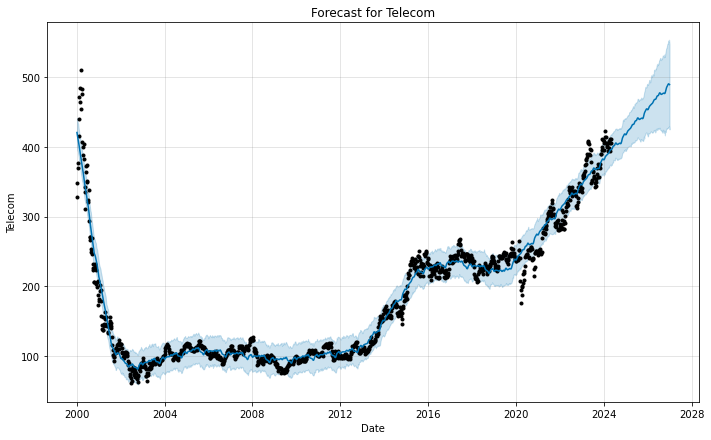

In [48]:
columns_to_forecast = ['Technology', 'Financials', 'Industrials', 'Telecom']

models = {}
forecasts = {}

pdf_filename = 'forecast_germany.pdf'
pdf_pages = PdfPages(pdf_filename)

for column in columns_to_forecast:
    prophet_df = germany[[column]].copy()
    
    prophet_df.reset_index(inplace=True)
    
    prophet_df.rename(columns={prophet_df.columns[0]: 'ds', column: 'y'}, inplace=True)
    
    prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], errors='coerce')
    
    prophet_df = prophet_df.dropna(subset=['ds'])
    
    model = Prophet()
    model.fit(prophet_df)
    last_date = prophet_df['ds'].max()
    end_date = pd.to_datetime('2027-01-01')
    n_weeks = (end_date - last_date).days // 7
    
    future = model.make_future_dataframe(periods=n_weeks, freq='W')
    
    forecast = model.predict(future)
    
    models[column] = model
    forecasts[column] = forecast
    
    fig1 = model.plot(forecast)
    plt.title(f'Forecast for {column}')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.show()
    pdf_pages.savefig(fig1)
    plt.close(fig1)
    fig2 = model.plot_components(forecast)
    pdf_pages.savefig(fig2)
    plt.close(fig2)
    plt.show()
pdf_pages.close()

In [ ]:
columns_to_forecast = ['Technology', 'Financials', 'Industrials', 'Telecom']

forecast_start = '2024-05-01'
forecast_end = '2027-01-01'
forecast_steps = len(pd.date_range(start=forecast_start, end=forecast_end, freq='W-WED'))

sarima_models = {}
forecasts = {}

pdf_filename = 'sarima_forecast_switzerland.pdf'
pdf_pages = PdfPages(pdf_filename)


for column in columns_to_forecast:
    print(f"\nProcessing column: {column}\n")

    result = adfuller(switzerland[column])
    print(f'ADF Statistic for {column}: {result[0]}')
    print(f'p-value for {column}: {result[1]}')

    if result[1] > 0.05:
        print(f"{column} series is non-stationary. Differencing is needed.")

    try:
        stepwise_model = auto_arima(switzerland[column], start_p=1, start_q=1,
                                    max_p=3, max_q=3, m=52,  # m=52 for weekly data
                                    start_P=0, seasonal=True,
                                    d=1, D=1, trace=True,
                                    error_action='ignore',
                                    suppress_warnings=True,
                                    stepwise=True)

        print(stepwise_model.summary())

        model = SARIMAX(switzerland[column],
                        order=stepwise_model.order,
                        seasonal_order=stepwise_model.seasonal_order)

        results = model.fit()

        forecast = results.get_forecast(steps=forecast_steps)
        forecast_index = pd.date_range(start=forecast_start, periods=forecast_steps, freq='W-WED')
        forecast_values = forecast.predicted_mean
        forecast_conf_int = forecast.conf_int()

        sarima_models[column] = results
        forecasts[column] = (forecast_values, forecast_conf_int)

        plt.figure(figsize=(12, 8))
        plt.plot(switzerland[column], label='Historical Data')
        plt.plot(forecast_index, forecast_values, label='Forecast', color='red')
        plt.fill_between(forecast_index,
                         forecast_conf_int.iloc[:, 0],
                         forecast_conf_int.iloc[:, 1], color='pink', alpha=0.3)
        plt.legend()
        plt.title(f'Forecasting {column} Data')
        plt.xlabel('Date')
        plt.ylabel(column)
        plt.show()
        pdf_pages.savefig()
        plt.close()

    except Exception as e:
        print(f"An error occurred for {column}: {e}")
pdf_pages.close()

21:47:07 - cmdstanpy - INFO - Chain [1] start processing
21:47:07 - cmdstanpy - INFO - Chain [1] done processing


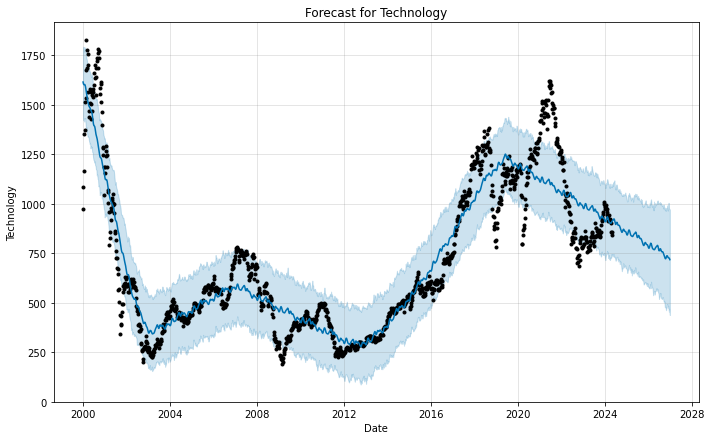

21:47:08 - cmdstanpy - INFO - Chain [1] start processing
21:47:08 - cmdstanpy - INFO - Chain [1] done processing


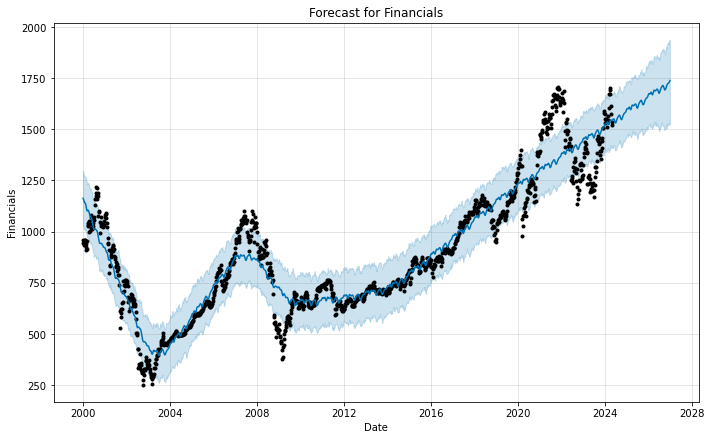

21:47:08 - cmdstanpy - INFO - Chain [1] start processing
21:47:08 - cmdstanpy - INFO - Chain [1] done processing


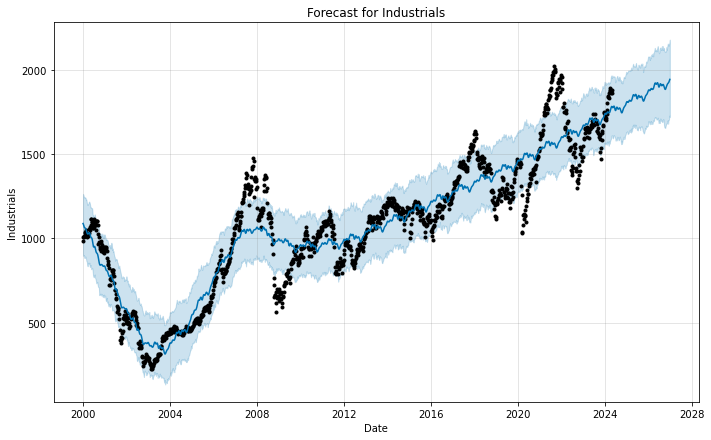

21:47:09 - cmdstanpy - INFO - Chain [1] start processing
21:47:09 - cmdstanpy - INFO - Chain [1] done processing


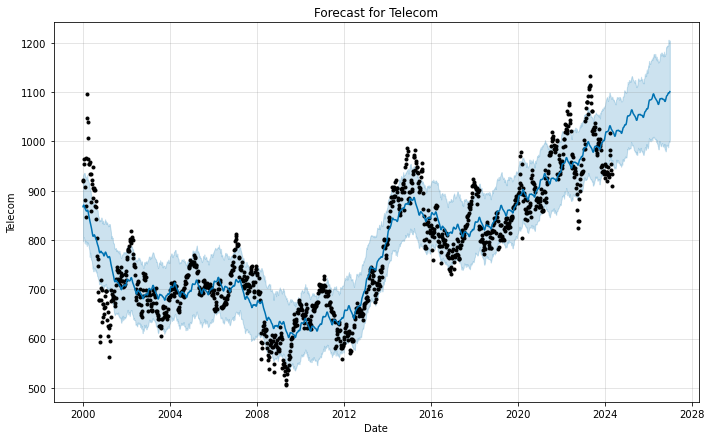

In [49]:
columns_to_forecast = ['Technology', 'Financials', 'Industrials', 'Telecom']

models = {}
forecasts = {}

pdf_filename = 'forecast_switzerland.pdf'
pdf_pages = PdfPages(pdf_filename)

for column in columns_to_forecast:
    prophet_df = switzerland[[column]].copy()
    
    prophet_df.reset_index(inplace=True)
    
    prophet_df.rename(columns={prophet_df.columns[0]: 'ds', column: 'y'}, inplace=True)
    
    prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], errors='coerce')
    
    prophet_df = prophet_df.dropna(subset=['ds'])
    
    model = Prophet()
    model.fit(prophet_df)
    last_date = prophet_df['ds'].max()
    end_date = pd.to_datetime('2027-01-01')
    n_weeks = (end_date - last_date).days // 7
    
    future = model.make_future_dataframe(periods=n_weeks, freq='W')
    
    forecast = model.predict(future)
    
    models[column] = model
    forecasts[column] = forecast
    
    fig1 = model.plot(forecast)
    plt.title(f'Forecast for {column}')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.show()
    pdf_pages.savefig(fig1)
    plt.close(fig1)
    fig2 = model.plot_components(forecast)
    pdf_pages.savefig(fig2)
    plt.close(fig2)
    plt.show()
pdf_pages.close()

In [ ]:
columns_to_forecast = ['Technology', 'Financials', 'Industrials', 'Telecom']
forecast_start = '2024-05-01'
forecast_end = '2027-01-01'
forecast_steps = len(pd.date_range(start=forecast_start, end=forecast_end, freq='W-WED'))

sarima_models = {}
forecasts = {}

pdf_filename = 'sarima_forecast_portugal.pdf'
pdf_pages = PdfPages(pdf_filename)


for column in columns_to_forecast:
    print(f"\nProcessing column: {column}\n")

    result = adfuller(portugal[column])
    print(f'ADF Statistic for {column}: {result[0]}')
    print(f'p-value for {column}: {result[1]}')

    if result[1] > 0.05:
        print(f"{column} series is non-stationary. Differencing is needed.")

    try:
        stepwise_model = auto_arima(portugal[column], start_p=1, start_q=1,
                                    max_p=3, max_q=3, m=52,  
                                    start_P=0, seasonal=True,
                                    d=1, D=1, trace=True,
                                    error_action='ignore',
                                    suppress_warnings=True,
                                    stepwise=True)

        print(stepwise_model.summary())

        model = SARIMAX(portugal[column],
                        order=stepwise_model.order,
                        seasonal_order=stepwise_model.seasonal_order)

        results = model.fit()

        forecast = results.get_forecast(steps=forecast_steps)
        forecast_index = pd.date_range(start=forecast_start, periods=forecast_steps, freq='W-WED')
        forecast_values = forecast.predicted_mean
        forecast_conf_int = forecast.conf_int()

        sarima_models[column] = results
        forecasts[column] = (forecast_values, forecast_conf_int)

        plt.figure(figsize=(12, 8))
        plt.plot(portugal[column], label='Historical Data')
        plt.plot(forecast_index, forecast_values, label='Forecast', color='red')
        plt.fill_between(forecast_index,
                         forecast_conf_int.iloc[:, 0],
                         forecast_conf_int.iloc[:, 1], color='pink', alpha=0.3)
        plt.legend()
        plt.title(f'Forecasting {column} Data')
        plt.xlabel('Date')
        plt.ylabel(column)
        plt.show()
        pdf_pages.savefig()
        plt.close()

    except Exception as e:
        print(f"An error occurred for {column}: {e}")
pdf_pages.close()

21:47:16 - cmdstanpy - INFO - Chain [1] start processing
21:47:16 - cmdstanpy - INFO - Chain [1] done processing


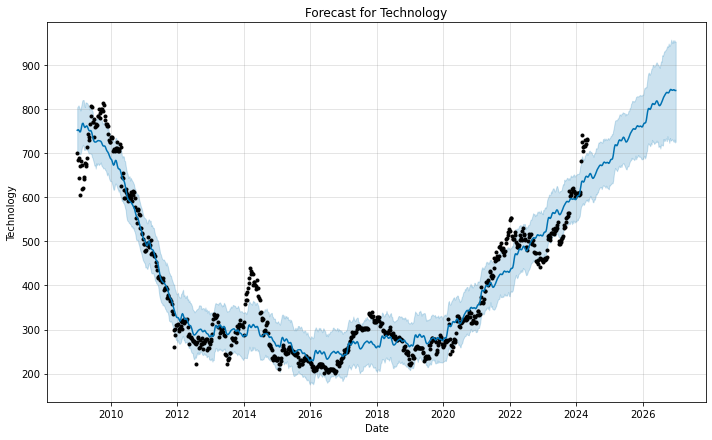

21:47:17 - cmdstanpy - INFO - Chain [1] start processing
21:47:17 - cmdstanpy - INFO - Chain [1] done processing


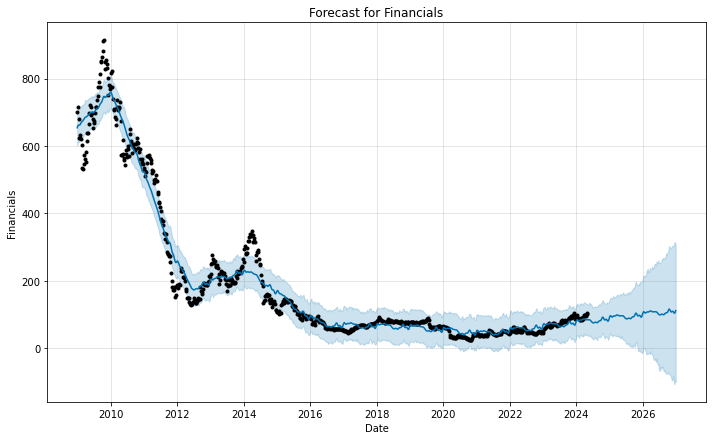

21:47:18 - cmdstanpy - INFO - Chain [1] start processing
21:47:18 - cmdstanpy - INFO - Chain [1] done processing


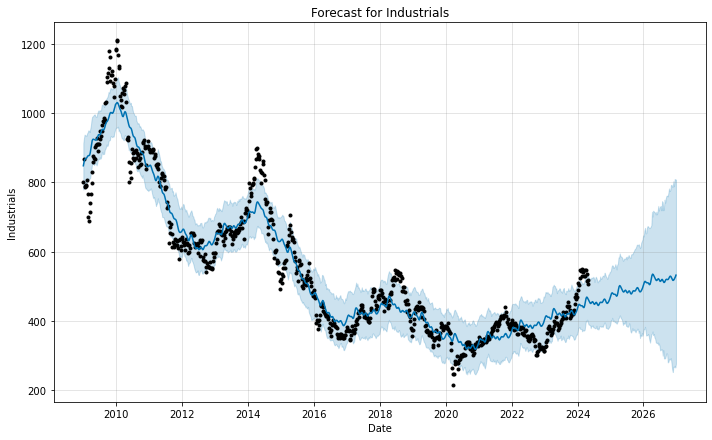

21:47:18 - cmdstanpy - INFO - Chain [1] start processing
21:47:18 - cmdstanpy - INFO - Chain [1] done processing


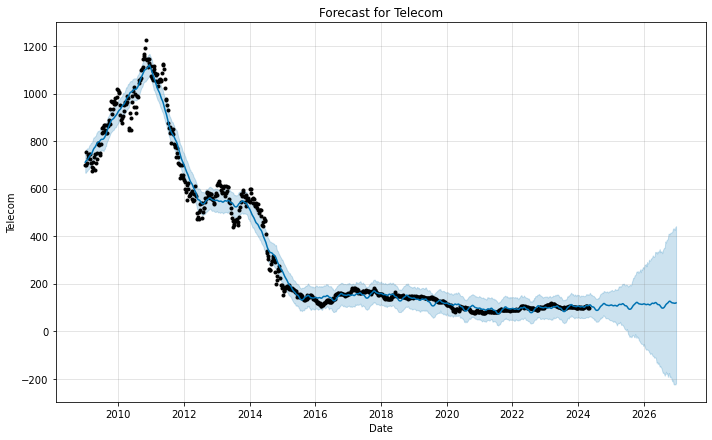

In [50]:
columns_to_forecast = ['Technology', 'Financials', 'Industrials', 'Telecom']

models = {}
forecasts = {}

pdf_filename = 'forecast_portugal.pdf'
pdf_pages = PdfPages(pdf_filename)

for column in columns_to_forecast:
    prophet_df = portugal[[column]].copy()
    
    prophet_df.reset_index(inplace=True)
    
    prophet_df.rename(columns={prophet_df.columns[0]: 'ds', column: 'y'}, inplace=True)
    
    prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], errors='coerce')
    
    prophet_df = prophet_df.dropna(subset=['ds'])
    
    model = Prophet()
    model.fit(prophet_df)
    last_date = prophet_df['ds'].max()
    end_date = pd.to_datetime('2027-01-01')
    n_weeks = (end_date - last_date).days // 7
    
    future = model.make_future_dataframe(periods=n_weeks, freq='W')
    
    forecast = model.predict(future)
    
    models[column] = model
    forecasts[column] = forecast
    
    fig1 = model.plot(forecast)
    plt.title(f'Forecast for {column}')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.show()
    pdf_pages.savefig(fig1)
    plt.close(fig1)
    fig2 = model.plot_components(forecast)
    pdf_pages.savefig(fig2)
    plt.close(fig2)
    plt.show()
pdf_pages.close()